## Importing the relevant libraries

In [208]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings, gc, joblib, os, mysql.connector
warnings.filterwarnings('ignore')
from sklearnex import patch_sklearn
patch_sklearn()
from scipy.stats import probplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, PassiveAggressiveRegressor, SGDRegressor, Lasso, Ridge, ElasticNet, BayesianRidge, ARDRegression, RANSACRegressor, PoissonRegressor, HuberRegressor, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor, BaggingRegressor, HistGradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import MinMaxScaler, FunctionTransformer, PowerTransformer
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFromModel, f_regression, RFE, SequentialFeatureSelector
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
from sklearn.pipeline import Pipeline
from sqlalchemy import create_engine
from mysql.connector import Error
from tqdm.notebook import tqdm
from dotenv import load_dotenv
from feature_engine.outliers import Winsorizer
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures
from yellowbrick.regressor import PredictionError, ResidualsPlot
from sklearn.compose import ColumnTransformer

# Load environment variables from .env file
load_dotenv()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


True

In [2]:
# Extracting environment variables from the dotenv file
db_username = os.getenv("DB_USERNAME")
db_password = os.getenv("DB_PASSWORD")

## Loading the dataset

In [3]:
df = pd.read_csv('data.csv')
df.drop('Unnamed: 0',axis=1,inplace=True)
df.head()

,trip_duration,distance_traveled,num_of_passengers,fare,tip,miscellaneous_fees,total_fare,surge_applied
0,748.0,2.75,1.0,75.00,24,6.300,105.300,0
1,1187.0,3.43,1.0,105.00,24,13.200,142.200,0
2,730.0,3.12,1.0,71.25,0,26.625,97.875,1
3,671.0,5.63,3.0,90.00,0,9.750,99.750,0
4,329.0,2.09,1.0,45.00,12,13.200,70.200,0


## Data Exploration

In [4]:
df.shape

(299534, 8)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299534 entries, 0 to 299533
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   trip_duration       299534 non-null  float64
 1   distance_traveled   299534 non-null  float64
 2   num_of_passengers   299534 non-null  float64
 3   fare                299534 non-null  float64
 4   tip                 299534 non-null  int64  
 5   miscellaneous_fees  299534 non-null  float64
 6   total_fare          299534 non-null  float64
 7   surge_applied       299534 non-null  int64  
dtypes: float64(6), int64(2)
memory usage: 18.3 MB


In [6]:
df.describe()

,trip_duration,distance_traveled,num_of_passengers,fare,tip,miscellaneous_fees,total_fare,surge_applied
count,299534.000000,299534.000000,299534.000000,299534.000000,299534.000000,299534.000000,299534.000000,299534.000000
mean,1165.680417,5.717167,1.290985,69.736136,13.030891,15.152971,89.453417,0.281050
std,4727.006306,321.516385,0.927814,84.933388,19.880049,12.590909,101.301805,0.449513
min,0.000000,0.020000,0.000000,0.000000,0.000000,-0.500000,0.000000,0.000000
25%,446.000000,1.950000,1.000000,0.000000,0.000000,6.000000,0.000000,0.000000
50%,706.000000,3.200000,1.000000,56.250000,9.000000,9.750000,74.700000,0.000000
75%,1097.000000,5.730000,1.000000,93.750000,20.000000,26.450000,126.000000,1.000000
max,86395.000000,145517.600000,9.000000,4466.250000,2500.000000,435.000000,4472.250000,1.000000


In [7]:
df.isna().sum()

trip_duration         0
distance_traveled     0
num_of_passengers     0
fare                  0
tip                   0
miscellaneous_fees    0
total_fare            0
surge_applied         0
dtype: int64

In [8]:
df = df[df.miscellaneous_fees >= 0]
df.shape

(299500, 8)

In [9]:
try:
    connection = mysql.connector.connect(host='localhost',
                                         database='taxi_trip_fares',
                                         user=f"{db_username}",
                                         password=f"{db_password}")
    print("Connection to the MySQL database established successfully!")
except Error as e:
    print("Error connecting to MySQL database", e)

Connection to the MySQL database established successfully!


In [10]:
# create cursor
cursor=connection.cursor()
cursor

In [11]:
df.rename({'distance_traveled': 'distance_travelled', 
           'num_of_passengers': 'no_passengers'},axis=1,inplace=True)

In [12]:
# cols = "`,`".join([str(i) for i in df.columns.tolist()])

# for index, row in tqdm(df.iterrows()):
#     sql = f"INSERT INTO `fares` (`" + cols + "`) VALUES (" + "%s,"*(len(row)-1) + "%s)"
#     cursor.execute(sql, tuple(row)) 
#     connection.commit()

In [13]:
sql = "SELECT * FROM `fares`"

cursor.execute(sql)

records = cursor.fetchall()
len(records)

299500

In [14]:
records[0]

(748.0, 2.75, 1.0, 75.0, 24, 6.3, 105.3, 0)

In [15]:
cursor.execute(f"SHOW COLUMNS FROM `fares`")

In [16]:
column_names = [row[0] for row in cursor.fetchall()]
column_names

['trip_duration',
 'distance_travelled',
 'no_passengers',
 'fare',
 'tip',
 'miscellaneous_fees',
 'total_fare',
 'surge_applied']

In [17]:
data = pd.DataFrame(records,columns=column_names)
data.head()

,trip_duration,distance_travelled,no_passengers,fare,tip,miscellaneous_fees,total_fare,surge_applied
0,748.0,2.75,1.0,75.00,24,6.300,105.300,0
1,1187.0,3.43,1.0,105.00,24,13.200,142.200,0
2,730.0,3.12,1.0,71.25,0,26.625,97.875,1
3,671.0,5.63,3.0,90.00,0,9.750,99.750,0
4,329.0,2.09,1.0,45.00,12,13.200,70.200,0


In [18]:
data.shape

(299500, 8)

In [19]:
del data
gc.collect()

8

In [20]:
connection.close()

## Exploratory Data Analysis

Skewness of trip_duration: 16.403330770171518
Kurtosis of trip_duration: 278.76689607531


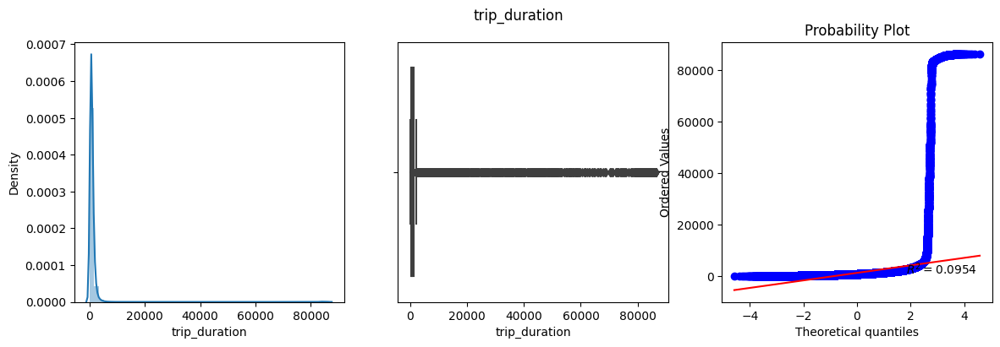

Skewness of distance_travelled: 380.98249954520566
Kurtosis of distance_travelled: 156611.96606286365


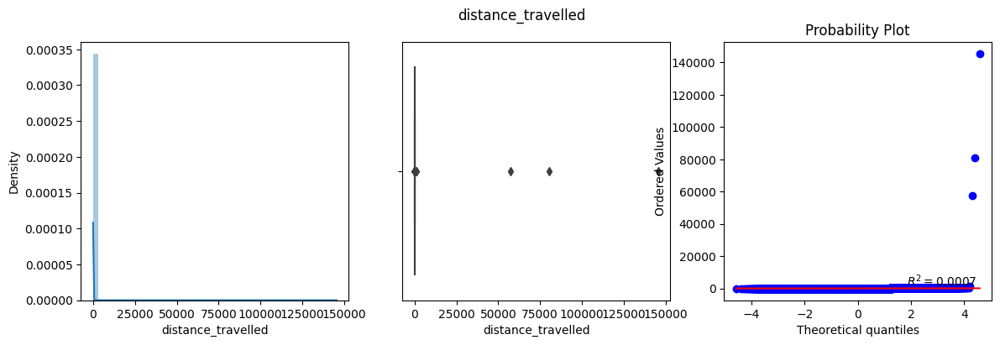

Skewness of no_passengers: 3.779201448192386
Kurtosis of no_passengers: 14.38213527364416


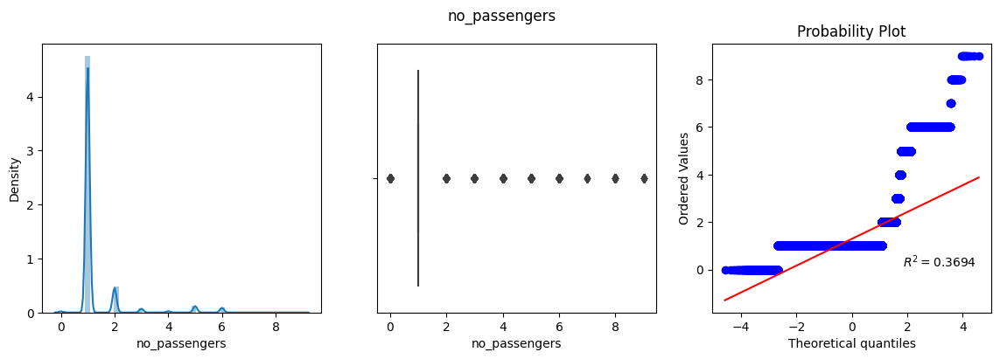

Skewness of fare: 6.6371661814402065
Kurtosis of fare: 164.07357576057015


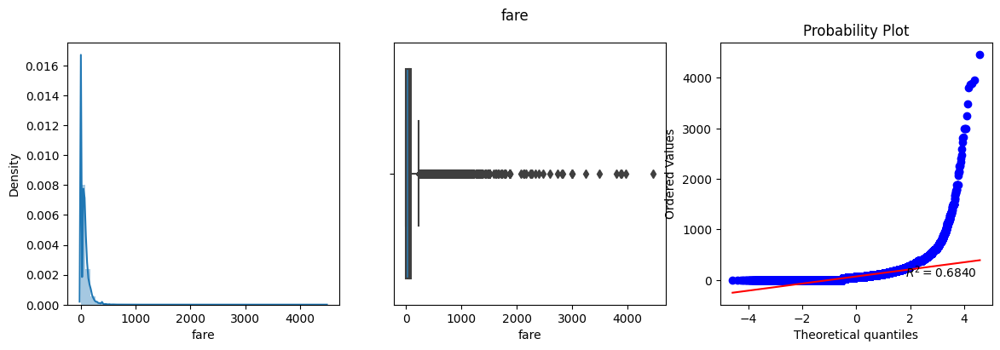

Skewness of tip: 15.075893975947846
Kurtosis of tip: 1119.2295762478018


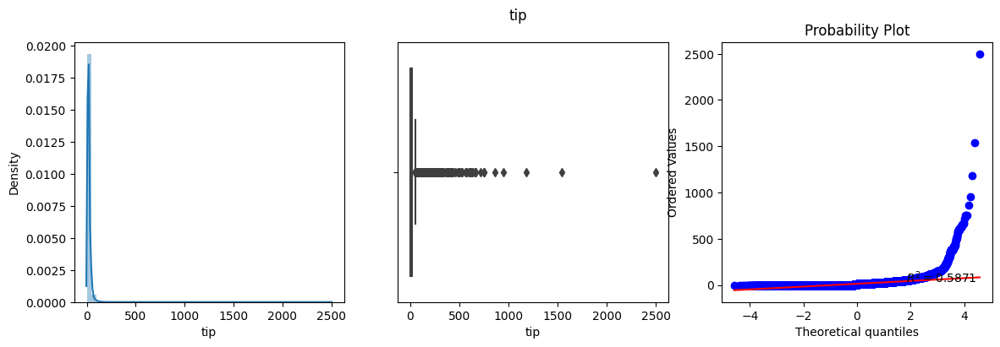

Skewness of miscellaneous_fees: 2.5254022239782485
Kurtosis of miscellaneous_fees: 22.53451875294586


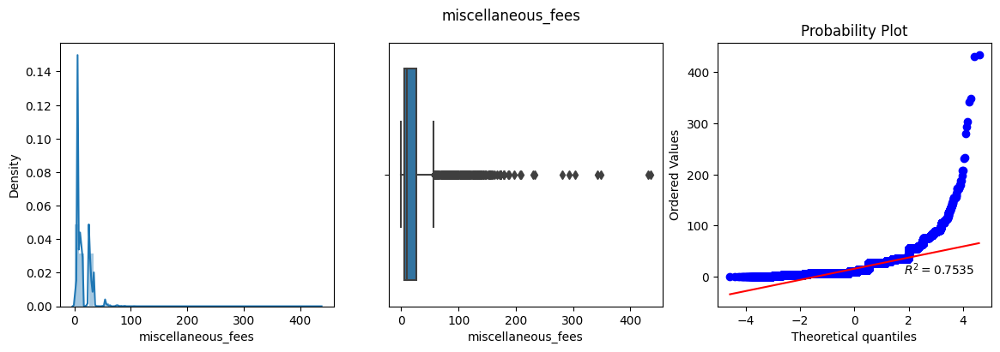

Skewness of total_fare: 4.804961719477721
Kurtosis of total_fare: 89.73152041385738


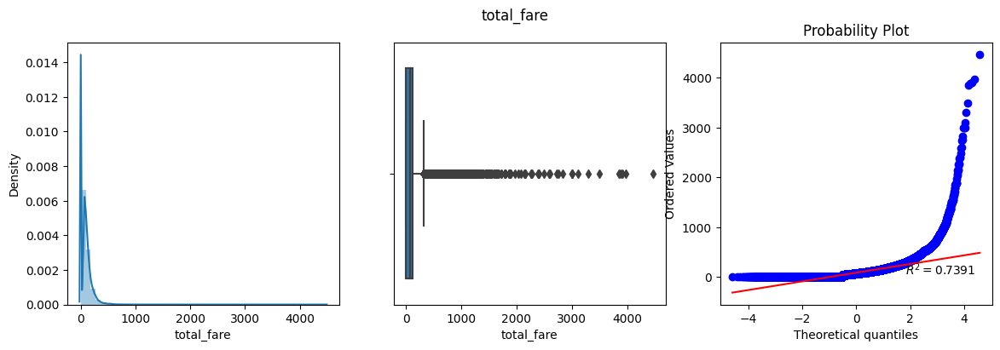

Skewness of surge_applied: 0.9739976966824767
Kurtosis of surge_applied: -1.0513355075062143


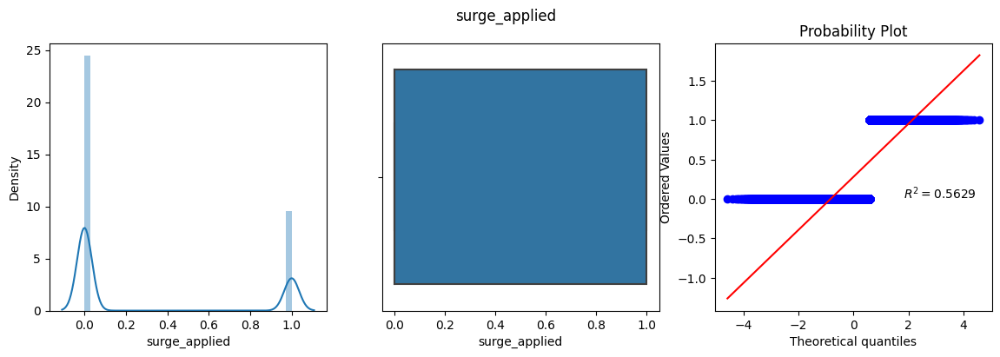

In [21]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[col])
    plt.subplot(132)
    sns.boxplot(df[col])
    plt.subplot(133)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.suptitle(col)
    plt.show()
    gc.collect();

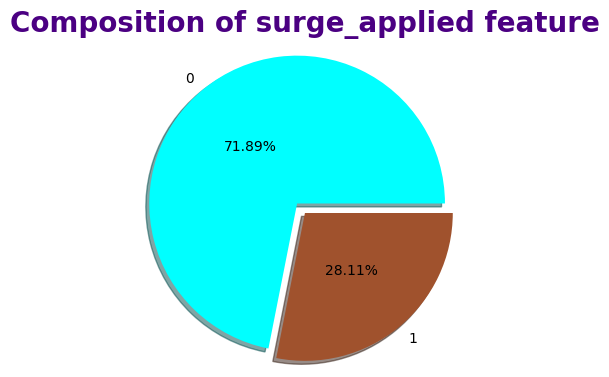

In [22]:
labels = df.surge_applied.value_counts().keys()
values = df.surge_applied.value_counts().values

plt.figure(figsize=(7,4))
plt.pie(values,labels=labels,explode=(0.1,0),shadow=True,autopct='%1.2f%%',pctdistance=0.5,radius=1.2,colors=['cyan','sienna'])
plt.title("Composition of surge_applied feature",pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show();

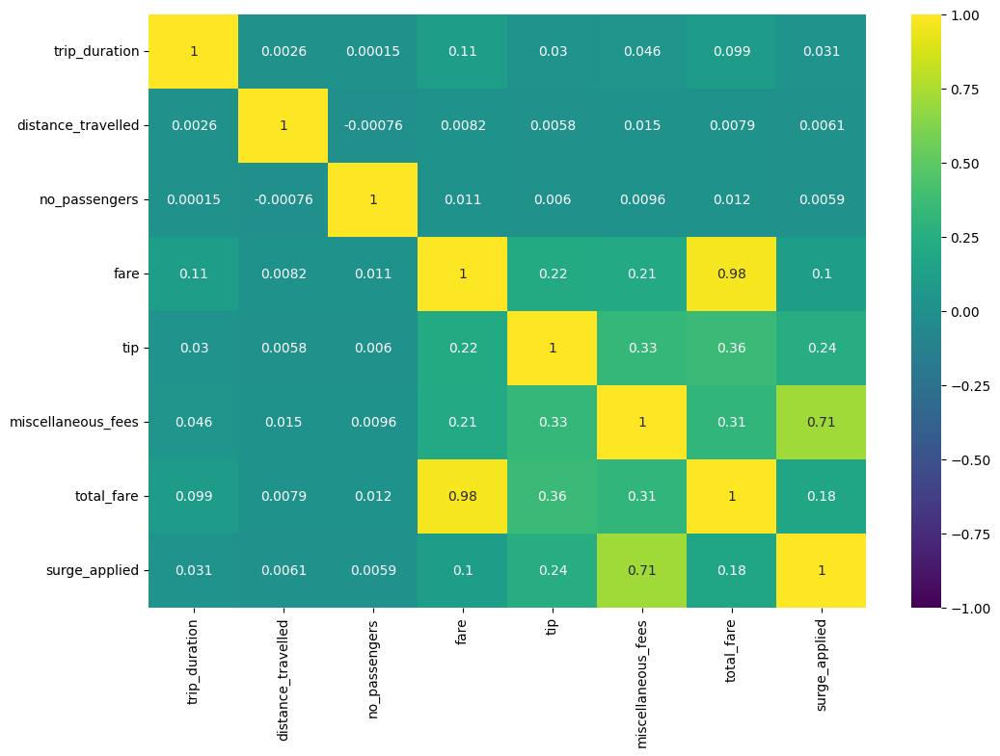

10147

In [23]:
plt.figure(figsize=(12,8))
fig = sns.heatmap(df.corr(),annot=True,cmap='viridis',vmin=-1.0,vmax=1.0)
plt.show(fig)
plt.close('all')
del fig
gc.collect()

As expected, the features "fare" and "total_fare" have a substantial positive correlation. Moreover, there is a significant positive correlation between the features, "miscellaneous_fees" and "surge_applied".

<Figure size 1200x800 with 0 Axes>

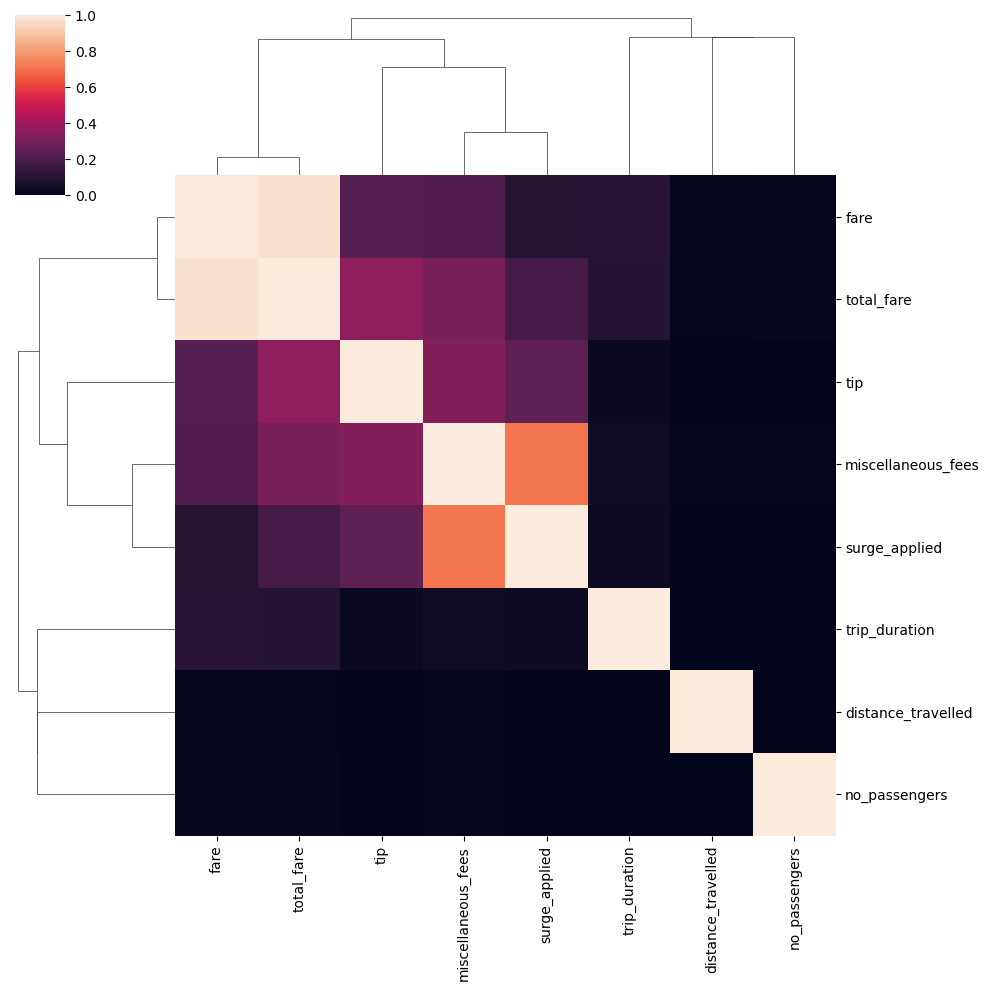

10439

In [24]:
plt.figure(figsize=(12,8))
fig = sns.clustermap(df.corr())
plt.show(fig)
plt.close('all')
del fig
gc.collect()

<Figure size 1200x800 with 0 Axes>

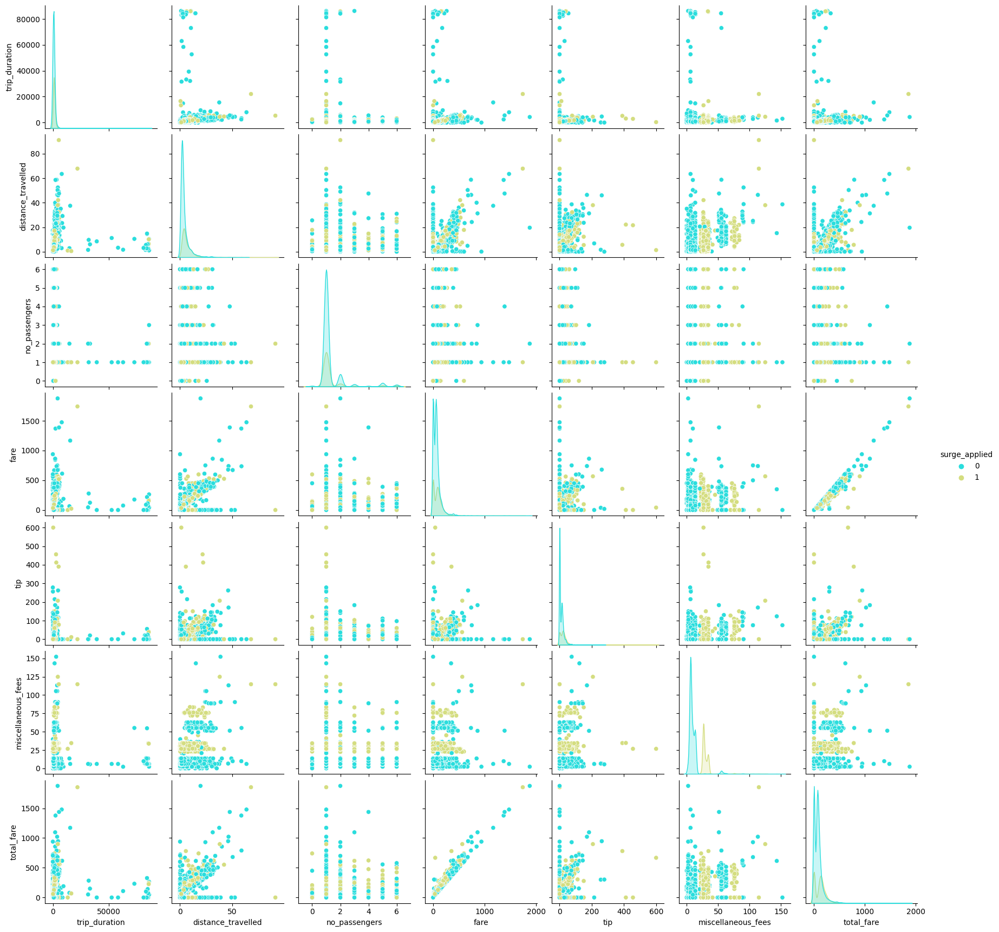

173028

In [25]:
plt.figure(figsize=(12,8))
fig = sns.pairplot(df.sample(n=10000),hue='surge_applied',palette='rainbow')
plt.show(fig)
plt.close('all')
del fig
gc.collect()

## Feature Engineering

### Feature Extraction

In [26]:
df['meter_rate'] = df['total_fare'] / df['distance_travelled']
df.meter_rate.describe()

count    299500.000000
mean         42.476597
std         502.778269
min           0.000000
25%           0.000000
50%          25.429646
75%          34.925373
max      100075.000000
Name: meter_rate, dtype: float64

In [27]:
np.corrcoef(df.meter_rate,df.total_fare)

array([[1.        , 0.15790854],
       [0.15790854, 1.        ]])

### Feature Transformation

In [28]:
def apply_transform(transformer,col):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[col])
    plt.subplot(132)
    sns.boxplot(df[col])
    plt.subplot(133)
    probplot(df[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(df[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

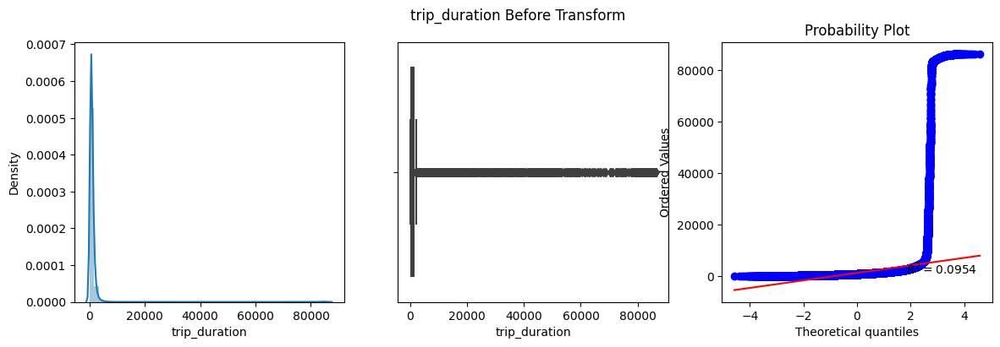

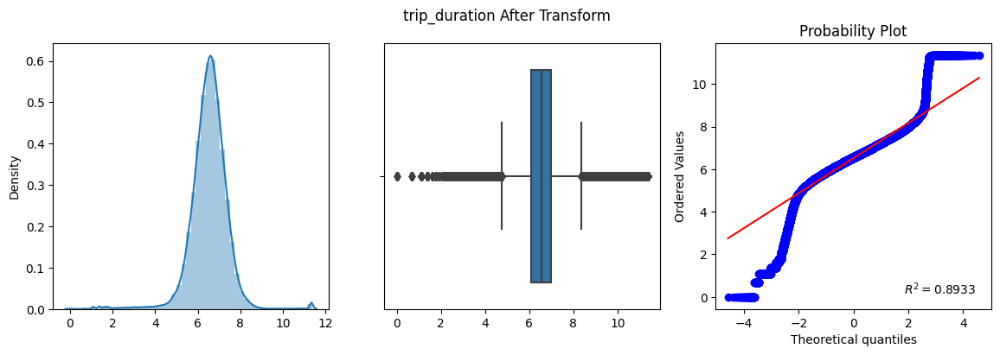

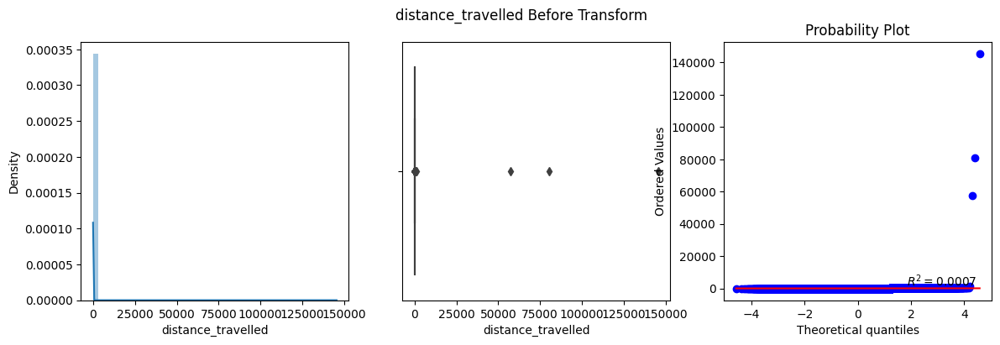

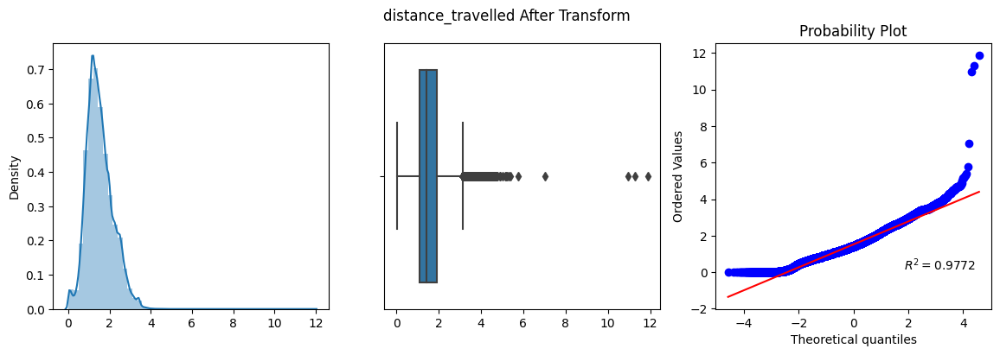

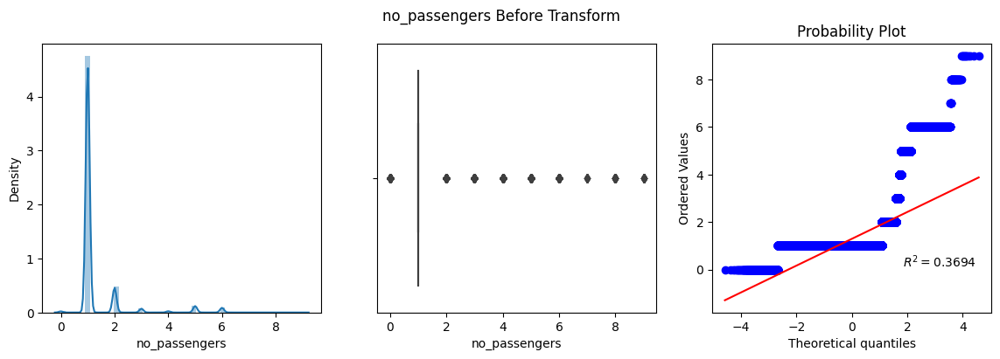

...

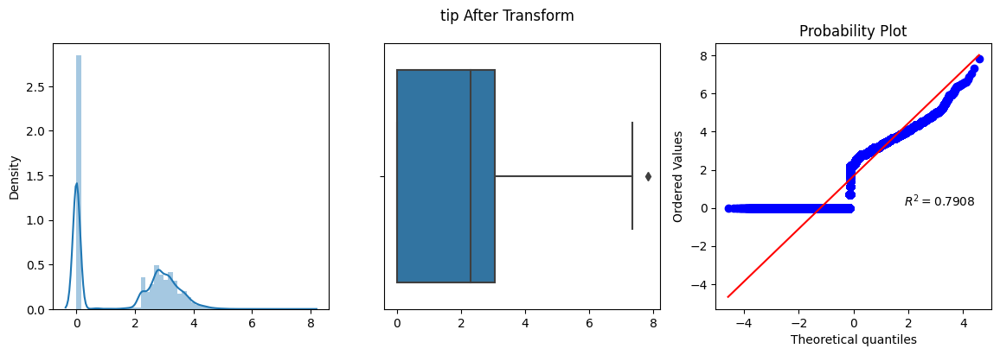

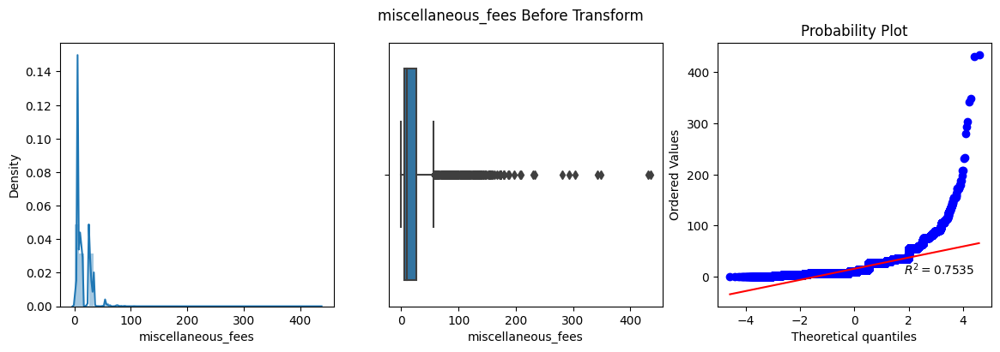

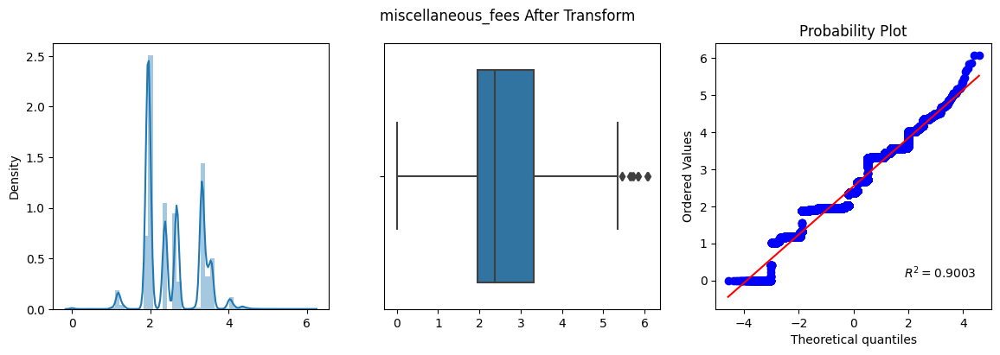

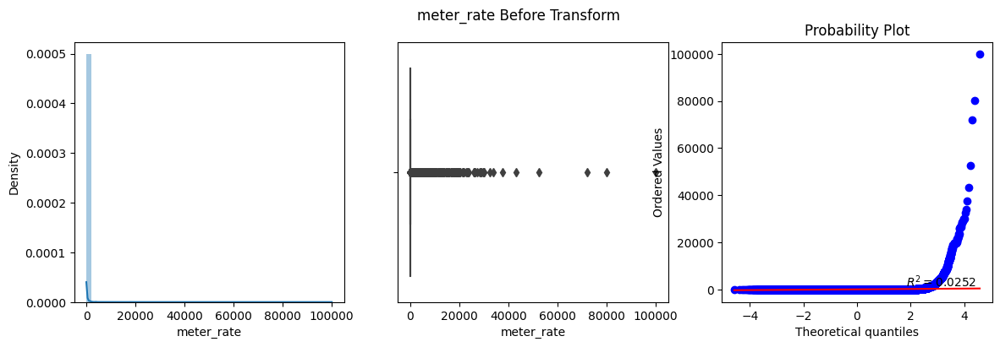

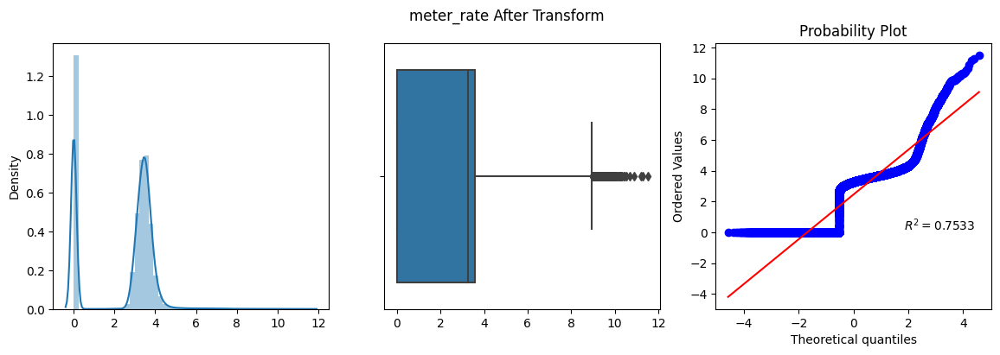

In [29]:
# Log Transform
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    apply_transform(FunctionTransformer(np.log1p),col)

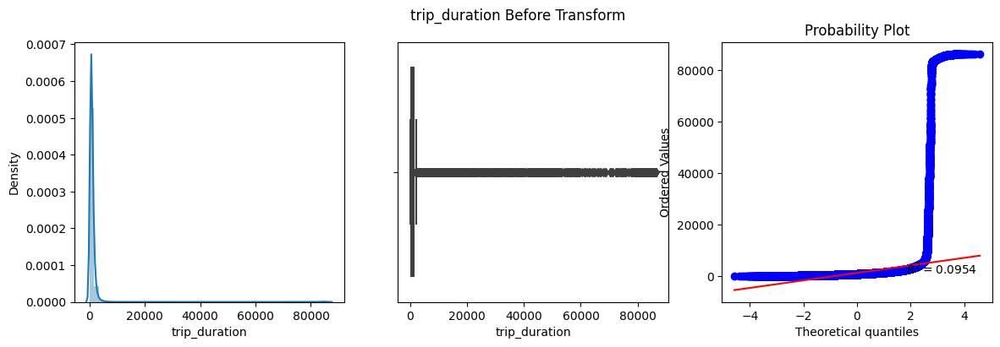

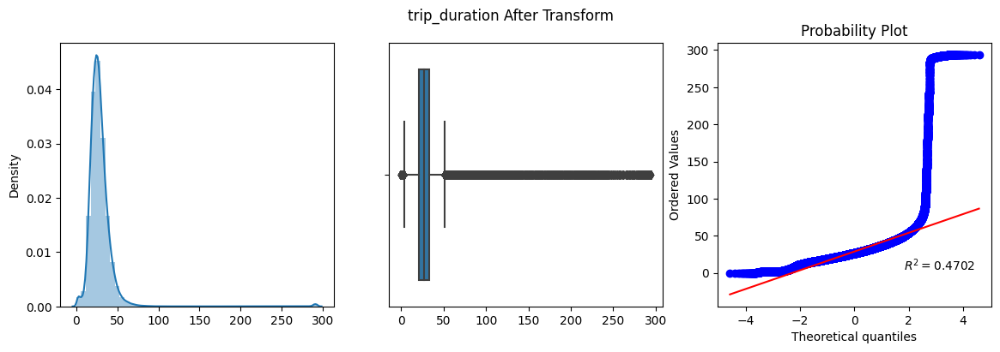

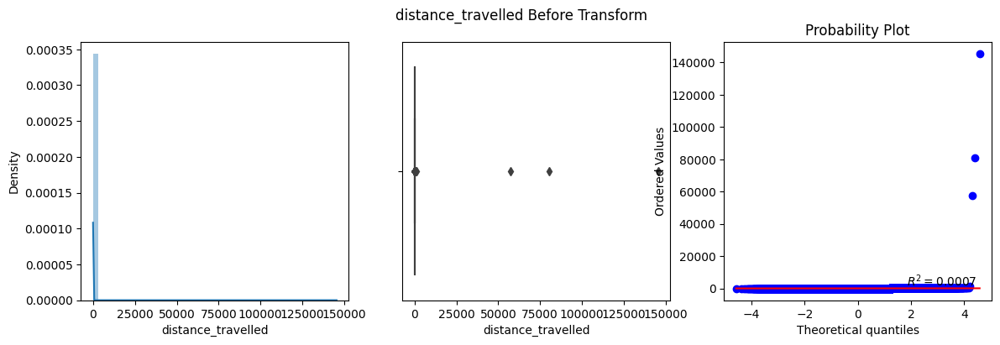

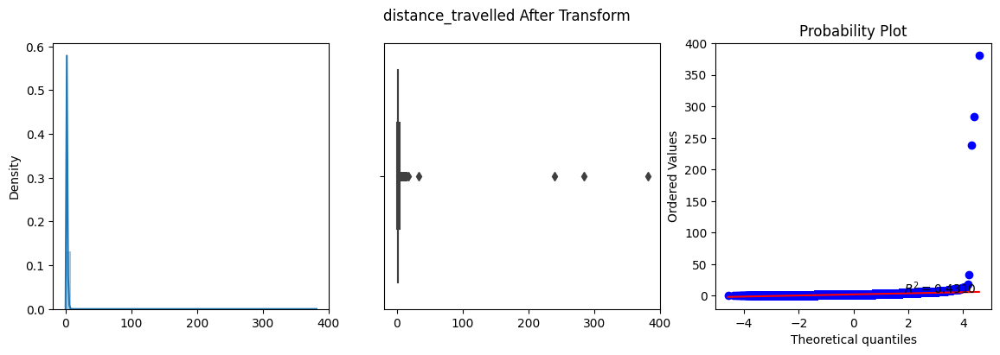

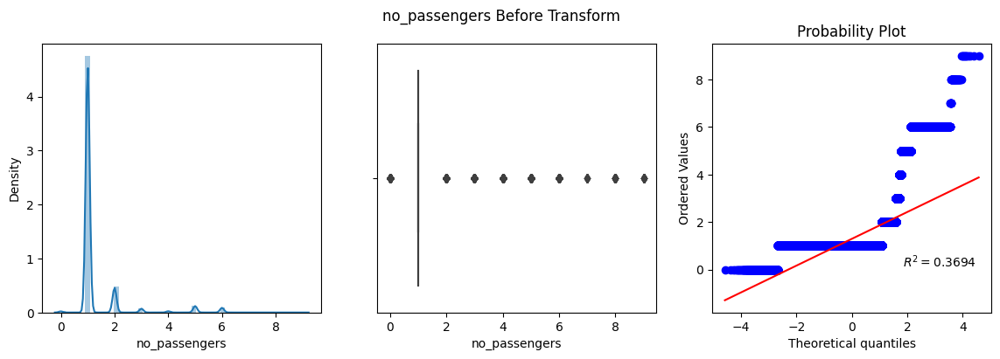

...

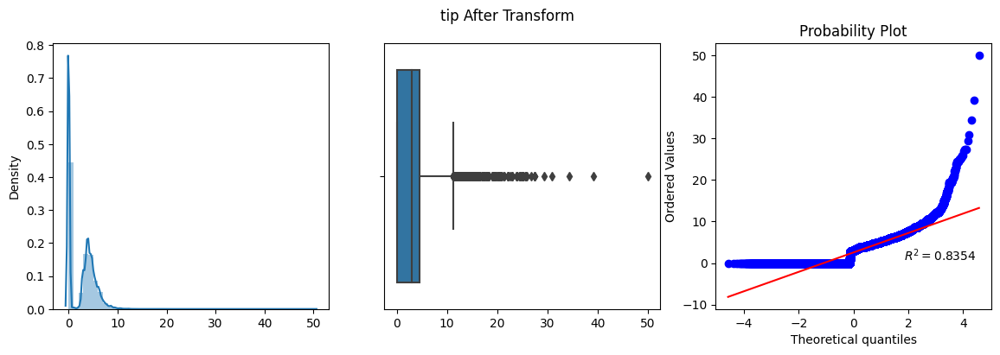

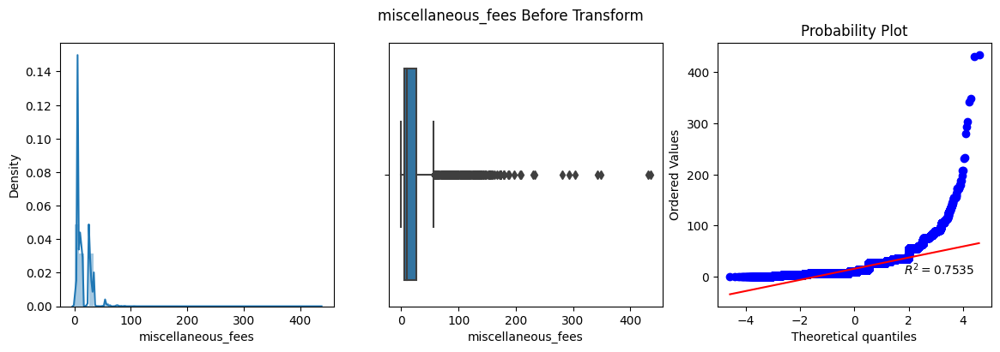

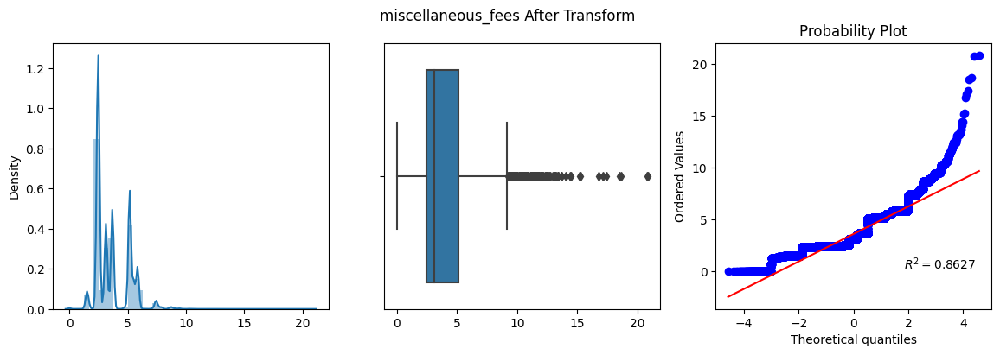

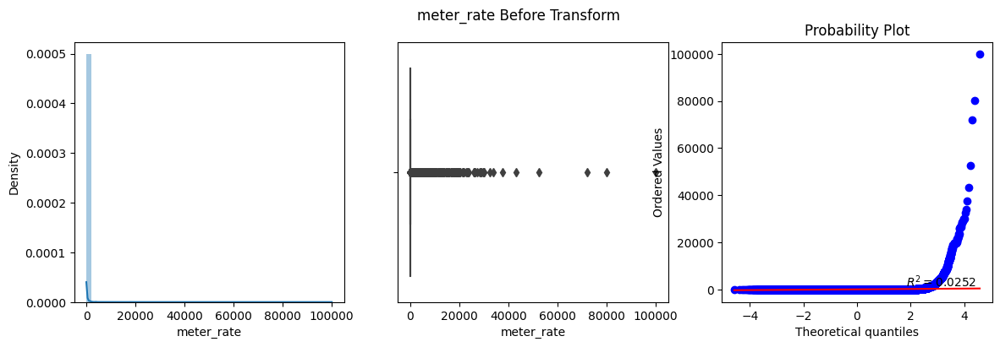

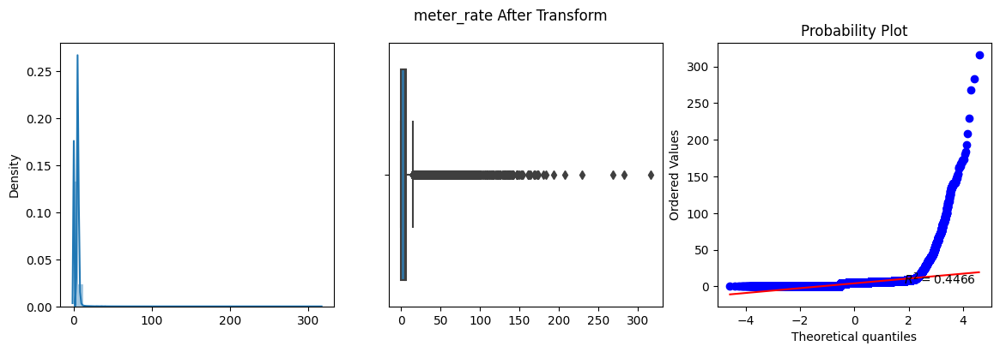

In [30]:
# Square Root Transform
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    apply_transform(FunctionTransformer(np.sqrt),col)

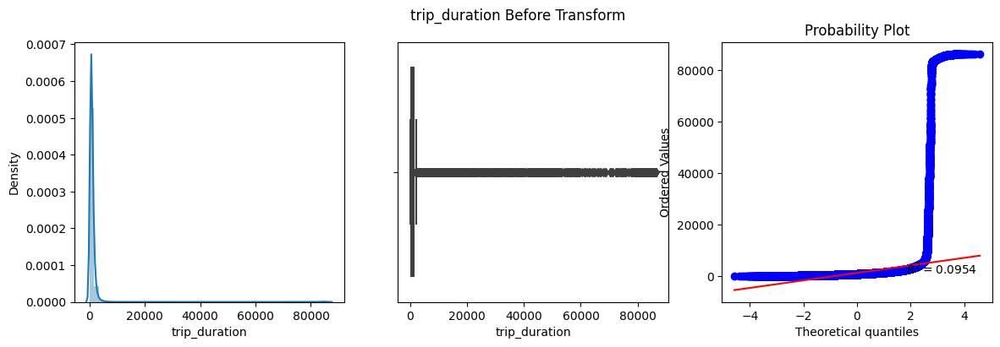

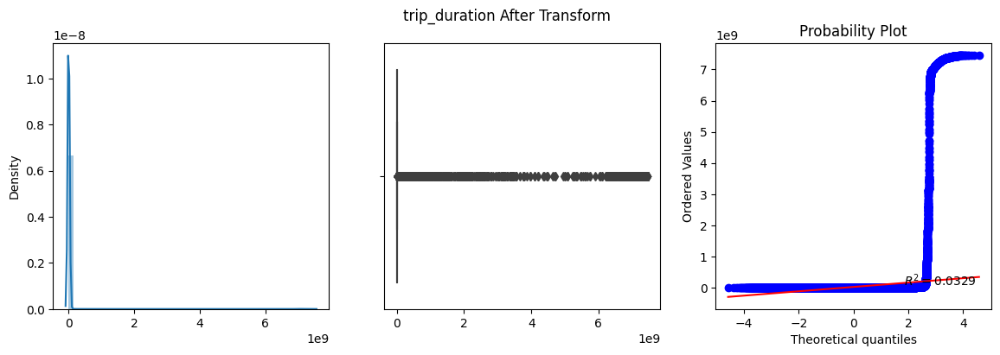

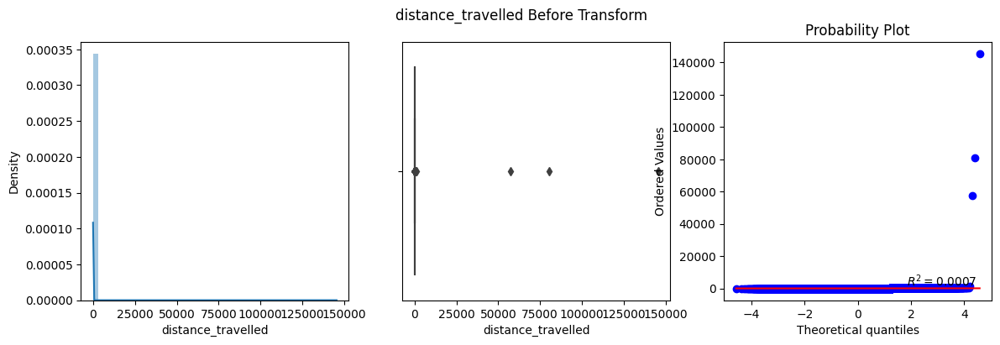

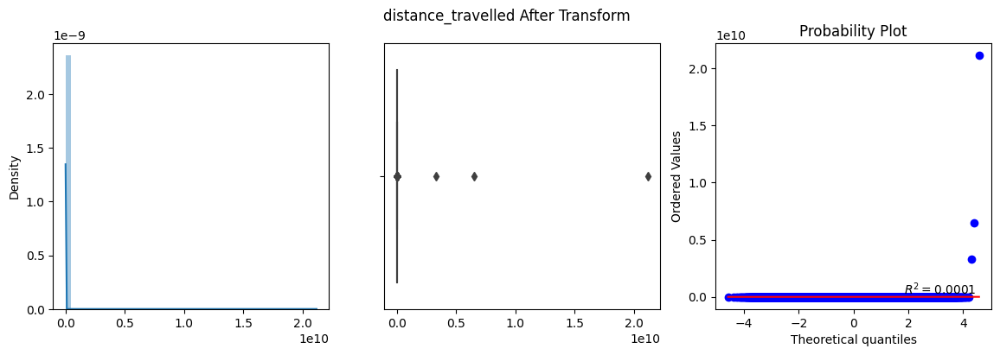

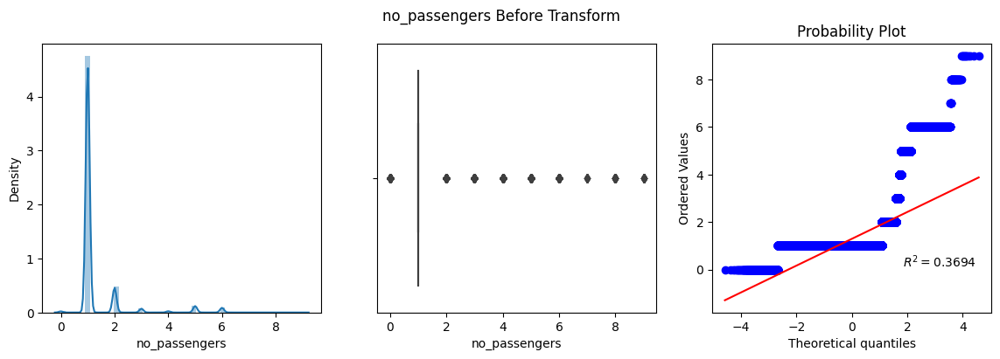

...

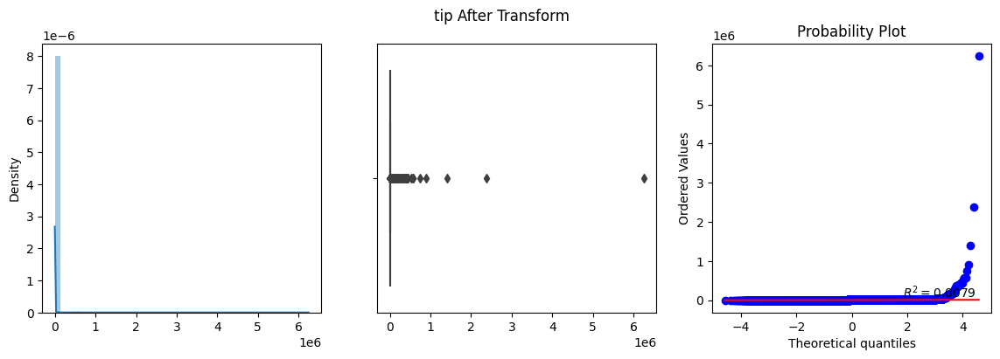

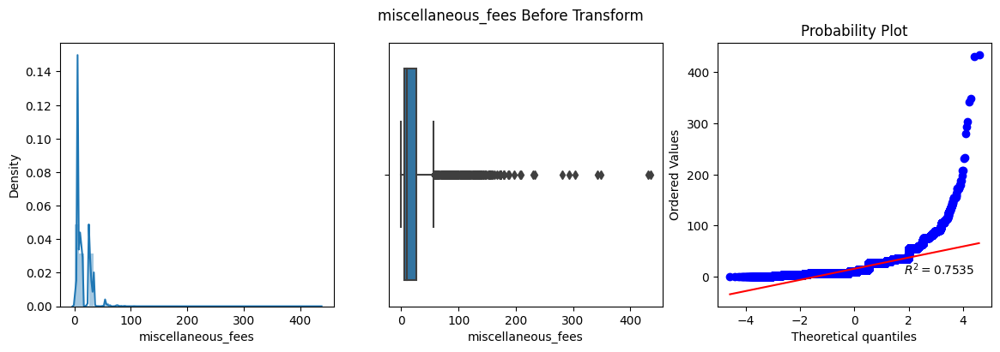

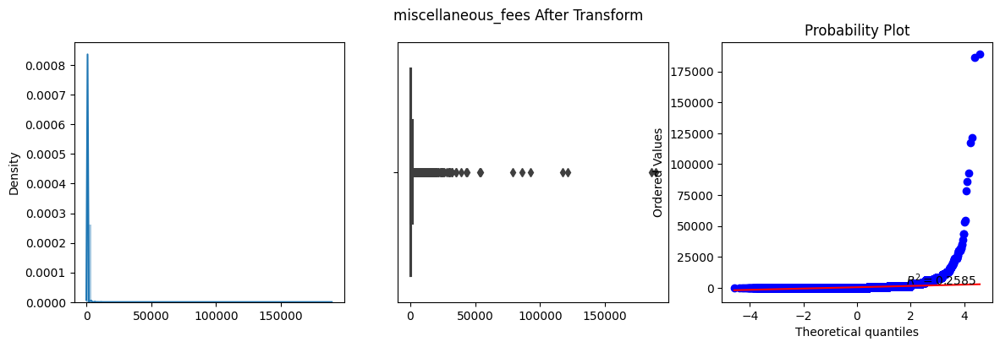

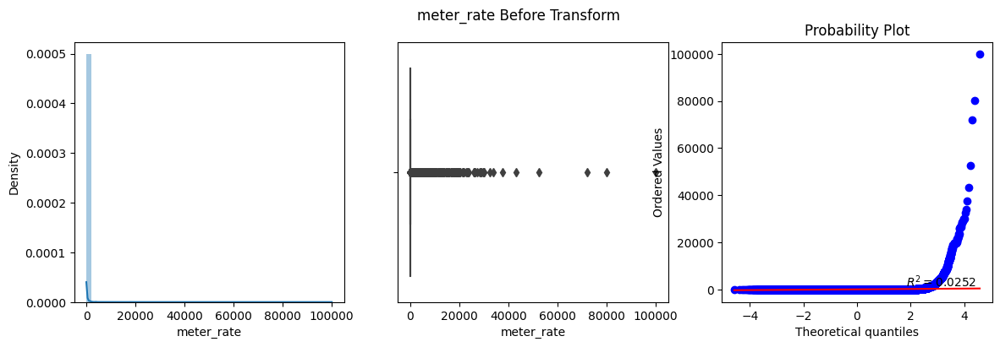

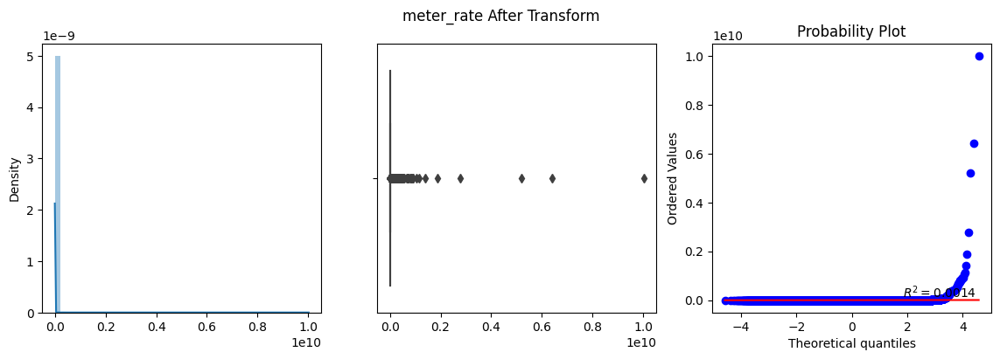

In [31]:
# Square Transform
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    apply_transform(FunctionTransformer(np.square),col)

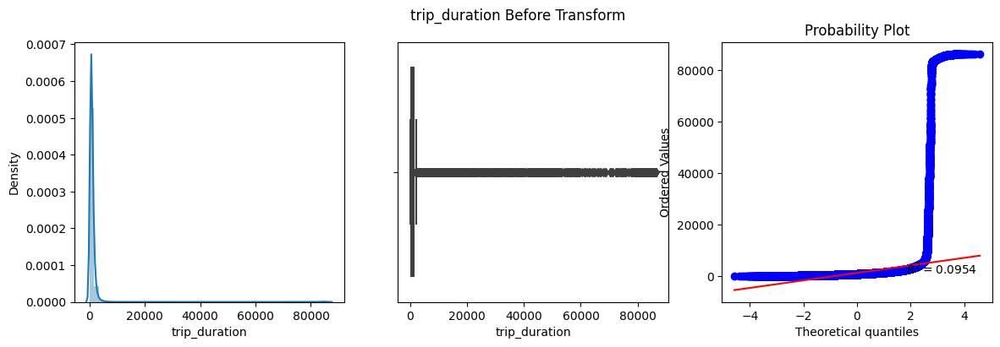

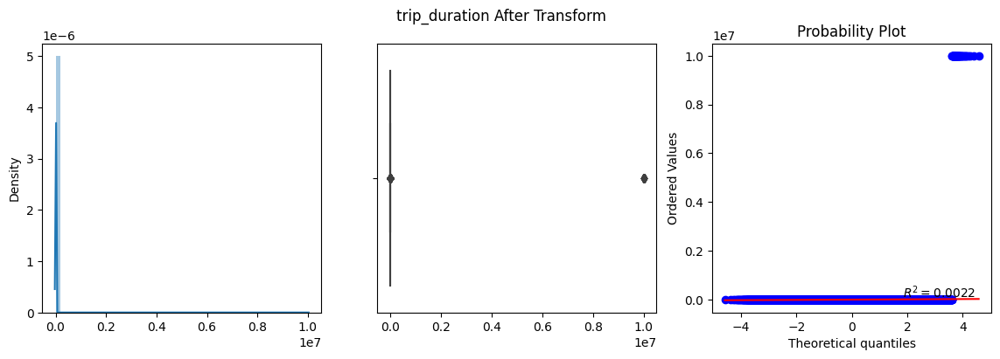

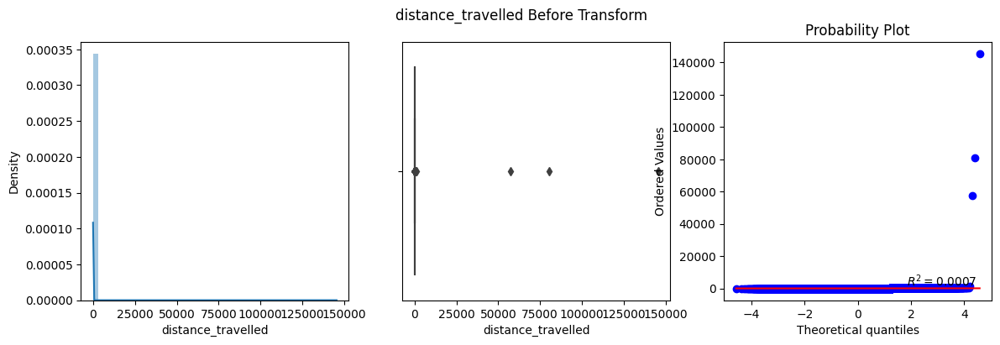

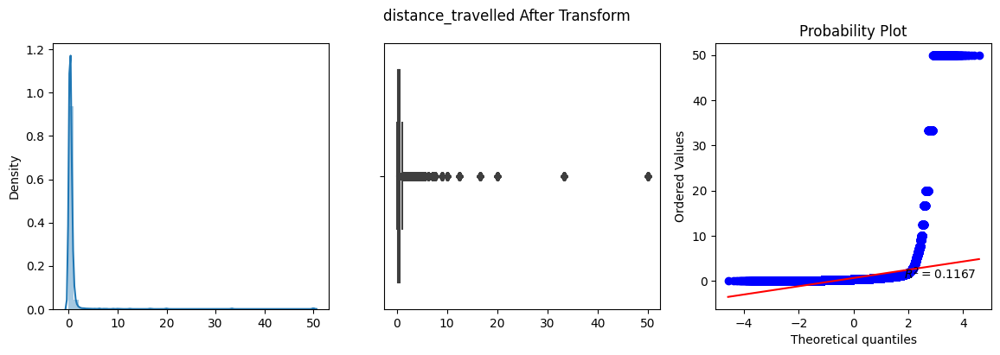

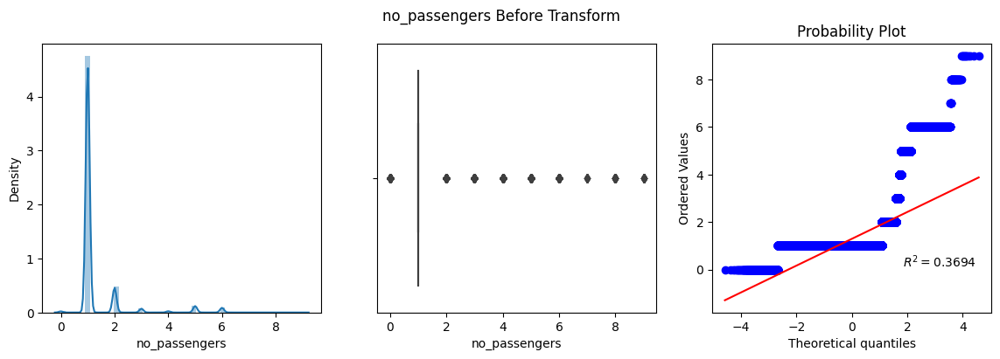

...

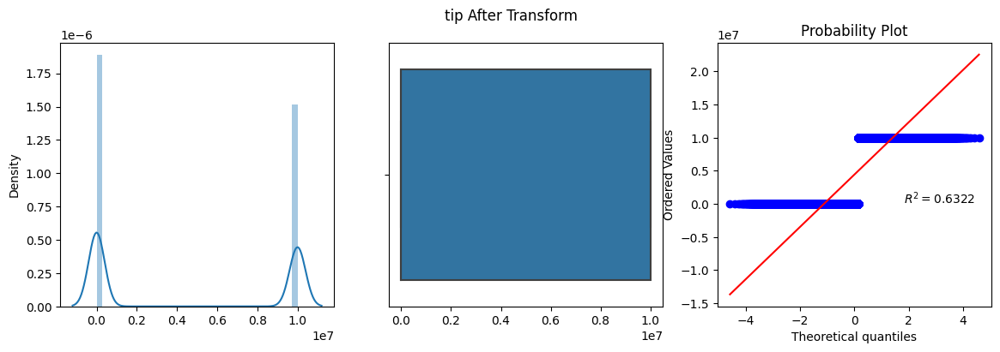

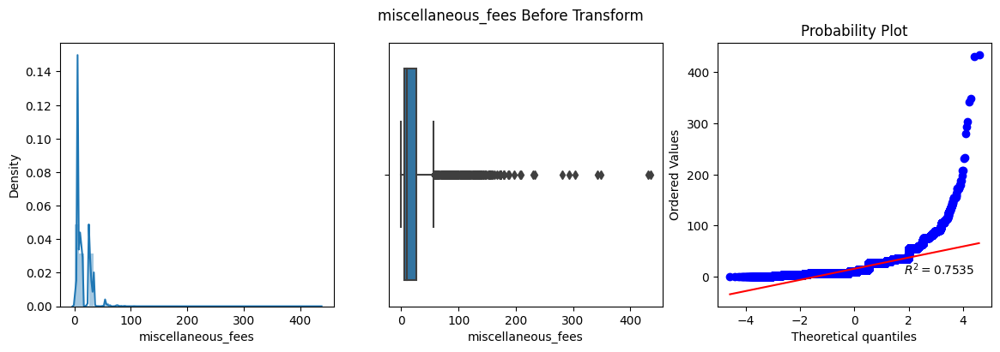

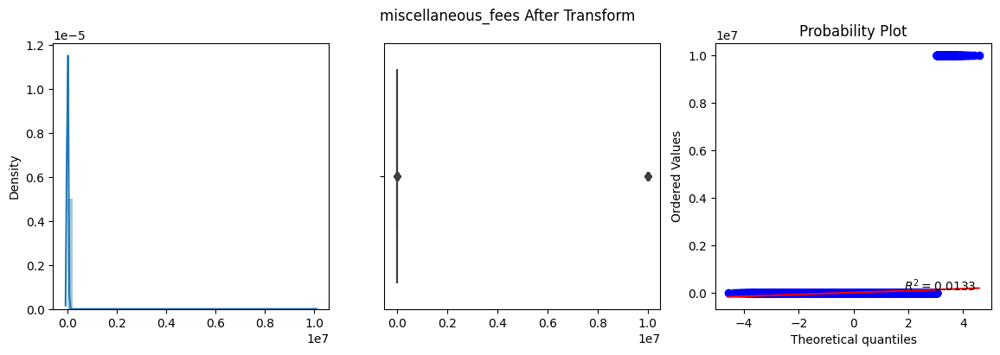

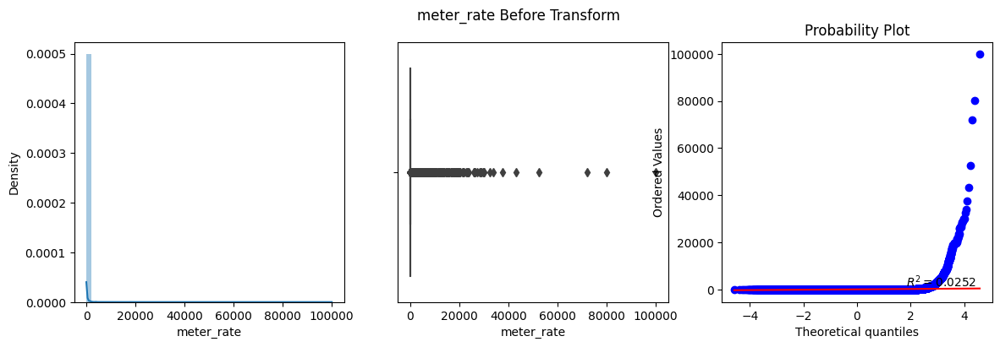

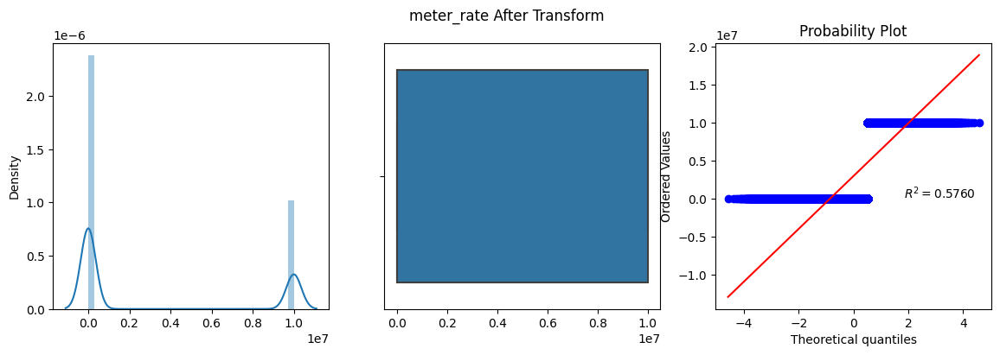

In [32]:
# Reciprocal Transform
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    apply_transform(FunctionTransformer(lambda x: 1/(x+0.0000001)),col)

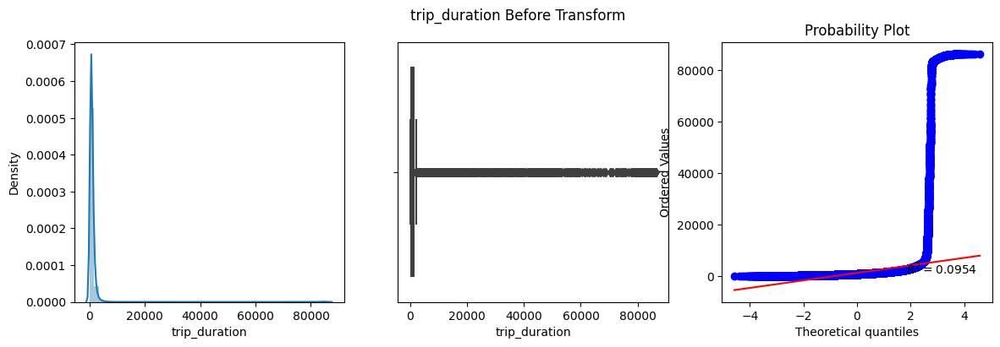

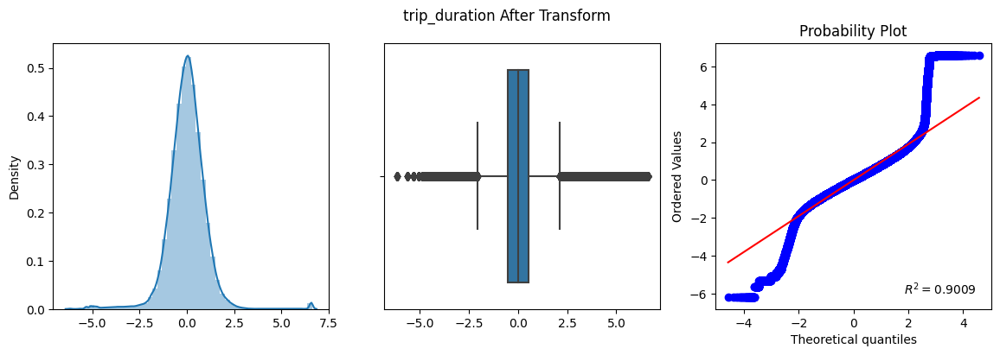

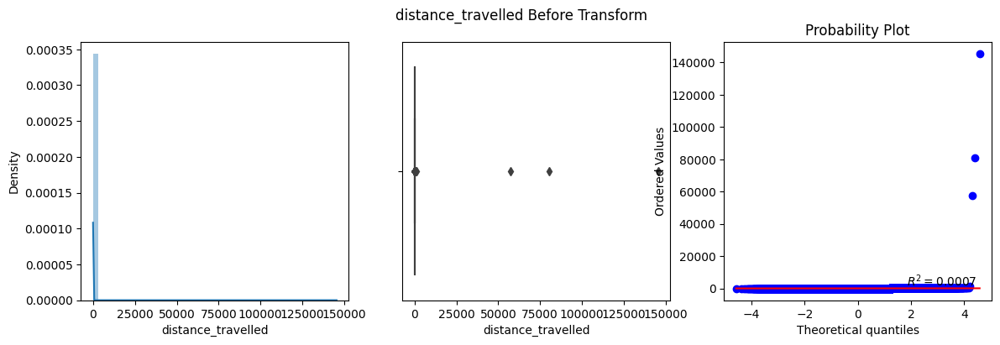

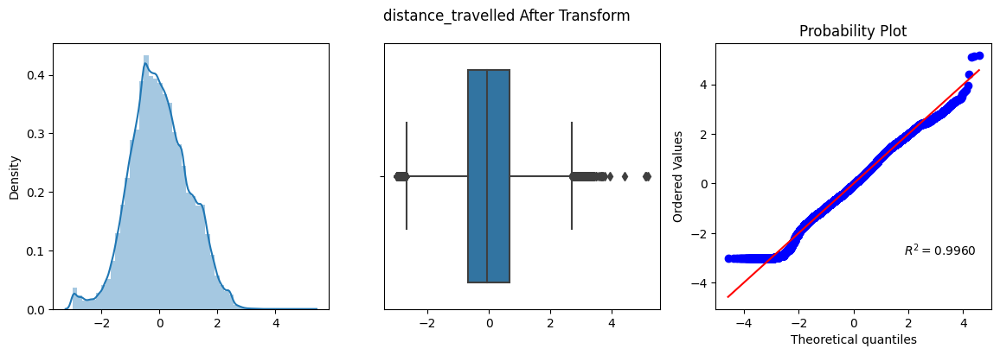

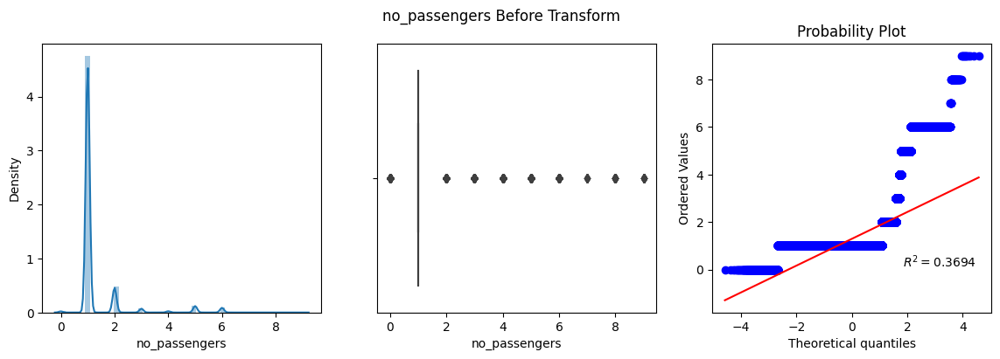

...

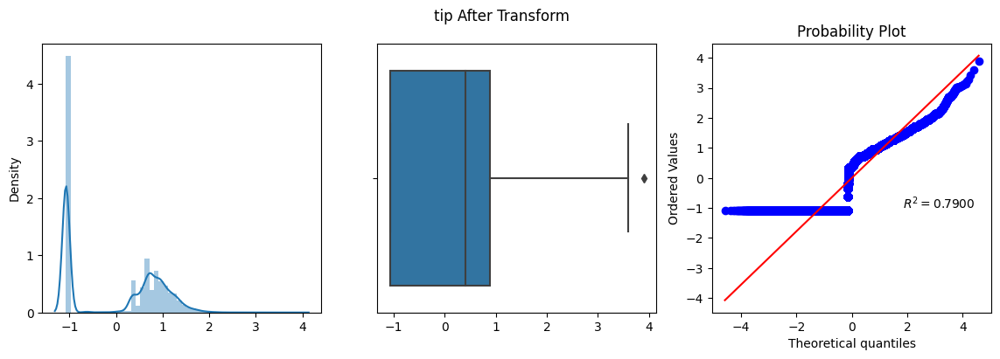

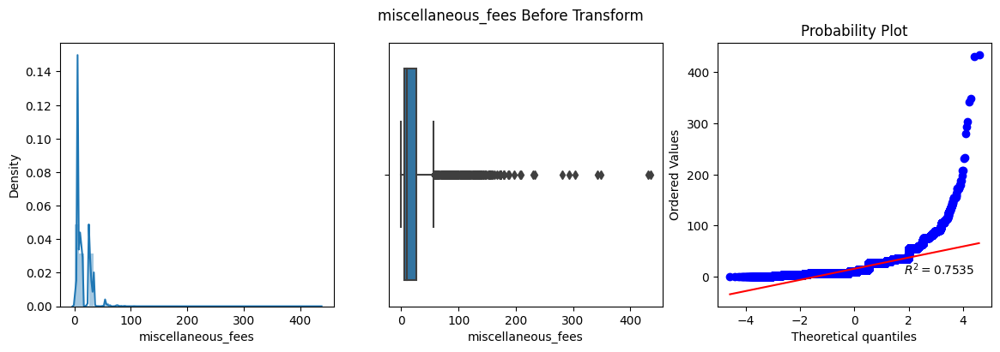

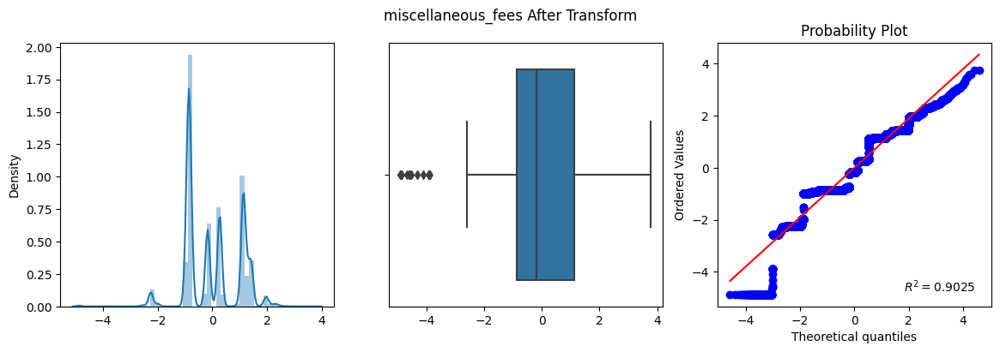

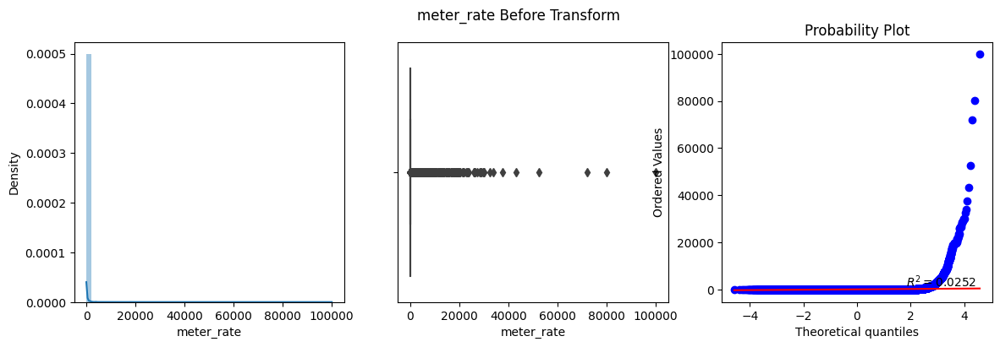

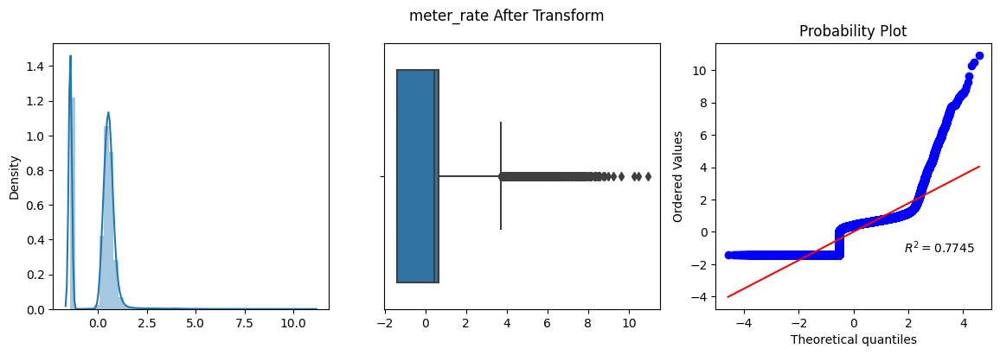

In [33]:
# Power Transform
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    apply_transform(PowerTransformer(),col)

Log Transform: no_passengers <br>
Square Root Transform: fare, tip <br>
Square Transform: None <br>
Reciprocal Transform: None <br>
Power Transform: trip_duration, distance_travelled, miscellaneous_fees, meter_rate 

### Outlier Treatment

In [52]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='quantiles',fold=0.1,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

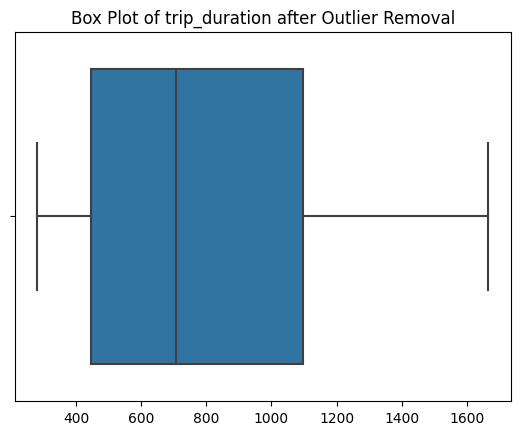

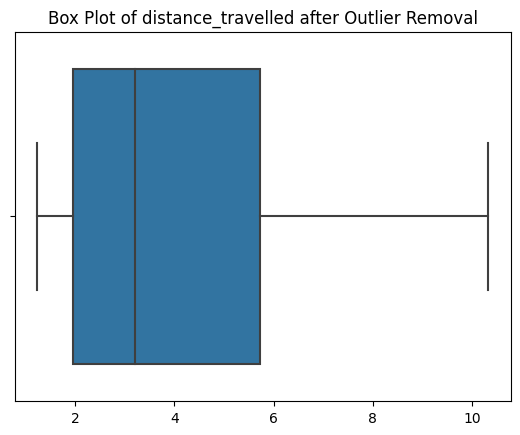

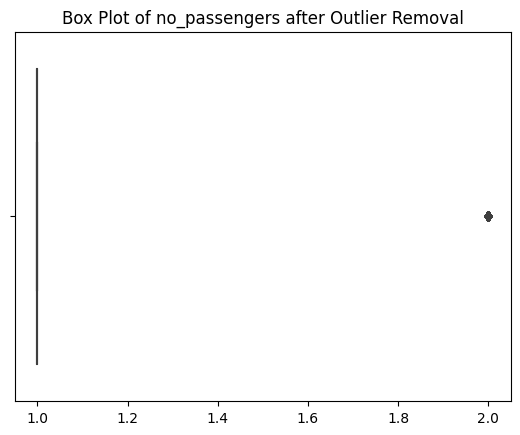

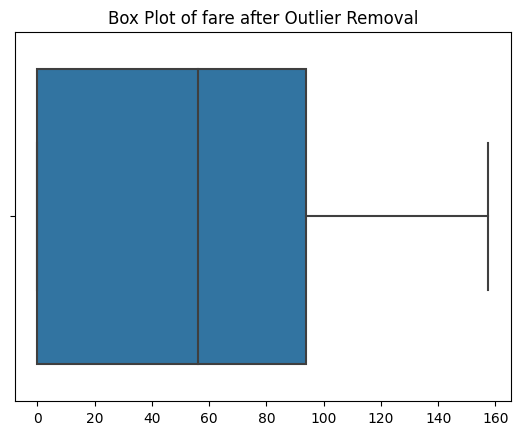

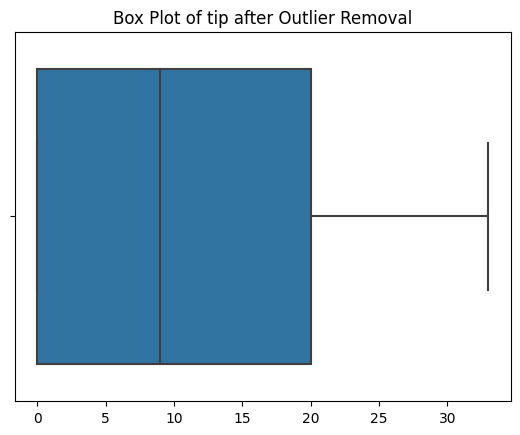

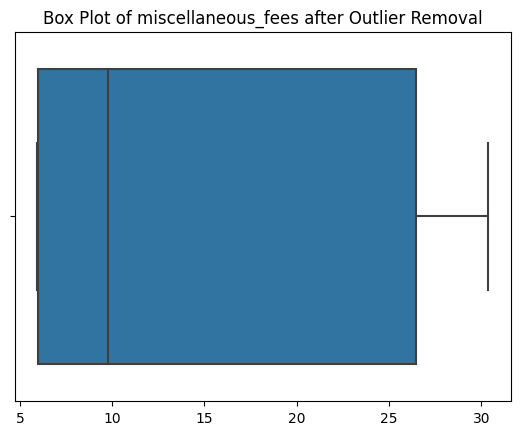

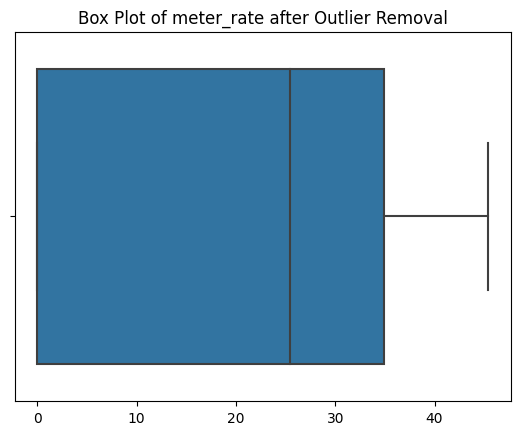

In [53]:
for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    impute_outliers(df,col)

In [54]:
winsorizer = Winsorizer(capping_method='quantiles',tail='both',fold=0.1)

for col in df.drop(['total_fare','surge_applied'],axis=1).columns:
    df[col] = winsorizer.fit_transform(df[[col]])

### Feature Splitting

In [55]:
X = df.drop('total_fare',axis=1)
y = df['total_fare']

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,shuffle=True,random_state=42)

### Feature Selection

In [70]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [71]:
kbest = SelectKBest(k=5,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(k=5, score_func=<function f_regression at 0x000001C3E3DE9CF0>)

In [72]:
kbest_selected_features = kbest.get_feature_names_out()
kbest_selected_features

array(['trip_duration', 'fare', 'tip', 'miscellaneous_fees', 'meter_rate'],
      dtype=object)

In [73]:
perc = SelectPercentile(percentile=60,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=60,
                 score_func=<function f_regression at 0x000001C3E3DE9CF0>)

In [74]:
perc_selected_features = perc.get_feature_names_out()
perc_selected_features

array(['trip_duration', 'fare', 'meter_rate'], dtype=object)

In [75]:
lasso = SelectFromModel(estimator=Lasso(),max_features=5)
lasso.fit(X_train,y_train)

SelectFromModel(estimator=Lasso(), max_features=5)

In [76]:
lasso_selected_features = lasso.get_feature_names_out()
lasso_selected_features

array(['trip_duration', 'fare', 'tip', 'miscellaneous_fees', 'meter_rate'],
      dtype=object)

In [78]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=5)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=5)

In [79]:
rf_selected_features = rf.get_feature_names_out()
rf_selected_features

array(['fare'], dtype=object)

In [80]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=5,step=2,verbose=2)
rfe.fit(X_train,y_train)

Fitting estimator with 6 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=5, step=2,
    verbose=2)

In [81]:
rfe_selected_features = rfe.get_feature_names_out()
rfe_selected_features

array(['trip_duration', 'fare', 'tip', 'miscellaneous_fees', 'meter_rate'],
      dtype=object)

In [82]:
sfs = SequentialFeatureSelector(estimator=Lasso(),n_features_to_select=5,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Lasso(),
                          n_features_to_select=5)

In [83]:
sfs_selected_features = sfs.get_feature_names_out()
sfs_selected_features

array(['trip_duration', 'fare', 'tip', 'miscellaneous_fees', 'meter_rate'],
      dtype=object)

In [84]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [85]:
def plot_feature_importances(feat_imp_type):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())
    values = list(feat_imps.values())
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

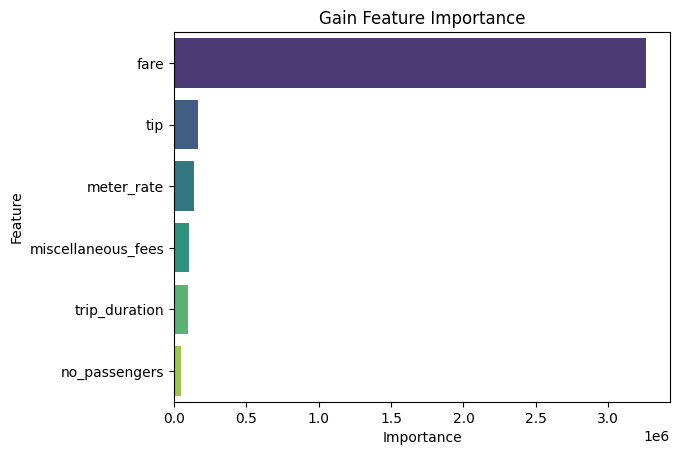

In [86]:
plot_feature_importances('gain')

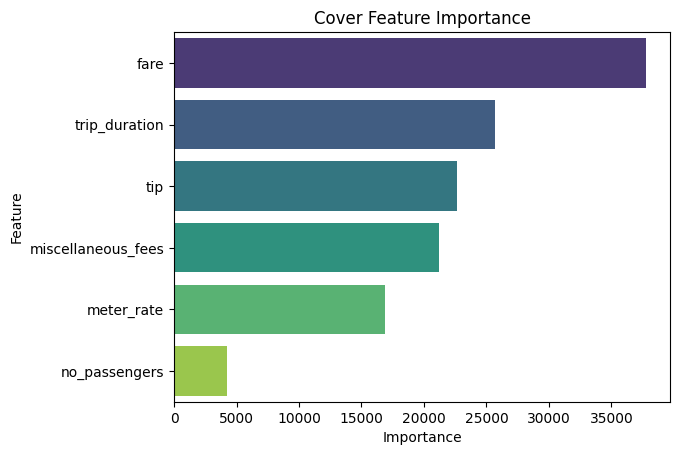

In [87]:
plot_feature_importances('cover')

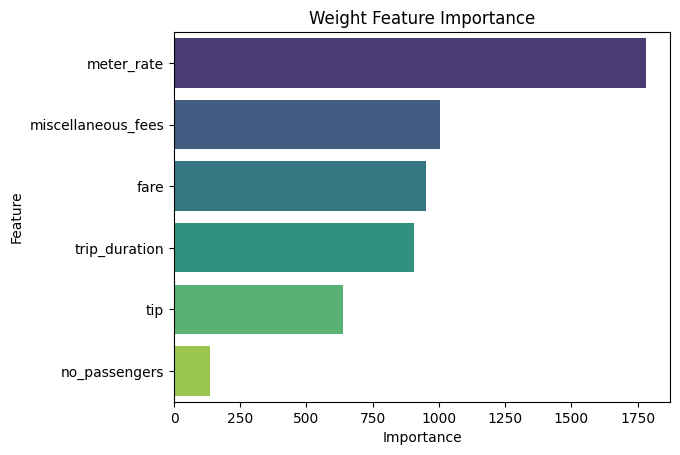

In [88]:
plot_feature_importances('weight')

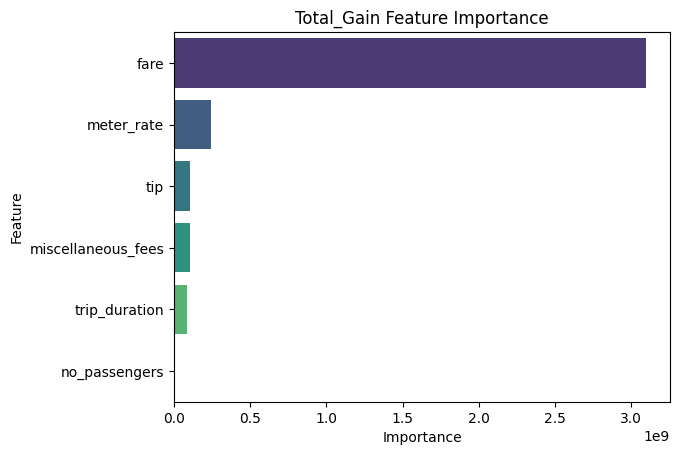

In [89]:
plot_feature_importances('total_gain')

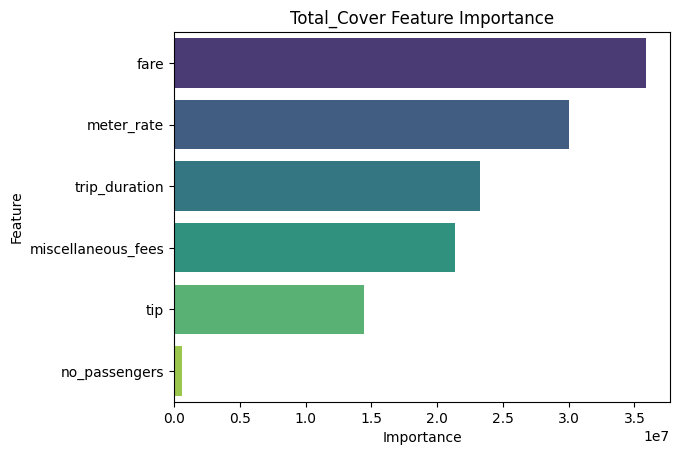

In [90]:
plot_feature_importances('total_cover')

In [189]:
final_selected_features = ['meter_rate','trip_duration','miscellaneous_fees','tip','fare']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [190]:
final_X_train.rename({'fare': 'base_fare'},axis=1,inplace=True)
final_X_test.rename({'fare': 'base_fare'},axis=1,inplace=True)

In [153]:
del kbest, perc, lasso, rf, rfe, sfs, xgb, kbest_selected_features, perc_selected_features, lasso_selected_features, rf_selected_features, rfe_selected_features, sfs_selected_features
gc.collect()

NameError: name 'kbest' is not defined

In [191]:
transformer = ColumnTransformer(transformers=[
    ('sqrt_transform',FunctionTransformer(np.sqrt),['base_fare','tip']),
    ('power_transform',PowerTransformer(),['meter_rate','trip_duration','miscellaneous_fees'])
])
transformer

ColumnTransformer(transformers=[('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['base_fare', 'tip']),
                                ('power_transform', PowerTransformer(),
                                 ['meter_rate', 'trip_duration',
                                  'miscellaneous_fees'])])

In [192]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_train.head()

,meter_rate,trip_duration,miscellaneous_fees,tip,fare
0,9.082951,5.196152,0.793227,0.096828,1.252475
1,12.549900,5.000000,0.008628,1.568810,1.382276
2,11.124298,5.196152,0.290950,0.715004,0.455813
3,7.984360,2.645751,0.328717,-0.680786,-0.053949
4,0.000000,0.000000,-1.445163,0.704578,-0.114600


In [193]:
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_test.head()

,meter_rate,trip_duration,miscellaneous_fees,tip,fare
0,7.500000,0.000000,0.315678,-0.875819,-1.053793
1,6.123724,3.000000,1.178434,-1.581770,-1.071699
2,0.000000,0.000000,-1.445163,-1.040354,-1.053793
3,0.000000,5.744563,-1.445163,1.568810,0.385541
4,4.330127,0.000000,1.178434,-1.581770,-1.053793


### Feature Scaling

In [194]:
scaler = MinMaxScaler()
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,meter_rate,trip_duration,miscellaneous_fees,tip,fare
0,0.723747,0.904534,0.853176,0.532790,0.946802
1,1.000000,0.870388,0.554121,1.000000,0.999680
2,0.886405,0.904534,0.661730,0.729000,0.622265
3,0.636209,0.460566,0.676125,0.285974,0.414602
4,0.000000,0.000000,0.000000,0.725691,0.389895


In [195]:
final_X_test.head()

,meter_rate,trip_duration,miscellaneous_fees,tip,fare
0,0.597614,0.000000,0.671155,0.224070,0.007294
1,0.487950,0.522233,1.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.171847,0.007294
3,0.000000,1.000000,0.000000,1.000000,0.593638
4,0.345033,0.000000,1.000000,0.000000,0.007294


## Model Training & Evaluation

In [222]:
def huber_loss(y_true,y_pred,delta=1.0):
    error = y_true - y_pred
    abs_error = abs(error)
    quadratic = 0.5 * (error**2)
    linear = delta * (abs_error - 0.5 * delta)
    loss = np.where(abs_error <= delta, quadratic, linear)
    return loss.mean()

In [223]:
models = []
r2_scores = []
mae_scores = []
rmse_scores = []
huber_losses = []
explained_variance_scores = []

In [224]:
def train_and_evaluate_model(model):
    model.fit(final_X_train,y_train)
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    rmse = mean_squared_error(y_test,y_pred,squared=False)
    evs = explained_variance_score(y_test,y_pred)
    huber = huber_loss(y_test,y_pred)
    print("R2 Score:",r2)
    print("Mean Absolute Error:",mae)
    print("Root Mean Squared Error:",rmse)
    print("Explained Variance Score:",evs)
    print("Huber Loss:",huber)
    models.append(model)
    r2_scores.append(r2)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    huber_losses.append(huber)
    explained_variance_scores.append(evs)
    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse
    except Exception as e:
        pass
    gc.collect()

R2 Score: 0.682728194999167
Mean Absolute Error: 24.990854718610997
Root Mean Squared Error: 56.847854232720834
Explained Variance Score: 0.6827330153159602
Huber Loss: 24.496252903824384


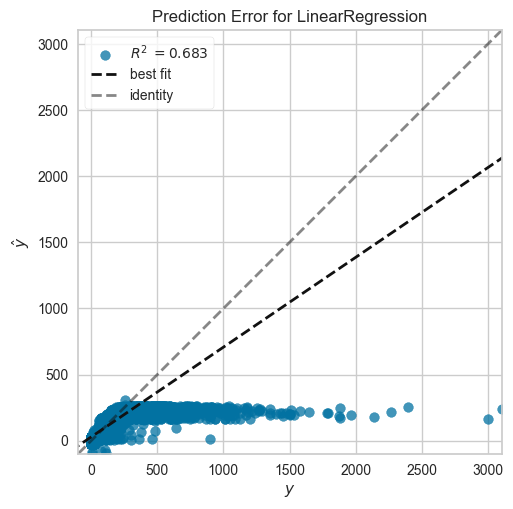

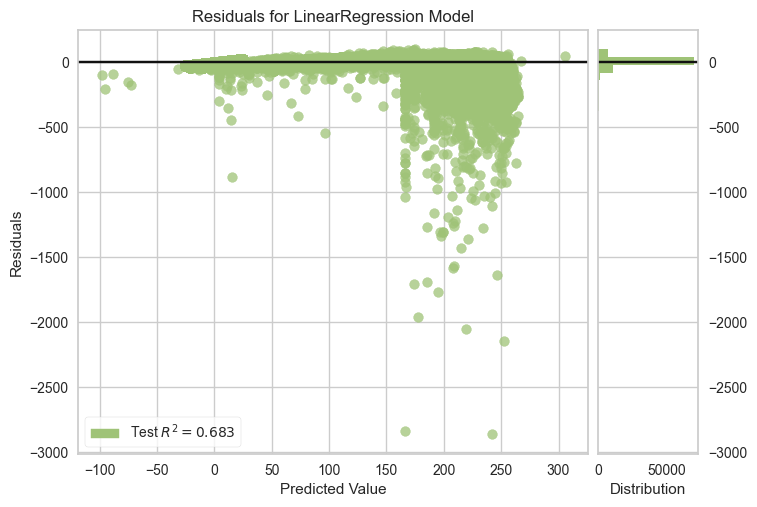

In [225]:
train_and_evaluate_model(LinearRegression())

R2 Score: 0.6827258657315922
Mean Absolute Error: 25.066609104581232
Root Mean Squared Error: 56.84806290808759
Explained Variance Score: 0.6827290131523747
Huber Loss: 24.572602734066365


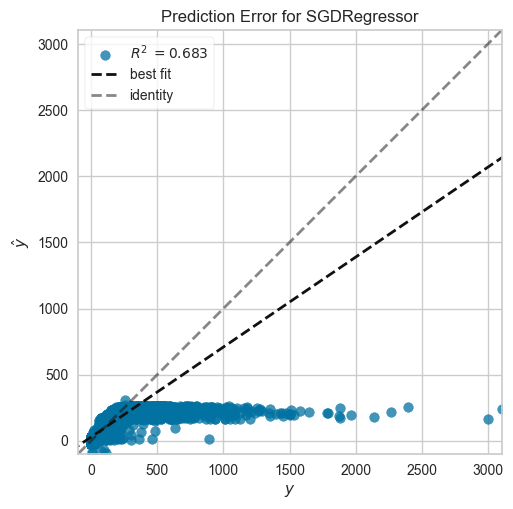

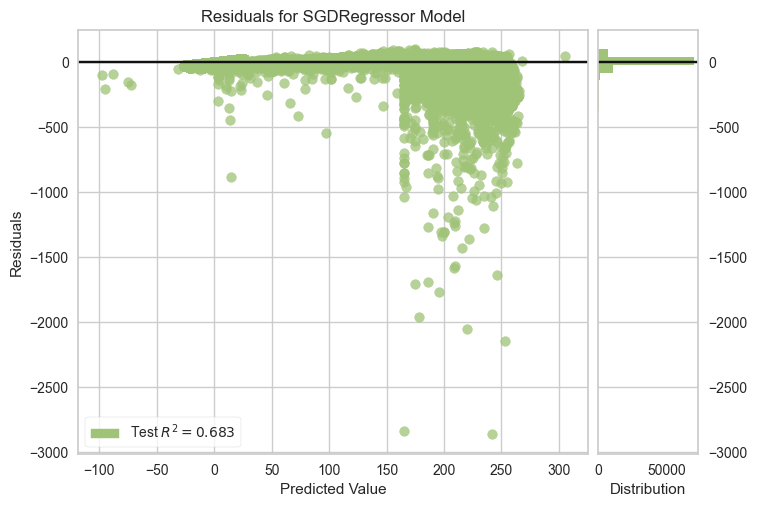

In [226]:
train_and_evaluate_model(SGDRegressor())

R2 Score: 0.6729125520669422
Mean Absolute Error: 24.190864207603827
Root Mean Squared Error: 57.7205254541076
Explained Variance Score: 0.6729192120061107
Huber Loss: 23.695552702492975


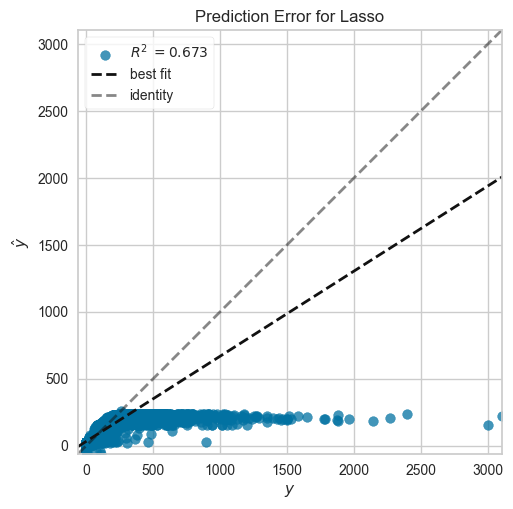

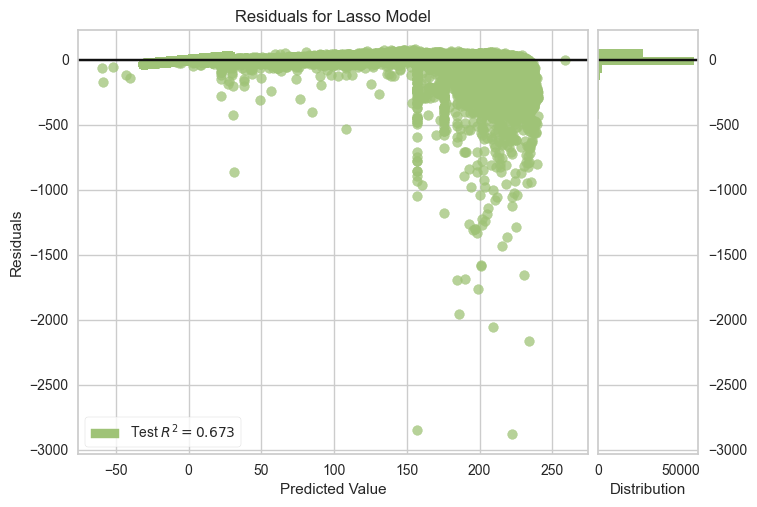

In [227]:
train_and_evaluate_model(Lasso())

R2 Score: 0.6827273389772428
Mean Absolute Error: 24.989201099307405
Root Mean Squared Error: 56.84793092244867
Explained Variance Score: 0.6827321615102933
Huber Loss: 24.494598236826


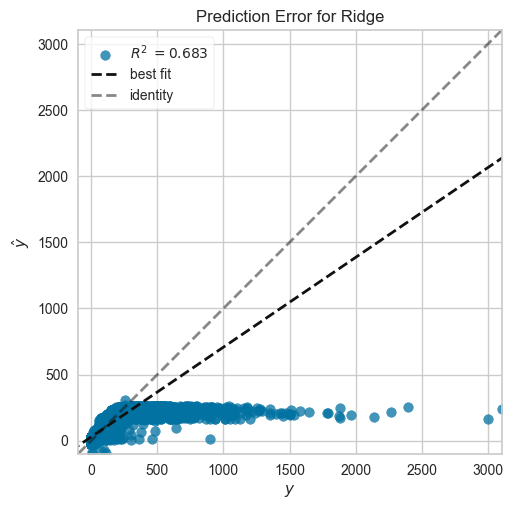

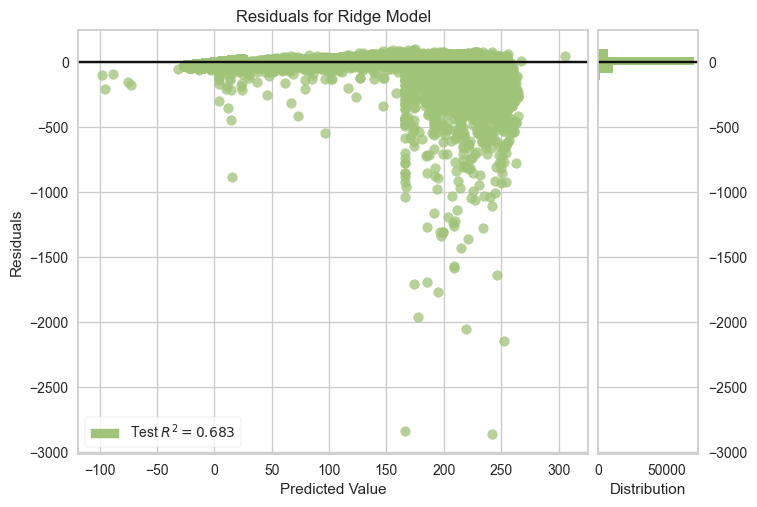

In [228]:
train_and_evaluate_model(Ridge())

R2 Score: 0.30968816408188937
Mean Absolute Error: 49.928401747043495
Root Mean Squared Error: 83.85346180981645
Explained Variance Score: 0.3097013392341459
Huber Loss: 49.430611347583216


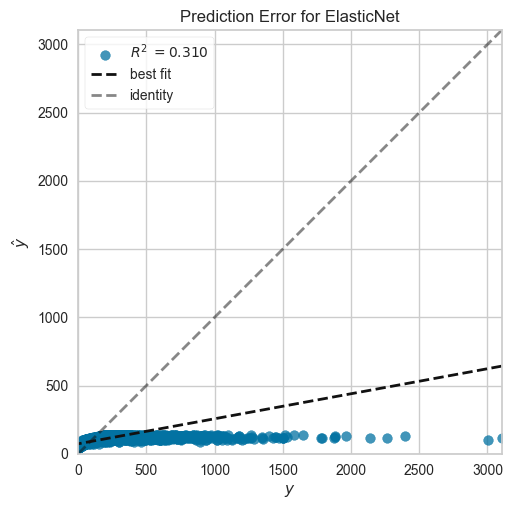

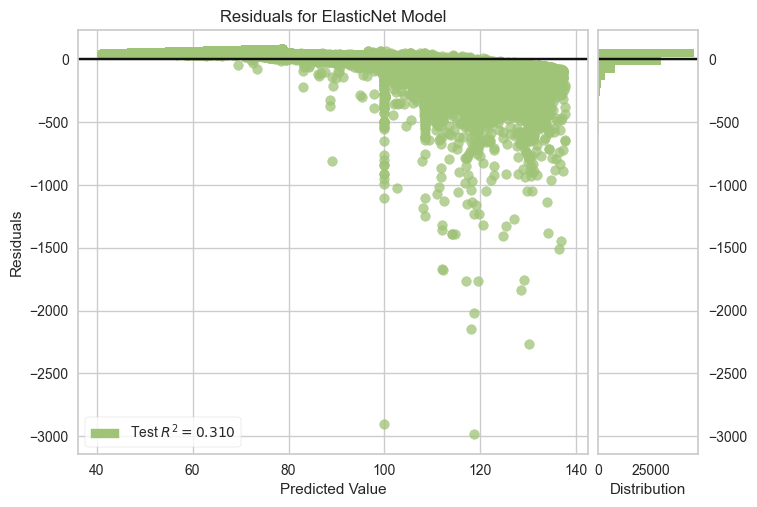

In [229]:
train_and_evaluate_model(ElasticNet())

R2 Score: 0.6461977573602625
Mean Absolute Error: 20.810980658825436
Root Mean Squared Error: 60.03142154565931
Explained Variance Score: 0.6501827587271459
Huber Loss: 20.31747775278194


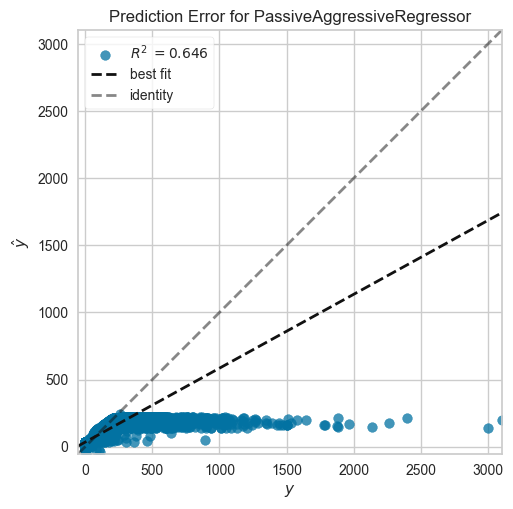

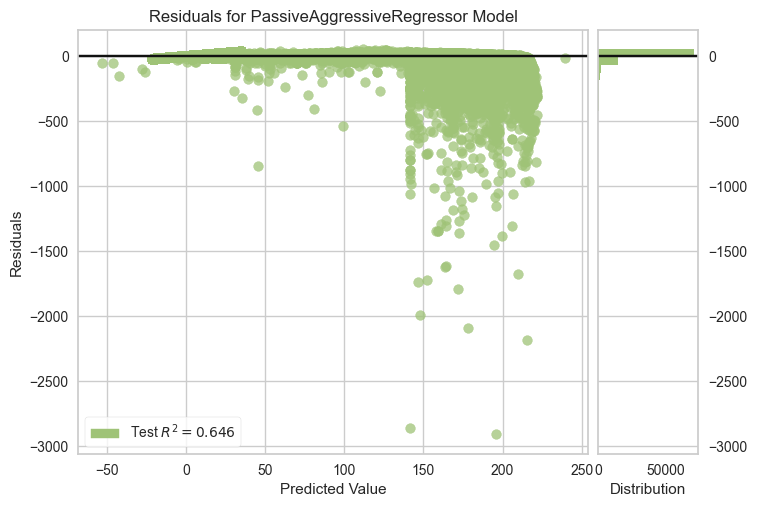

In [230]:
train_and_evaluate_model(PassiveAggressiveRegressor())

R2 Score: 0.6827282449647814
Mean Absolute Error: 24.989862715447266
Root Mean Squared Error: 56.84784975637276
Explained Variance Score: 0.6827330639424342
Huber Loss: 24.49526352656123


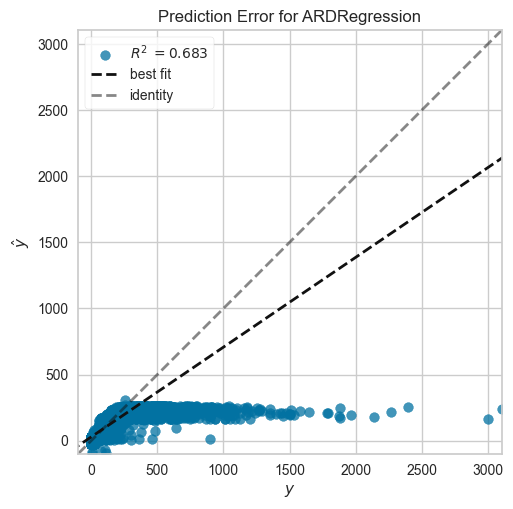

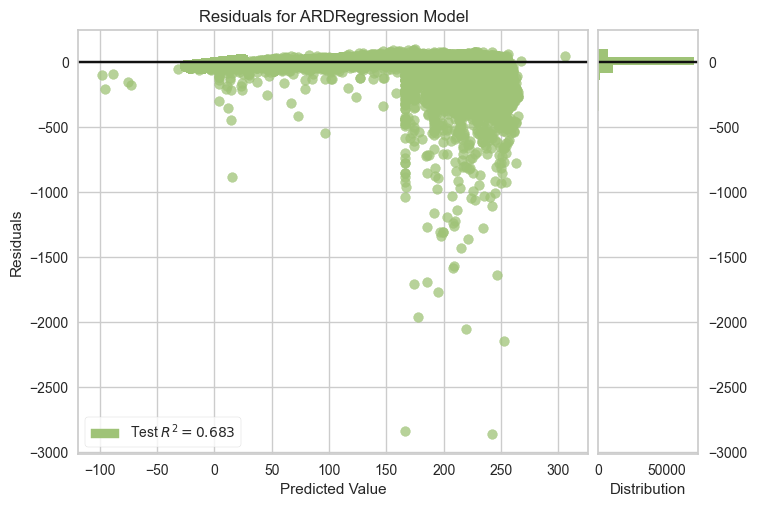

In [231]:
train_and_evaluate_model(ARDRegression())

R2 Score: 0.6450971175612071
Mean Absolute Error: 20.16234498020825
Root Mean Squared Error: 60.124724607553645
Explained Variance Score: 0.6539823101820696
Huber Loss: 19.67347333645592


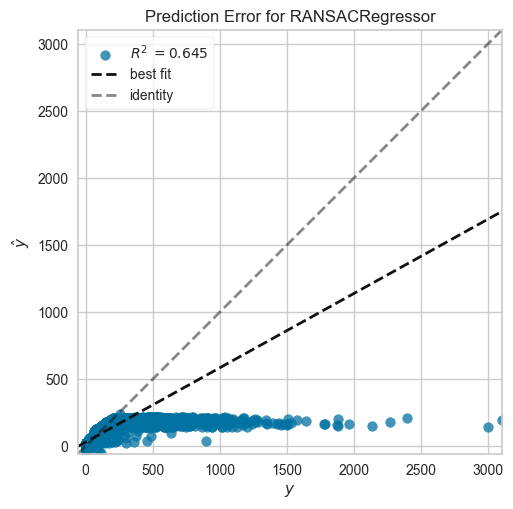

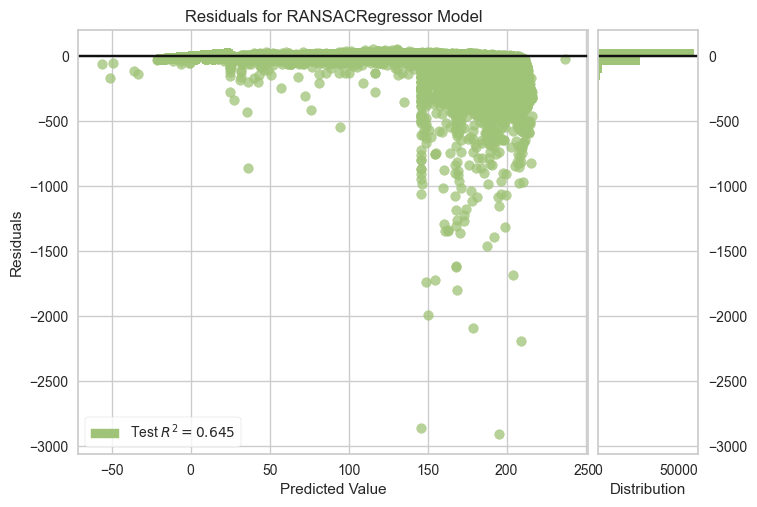

In [232]:
train_and_evaluate_model(RANSACRegressor())

R2 Score: 0.7240889972637992
Mean Absolute Error: 17.824477421248822
Root Mean Squared Error: 53.01305676607236
Explained Variance Score: 0.7241003904887909
Huber Loss: 17.33301925360191


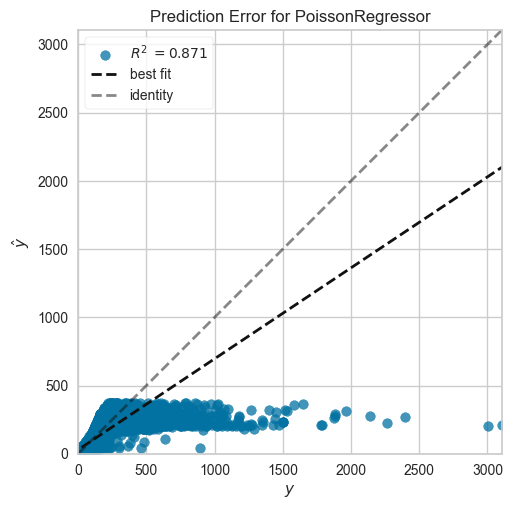

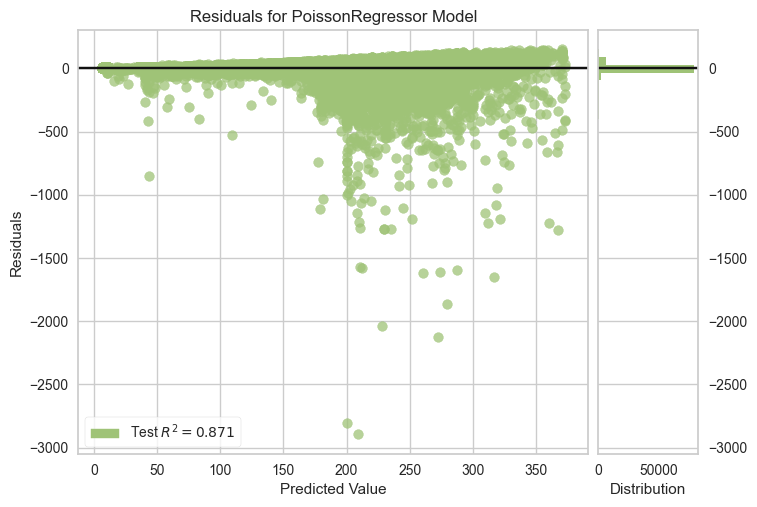

In [233]:
train_and_evaluate_model(PoissonRegressor())

R2 Score: 0.6431272523878617
Mean Absolute Error: 20.133716273722797
Root Mean Squared Error: 60.29135288305743
Explained Variance Score: 0.65263466421806
Huber Loss: 19.64349614885901


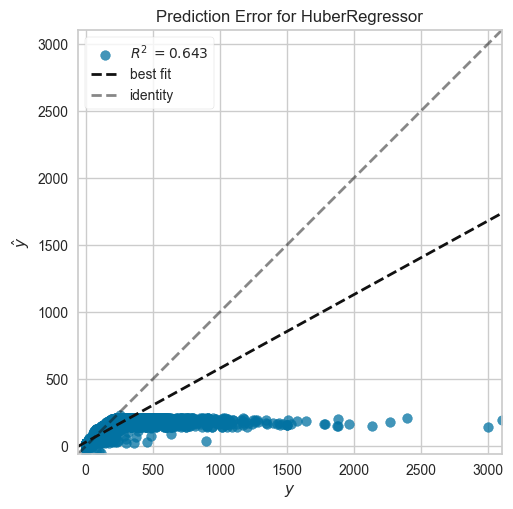

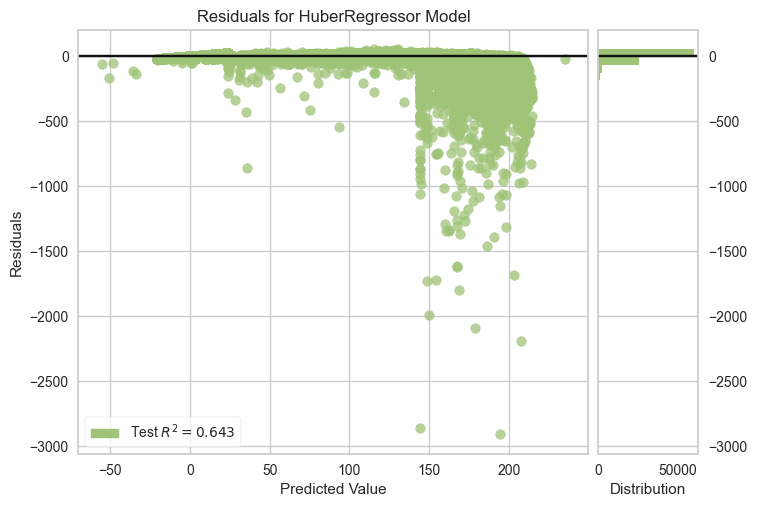

In [234]:
train_and_evaluate_model(HuberRegressor())

R2 Score: 0.6827280368370238
Mean Absolute Error: 24.990545834111003
Root Mean Squared Error: 56.84786840223922
Explained Variance Score: 0.6827328575676567
Huber Loss: 24.495943592863714


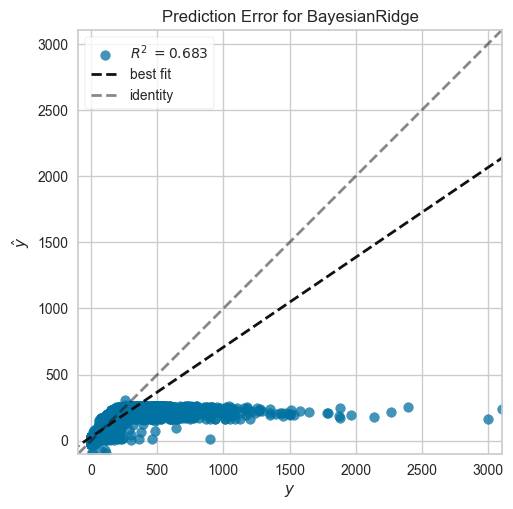

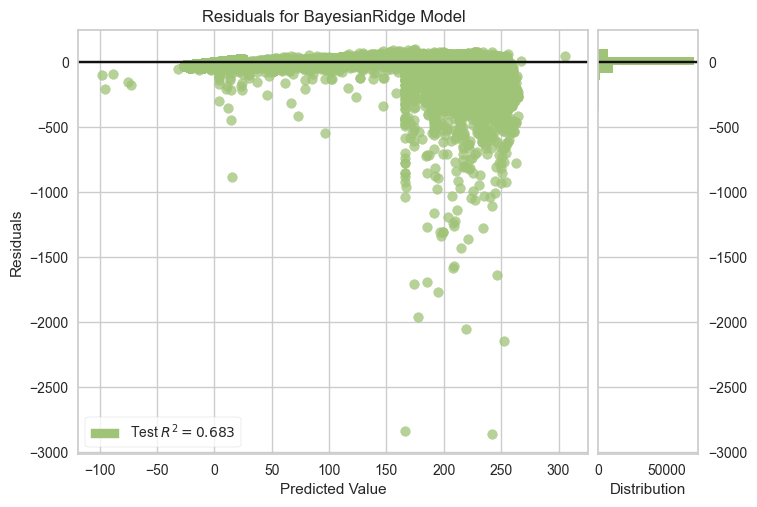

In [235]:
train_and_evaluate_model(BayesianRidge())

R2 Score: 0.20294957380867606
Mean Absolute Error: 56.719508973148805
Root Mean Squared Error: 90.10341180362929
Explained Variance Score: 0.20296312196878208
Huber Loss: 56.22155995381665


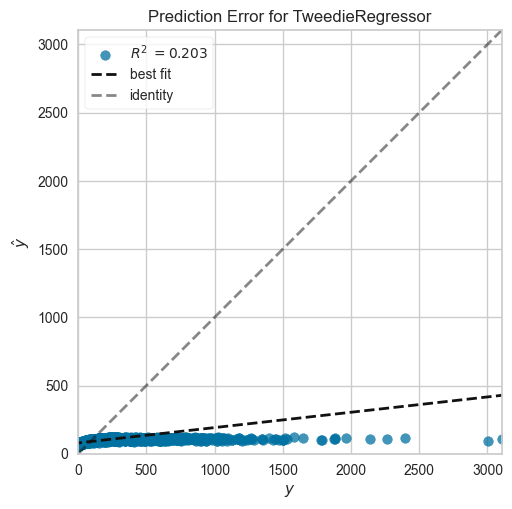

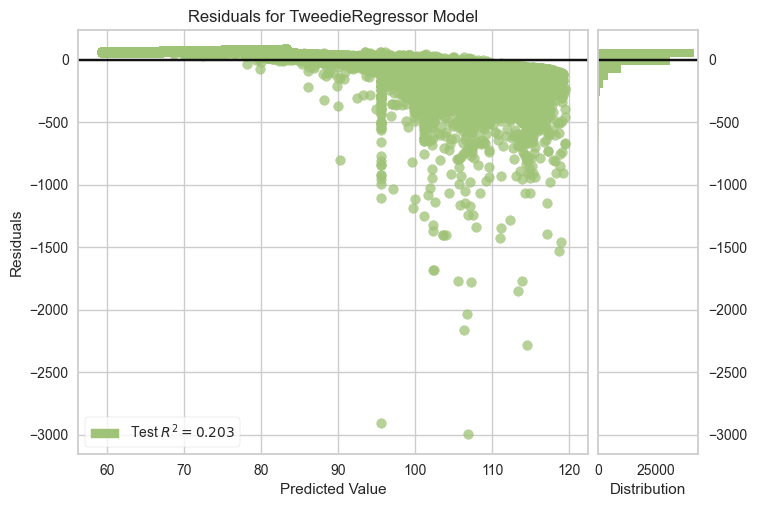

In [236]:
train_and_evaluate_model(TweedieRegressor())

R2 Score: 0.6958300409574809
Mean Absolute Error: 8.620742471850676
Root Mean Squared Error: 55.661703876028895
Explained Variance Score: 0.6958303287878709
Huber Loss: 8.559161114865809


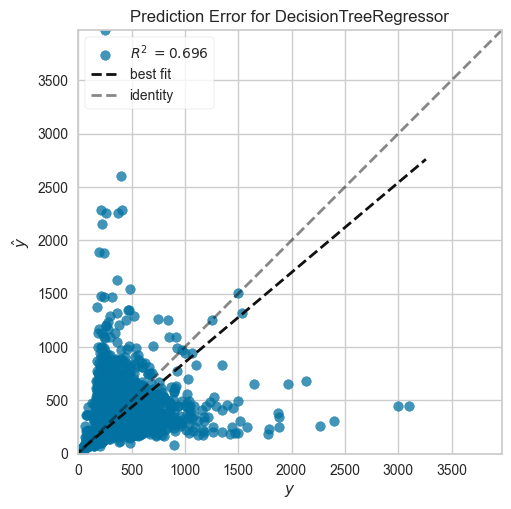

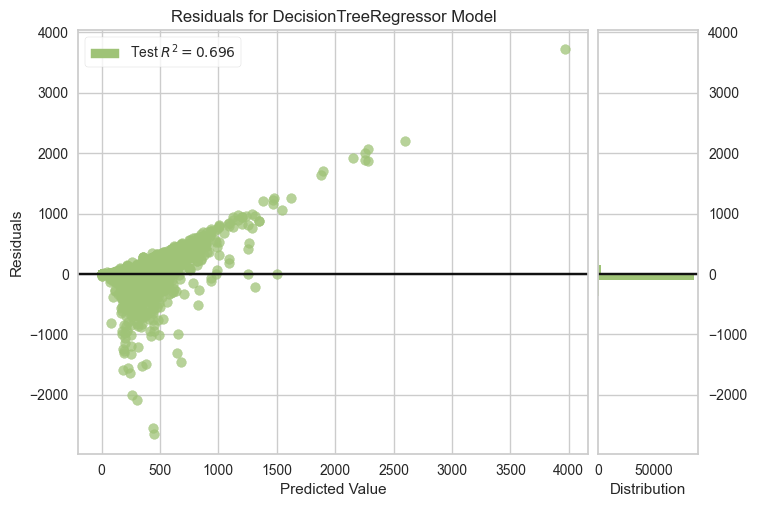

In [237]:
train_and_evaluate_model(DecisionTreeRegressor())

R2 Score: 0.8211598181871873
Mean Absolute Error: 6.993620360708995
Root Mean Squared Error: 42.680636573427776
Explained Variance Score: 0.8211604926289545
Huber Loss: 6.91331798066555


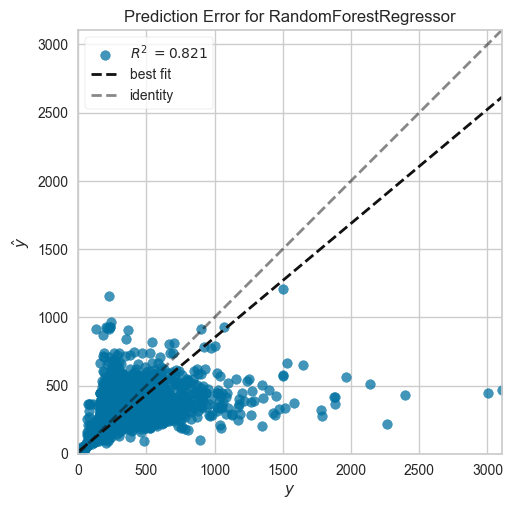

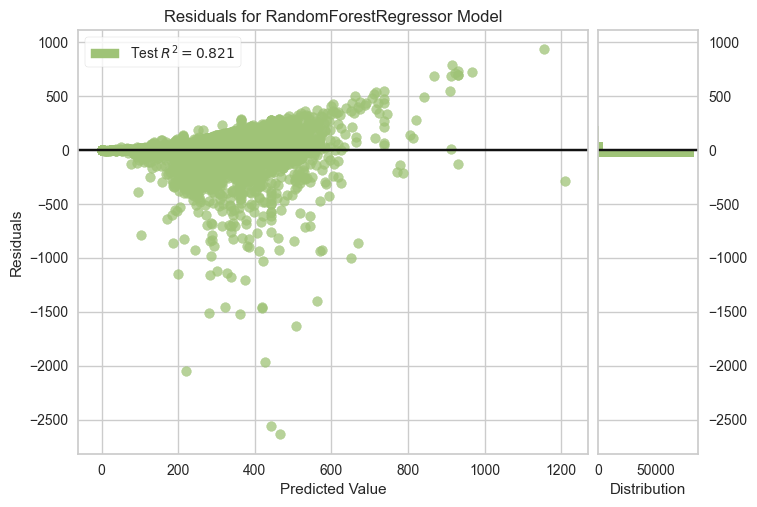

In [238]:
train_and_evaluate_model(RandomForestRegressor())

R2 Score: 0.806412436361846
Mean Absolute Error: 8.016829883138564
Root Mean Squared Error: 44.405530613305906
Explained Variance Score: 0.8064125452058972
Huber Loss: 7.851777412493045


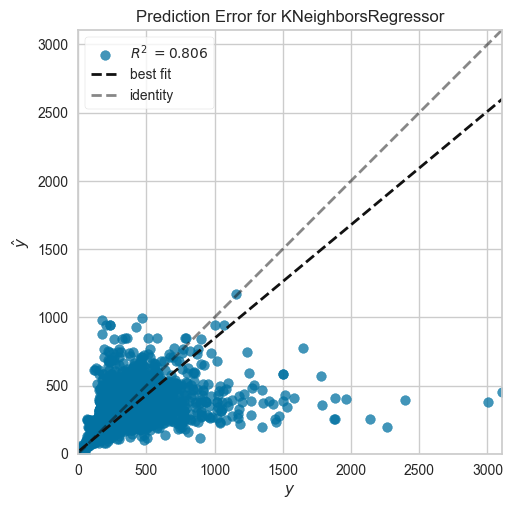

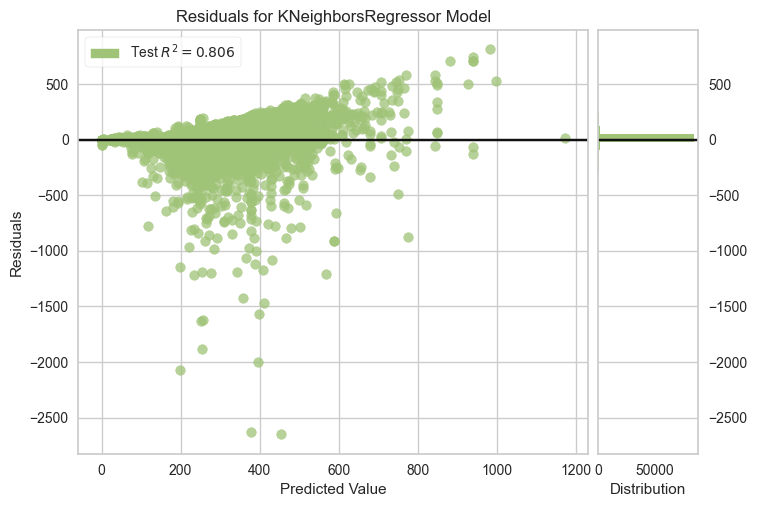

In [239]:
train_and_evaluate_model(KNeighborsRegressor())

R2 Score: 0.7695573806792846
Mean Absolute Error: 7.674364338360273
Root Mean Squared Error: 48.44843338116595
Explained Variance Score: 0.7695574470798902
Huber Loss: 7.598903904677432


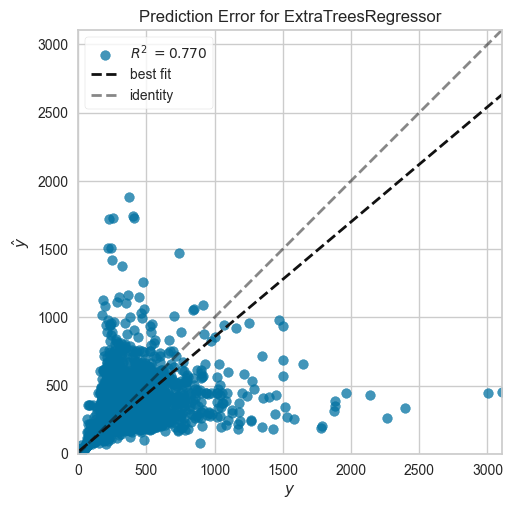

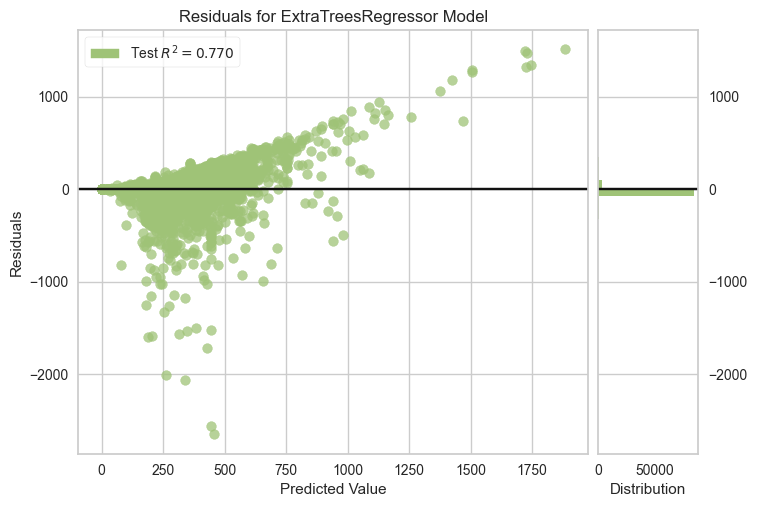

In [240]:
train_and_evaluate_model(ExtraTreesRegressor())

R2 Score: 0.6344878722605285
Mean Absolute Error: 20.062890859168753
Root Mean Squared Error: 61.01677261570178
Explained Variance Score: 0.6463320847953133
Huber Loss: 19.57434966148569


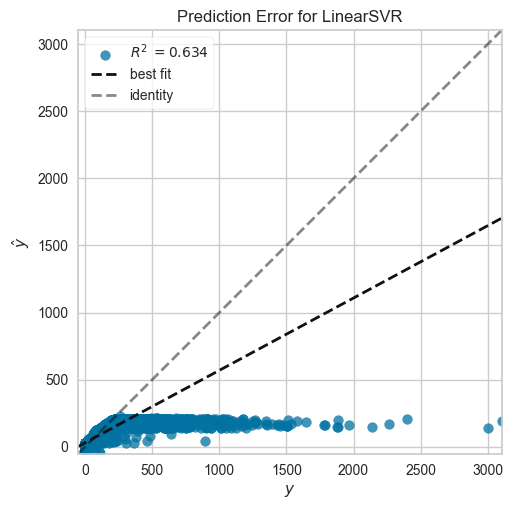

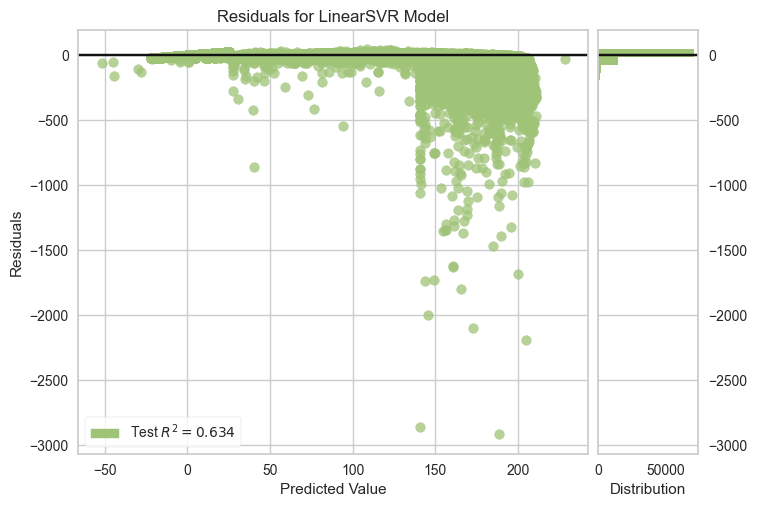

In [241]:
train_and_evaluate_model(LinearSVR())

R2 Score: 0.31733114881200564
Mean Absolute Error: 22.03780076042618
Root Mean Squared Error: 83.38796597530016
Explained Variance Score: 0.3226333416874987
Huber Loss: 21.689141204788353


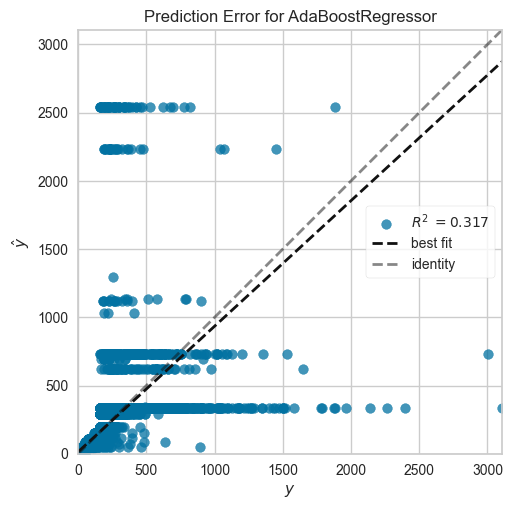

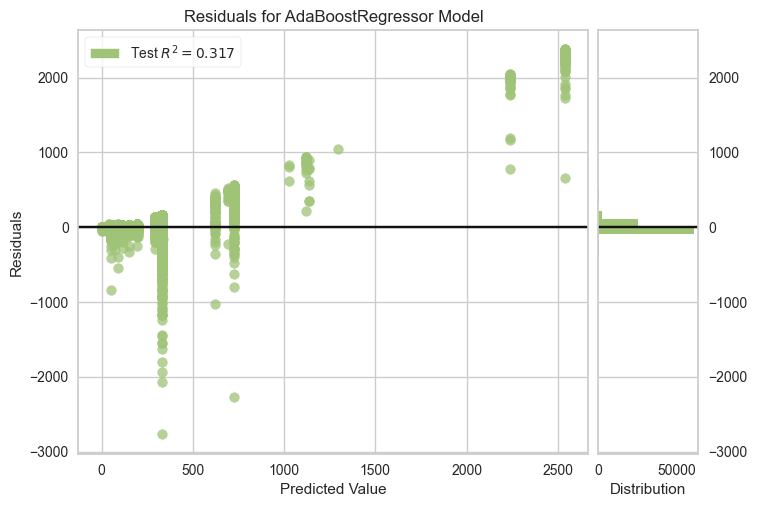

In [242]:
train_and_evaluate_model(AdaBoostRegressor())

R2 Score: 0.8227183175373377
Mean Absolute Error: 9.23320492005473
Root Mean Squared Error: 42.49425984452555
Explained Variance Score: 0.8227205568935723
Huber Loss: 8.789922895938659


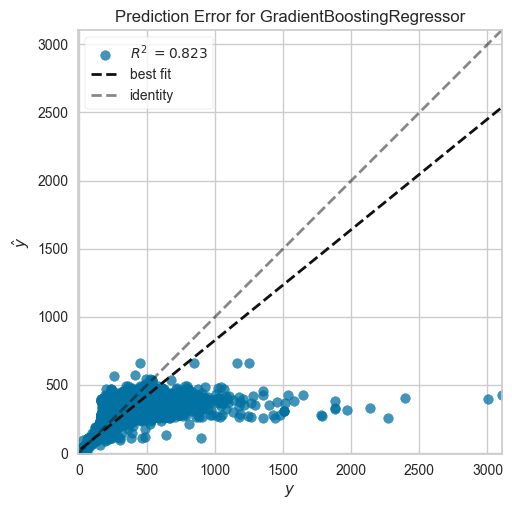

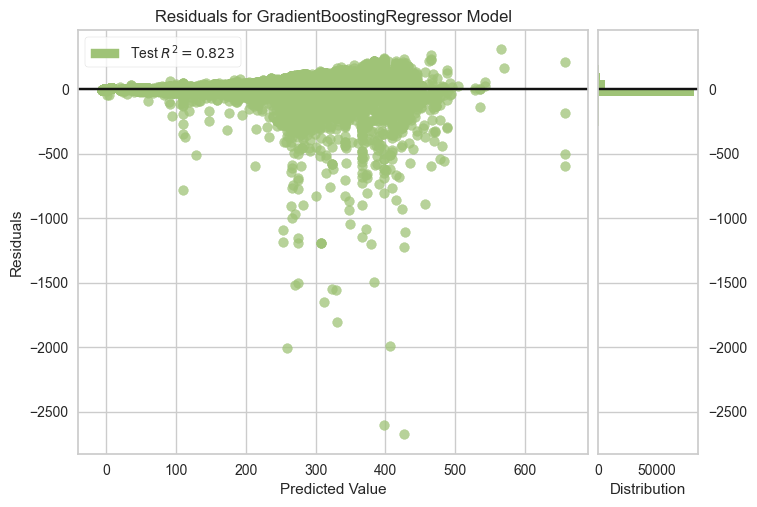

In [243]:
train_and_evaluate_model(GradientBoostingRegressor())

R2 Score: 0.8339222385298416
Mean Absolute Error: 7.92529676591123
Root Mean Squared Error: 41.129561381579684
Explained Variance Score: 0.8339239206158872
Huber Loss: 7.5635804661542005


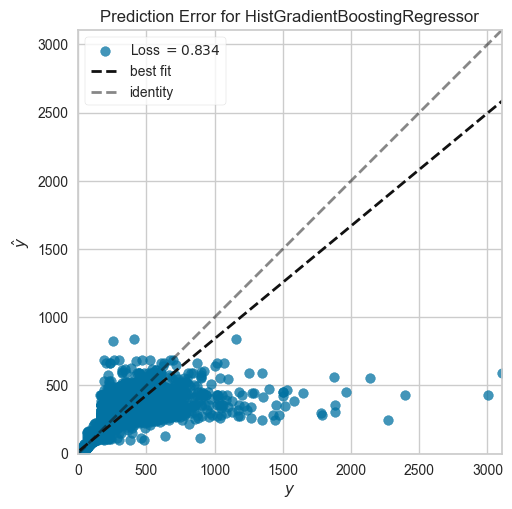

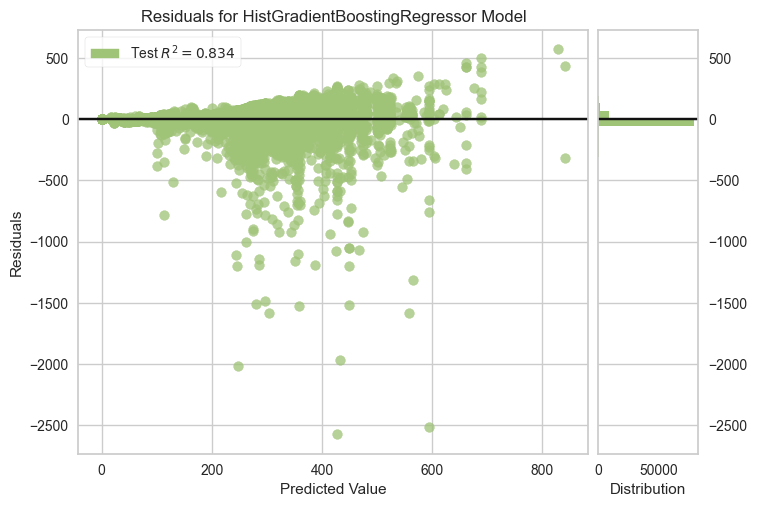

In [244]:
train_and_evaluate_model(HistGradientBoostingRegressor())

R2 Score: 0.775404325740946
Mean Absolute Error: 7.53400235776577
Root Mean Squared Error: 47.82985128943723
Explained Variance Score: 0.7754044465558011
Huber Loss: 7.457445552271072


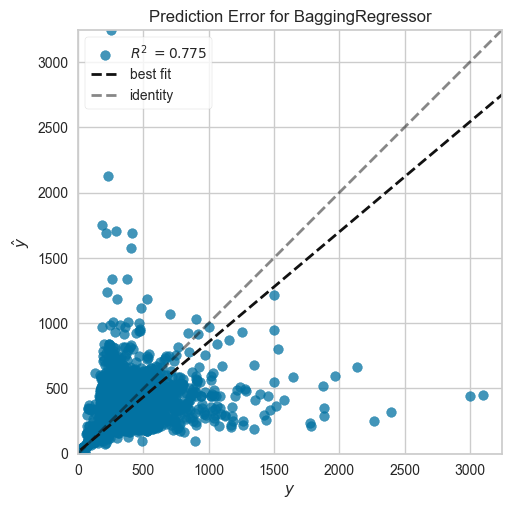

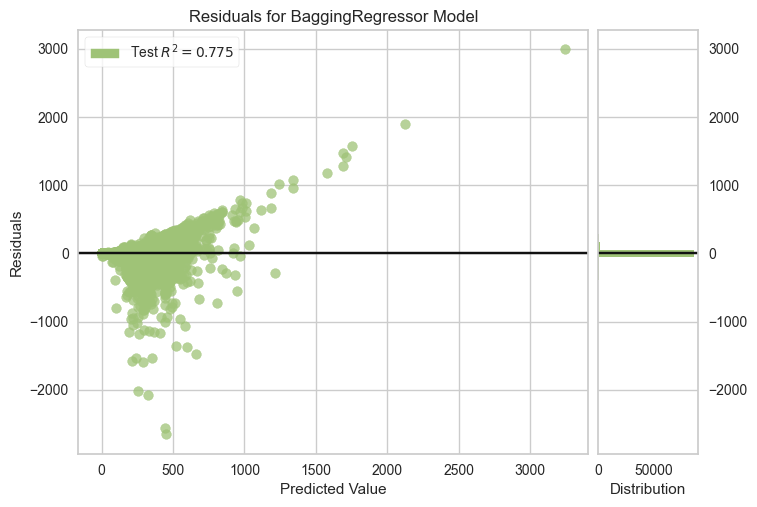

In [245]:
train_and_evaluate_model(BaggingRegressor())

R2 Score: 0.7465514882708202
Mean Absolute Error: 15.491440729277116
Root Mean Squared Error: 50.80929975042421
Explained Variance Score: 0.7466537033328562
Huber Loss: 15.001874142763377


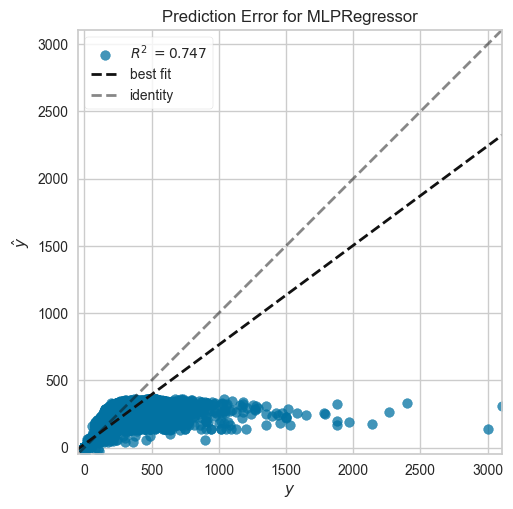

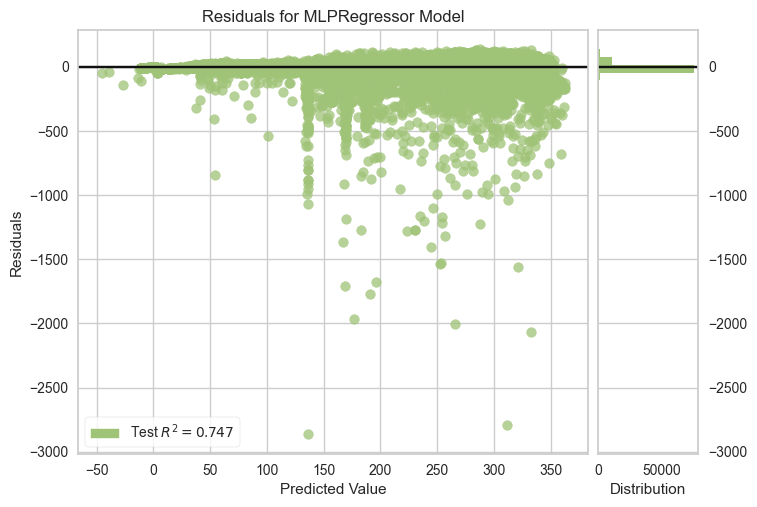

In [246]:
train_and_evaluate_model(MLPRegressor())

R2 Score: 0.8308220215727503
Mean Absolute Error: 7.524609625430554
Root Mean Squared Error: 41.51167450871103
Explained Variance Score: 0.8308228062630034
Huber Loss: 7.208639766160328


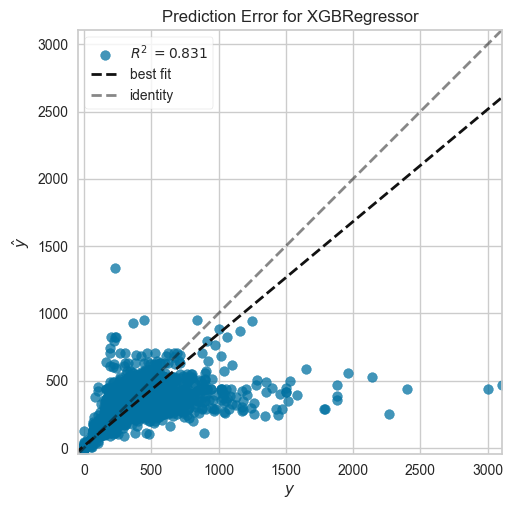

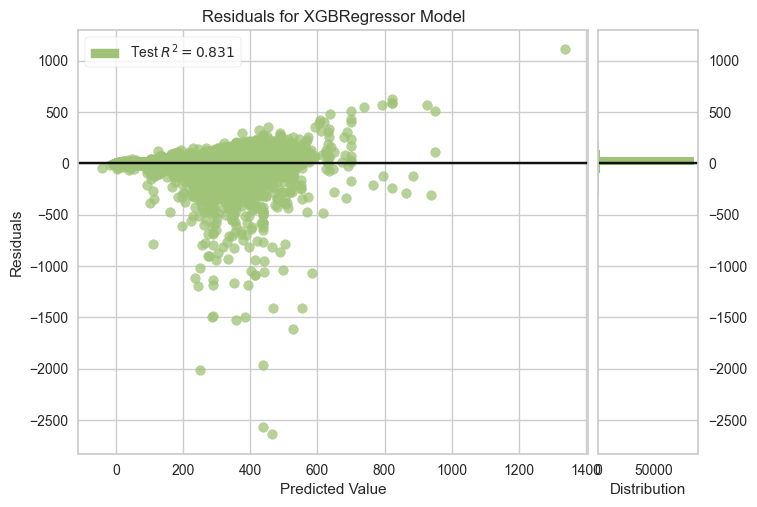

In [247]:
train_and_evaluate_model(XGBRegressor())

R2 Score: 0.8153999403595603
Mean Absolute Error: 10.579974409277456
Root Mean Squared Error: 43.362494260332575
Explained Variance Score: 0.8154019217329946
Huber Loss: 10.243448896715789


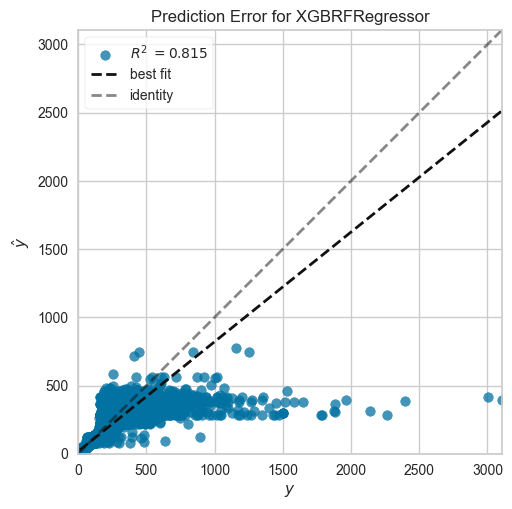

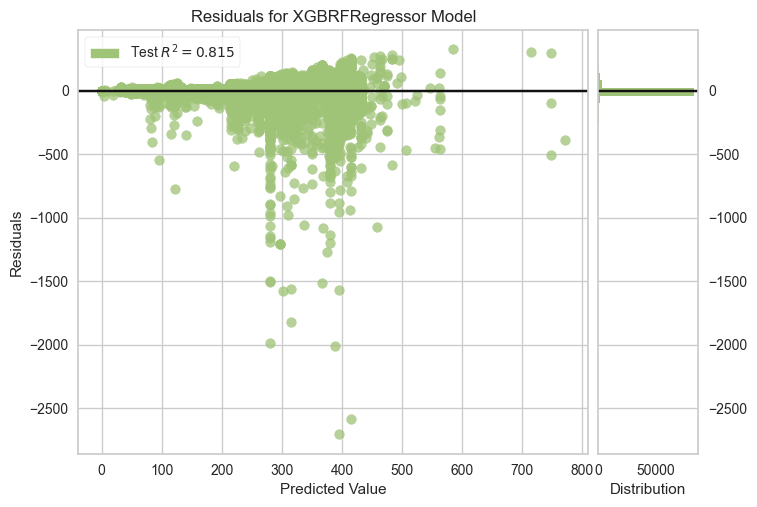

In [248]:
train_and_evaluate_model(XGBRFRegressor())

In [249]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

R2 Score: 0.8313311179539851
Mean Absolute Error: 7.415969829524334
Root Mean Squared Error: 41.4491682466318
Explained Variance Score: 0.8313318152052247
Huber Loss: 7.099743814443849


R2 Score: 0.8349296011601152
Mean Absolute Error: 7.750104010520669
Root Mean Squared Error: 41.00463375072303
Explained Variance Score: 0.8349314027224838
Huber Loss: 7.416057167791713


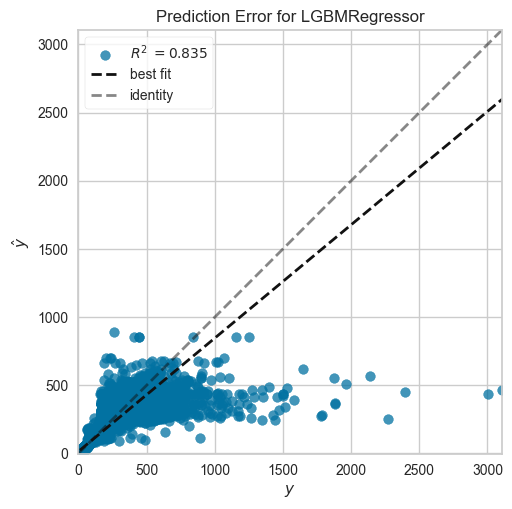

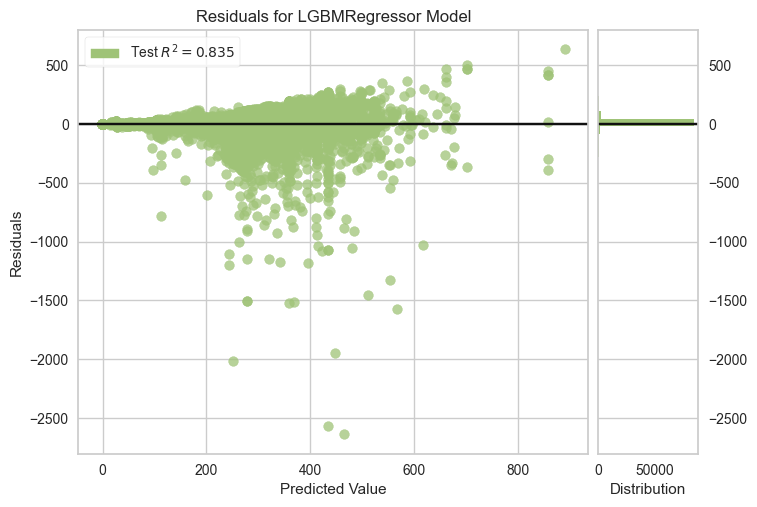

In [250]:
train_and_evaluate_model(LGBMRegressor())

[Voting] ...................... (1 of 3) Processing HGB, total=   1.1s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.5s
[Voting] ...................... (3 of 3) Processing CAT, total=  23.0s
R2 Score: 0.8355166144453691
Mean Absolute Error: 7.492631416928677
Root Mean Squared Error: 40.93165972759688
Explained Variance Score: 0.8355178751427393
Huber Loss: 7.175679302648075


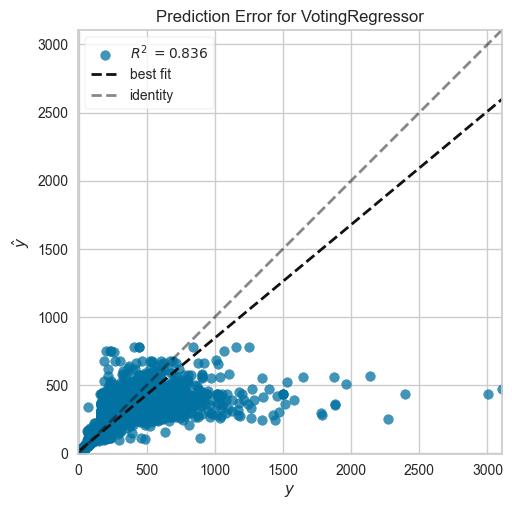

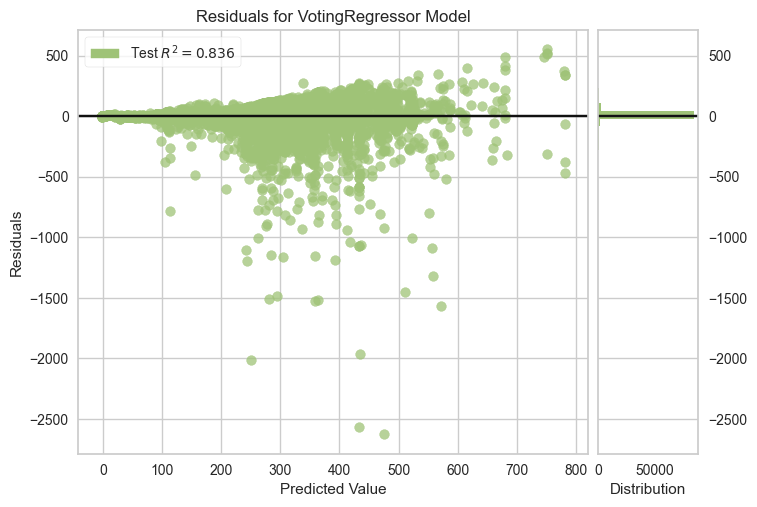

In [251]:
train_and_evaluate_model(VotingRegressor(estimators=[
    ('HGB',HistGradientBoostingRegressor()),
    ('LGBM',LGBMRegressor()),
    ('CAT',CatBoostRegressor(silent=True))
],verbose=2))

R2 Score: 0.8333488559521562
Mean Absolute Error: 7.7066562166397885
Root Mean Squared Error: 41.200500000197195
Explained Variance Score: 0.8333510694141686
Huber Loss: 7.413153574531619


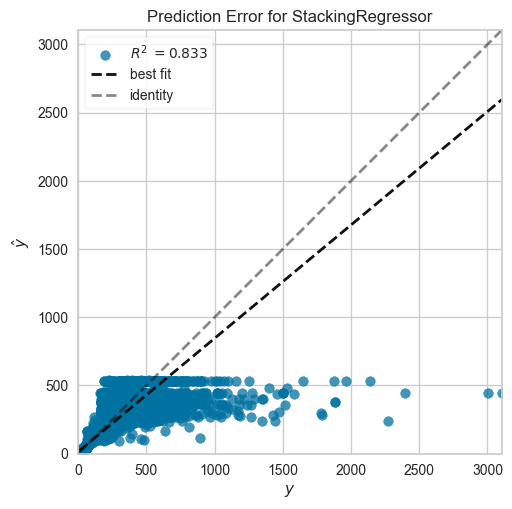

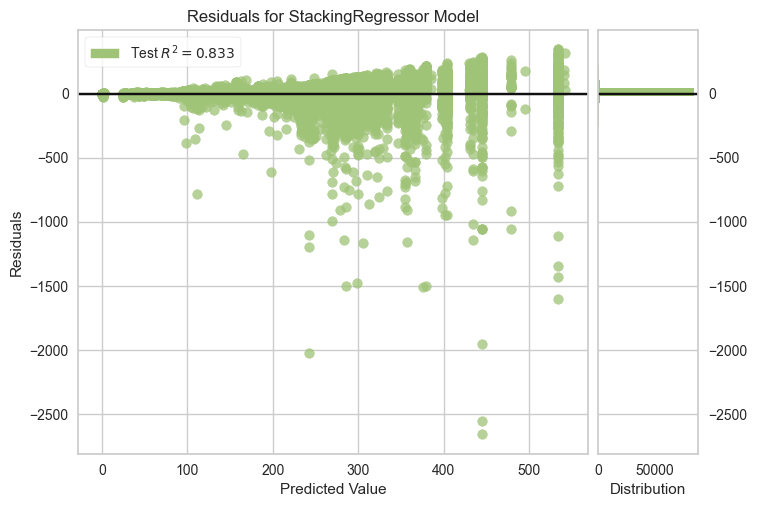

In [252]:
train_and_evaluate_model(StackingRegressor(estimators=[
    ('HGB',HistGradientBoostingRegressor()),
    ('LGBM',LGBMRegressor())
],final_estimator=CatBoostRegressor(silent=True),n_jobs=5,verbose=3))

## Baseline Models Performance Comparison

In [256]:
model_perfs = pd.DataFrame({'model': models, 
                            'R2': r2_scores, 
                            'MAE': mae_scores, 
                            'RMSE': rmse_scores,
                            'Huber Loss': huber_losses,
                            'Explained Variance Score': explained_variance_scores}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,model,R2,MAE,RMSE,Huber Loss,Explained Variance Score
0,"VotingRegressor(estimators=[('HGB', HistGradie...",0.835517,7.492631,40.931660,7.175679,0.835518
1,LGBMRegressor(),0.834930,7.750104,41.004634,7.416057,0.834931
2,HistGradientBoostingRegressor(),0.833922,7.925297,41.129561,7.563580,0.833924
3,"StackingRegressor(estimators=[('HGB', HistGrad...",0.833349,7.706656,41.200500,7.413154,0.833351
4,<catboost.core.CatBoostRegressor object at 0x0...,0.831331,7.415970,41.449168,7.099744,0.831332
5,"XGBRegressor(base_score=None, booster=None, ca...",0.830822,7.524610,41.511675,7.208640,0.830823
6,([DecisionTreeRegressor(criterion='friedman_ms...,0.822718,9.233205,42.494260,8.789923,0.822721
7,"(DecisionTreeRegressor(max_features='auto', ra...",0.821160,6.993620,42.680637,6.913318,0.821160
8,"XGBRFRegressor(base_score=None, booster=None, ...",0.815400,10.579974,43.362494,10.243449,0.815402
9,KNeighborsRegressor(),0.806412,8.016830,44.405531,7.851777,0.806413


Among the baseline models, the Voting Regressor has outperformed all other models by achieving an amazing r2 score of more than 83.5%. 

## Hyperparameter Optimization & Cross Validation

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=ball_tree, metric=euclidean, n_neighbors=8, p=1, weights=uniform; total time=   0.4s
[CV] END algorithm=ball_tree, metric=euclidean, n_neighbors=8, p=1, weights=uniform; total time=   0.4s
[CV] END algorithm=ball_tree, metric=euclidean, n_neighbors=8, p=1, weights=uniform; total time=   0.4s
[CV] END algorithm=ball_tree, metric=euclidean, n_neighbors=8, p=1, weights=uniform; total time=   0.3s
[CV] END algorithm=ball_tree, metric=euclidean, n_neighbors=8, p=1, weights=uniform; total time=   0.4s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=2, p=1, weights=distance; total time=   4.9s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=2, p=1, weights=distance; total time=   4.8s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=2, p=1, weights=distance; total time=   4.2s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=2, p=1, weights=distance; total time=   4.3s
[CV] END algori

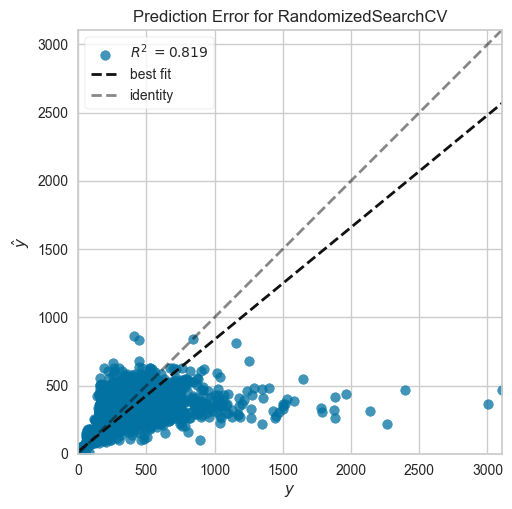

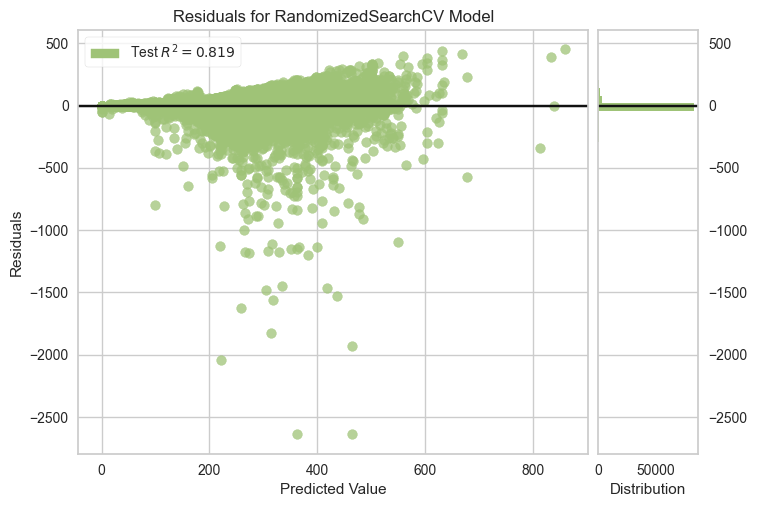

In [257]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=no_interaction, learning_rate=0.8, loss=squared_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.8, loss=squared_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.8, loss=squared_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.8, loss=squared_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.8, loss=squared_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=0.8, loss=squared_error, max_bins=250; total time=   0.6s
[CV] END interaction_cst=pairwise, learning_rate=0.8, loss=squared_error, max_bins=250; total time=   1.0s
[CV] END interaction_cst=pairwise, learning_rate=0.8, loss=squared_error, max_bins=250; total time=   0.6s
[CV] END interaction_cst=pairwise, learning_rate=0.8,

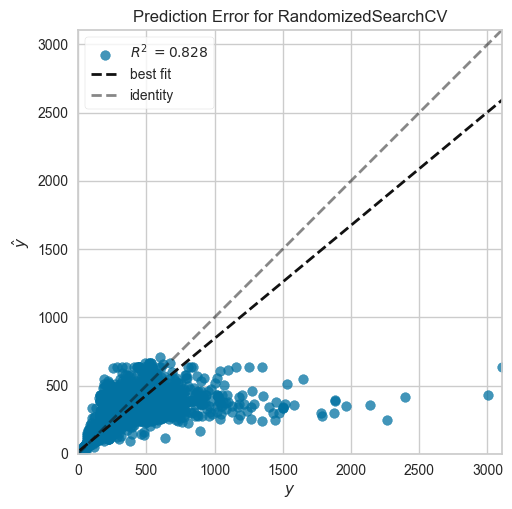

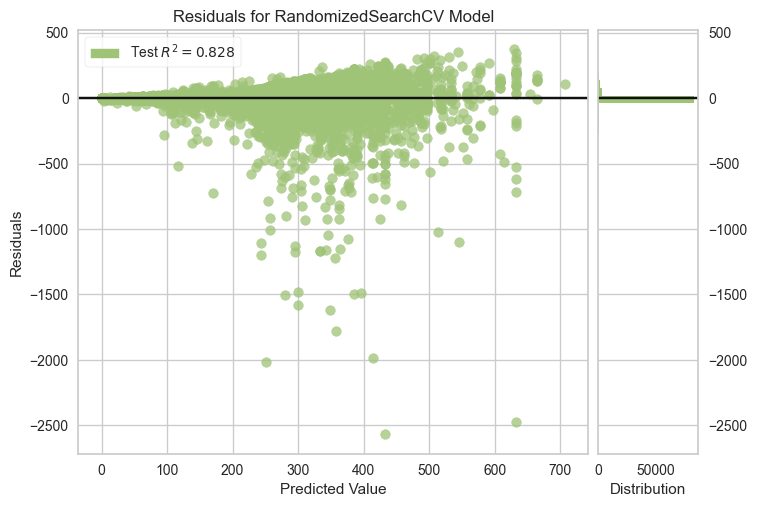

In [258]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
R2 Score: 0.6827394020814792
Mean Absolute Error: 25.072474343110873
Root Mean Squared Error: 56.84685019738298
Explained Variance Score: 0.6827412474778249
Huber Loss: 24.577862990092612


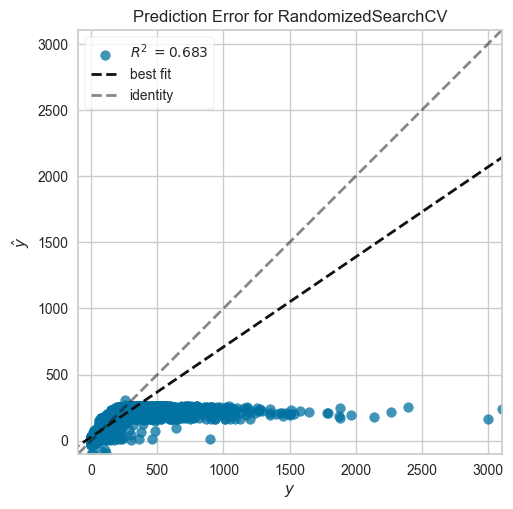

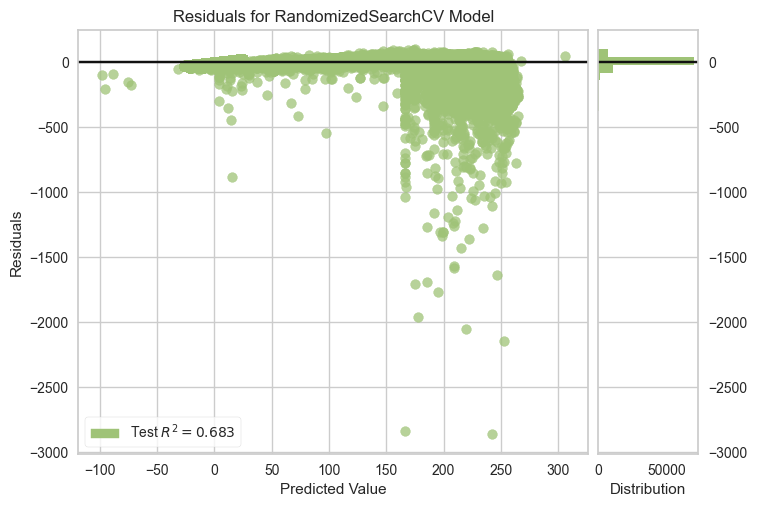

In [259]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.4s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.2s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.3s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.3s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.2s
[CV] END criterion=squared_error, max_features=auto, splitter=random; total time=   0.1s
[CV] END criterion=squared_error, max_features=auto, splitter=random; total time=   0.2s
[CV] END criterion=squared_error, max_features=auto, splitter=random; total time=   0.1s
[CV] END criterion=squared_error, max_features=auto, splitter=random; total time=   0.2s
[CV] END criterion=squared_error, max_features=auto, splitter=random; total time=   0.1s
[CV] END criterion=friedman_mse, max_features=log2, splitter=random; total time

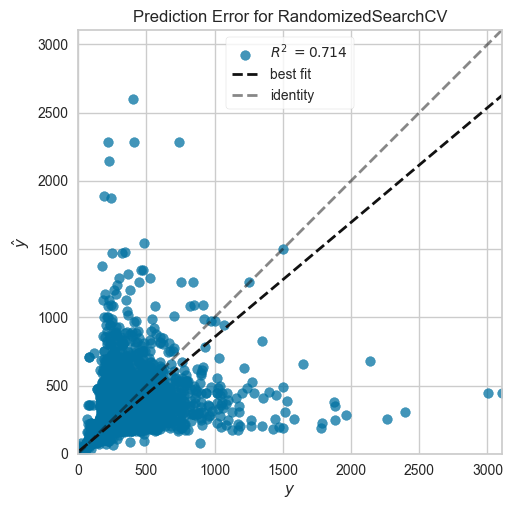

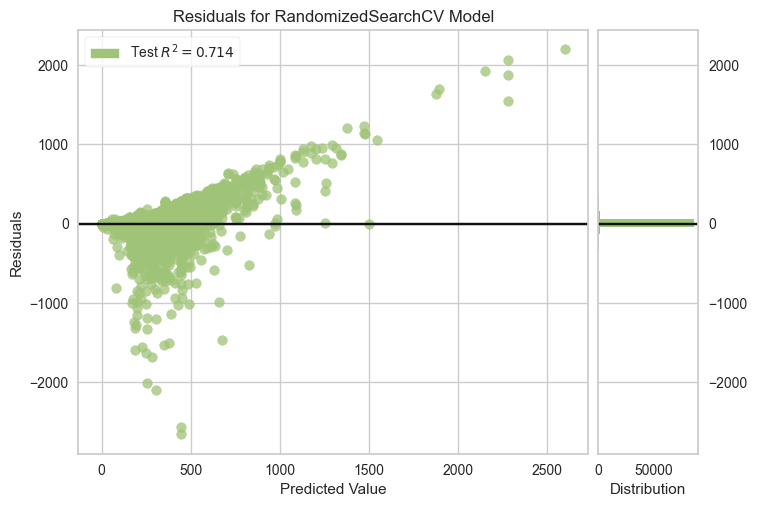

In [261]:
param_grid = {'criterion': ['squared_error','friedman_mse','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END .learning_rate=1, n_estimators=400;, score=0.781 total time=   7.8s
[CV 2/5] END .learning_rate=1, n_estimators=400;, score=0.829 total time=   7.6s
[CV 3/5] END .learning_rate=1, n_estimators=400;, score=0.811 total time=   7.5s
[CV 4/5] END .learning_rate=1, n_estimators=400;, score=0.780 total time=   7.9s
[CV 5/5] END .learning_rate=1, n_estimators=400;, score=0.771 total time=   7.5s
[CV 1/5] END learning_rate=0.7, n_estimators=400;, score=0.789 total time=   7.7s
[CV 2/5] END learning_rate=0.7, n_estimators=400;, score=0.836 total time=   7.4s
[CV 3/5] END learning_rate=0.7, n_estimators=400;, score=0.813 total time=   8.3s
[CV 4/5] END learning_rate=0.7, n_estimators=400;, score=0.794 total time=   7.7s
[CV 5/5] END learning_rate=0.7, n_estimators=400;, score=0.770 total time=   7.9s
[CV 1/5] END learning_rate=0.2, n_estimators=1000;, score=0.793 total time=  18.3s
[CV 2/5] END learning_rate=0.2, n_estimat

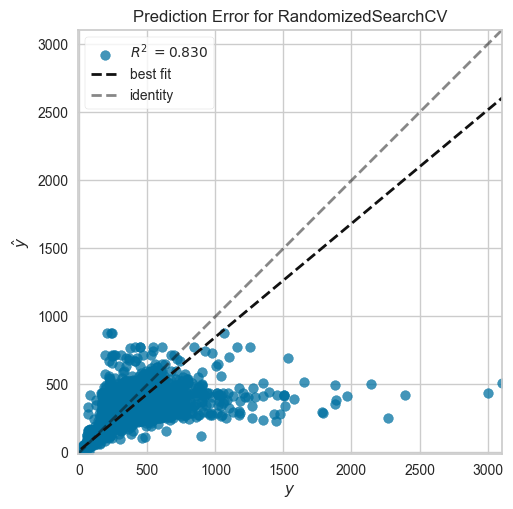

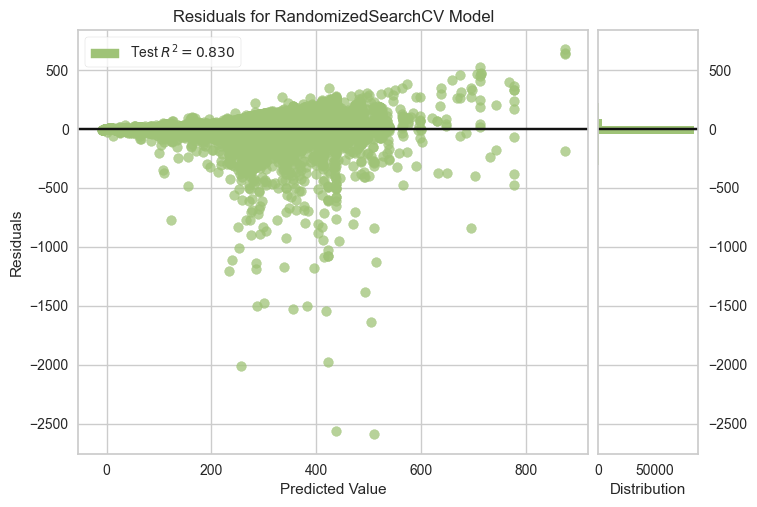

In [263]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}
    
grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END boosting_type=dart, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=1, n_estimators=500;, score=0.788 total time=  13.1s
[CV 2/5] END boosting_type=dart, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=1, n_estimators=500;, score=0.835 total time=  15.3s
[CV 3/5] END boosting_type=dart, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=1, n_estimators=500;, score=0.814 total time=  14.3s
[CV 4/5] END boosting_type=dart, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=1, n_estimators=500;, score=0.800 total time=  15.4s
[CV 5/5] END boosting_type=dart, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=1, n_estimators=500;, score=0.779 total time=  15.3s
[CV 1/5] END boosting_type=goss, importance_type=split, learning_rate=0.8, min_split_gain=1, n_estimators=300;, score=0.775 total time=   1.4s
[CV 2/

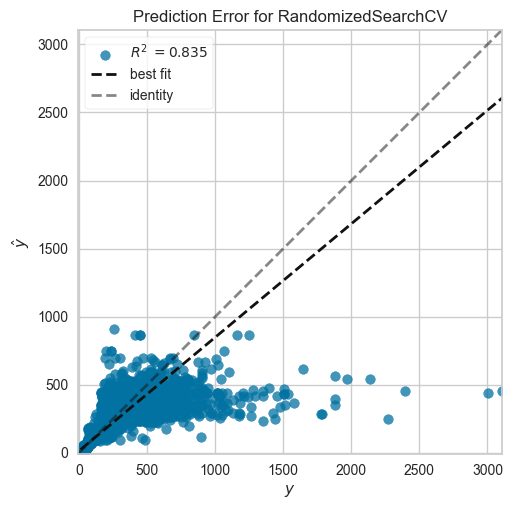

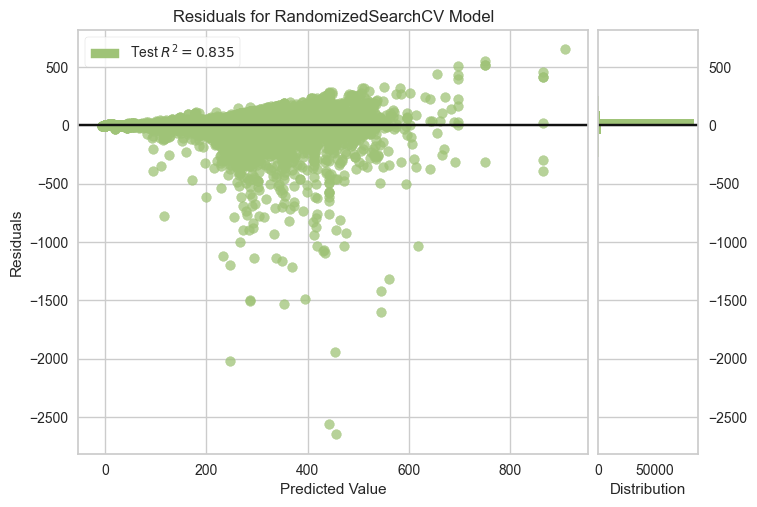

In [264]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
            'learning_rate': np.linspace(0,1,6)[1:],
            'n_estimators': [100,300,500,800,1000],
            'importance_type': ['split','gain'],
            'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lgbm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.1s
[CV 2/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[23:25:28] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "grow

[CV 4/5] END booster=dart, grow_policy=1, importance_type=total_gain, learning_rate=0.7, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, grow_policy=1, importance_type=total_gain, learning_rate=0.7, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, grow_policy=0, importance_type=total_cover, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, sco

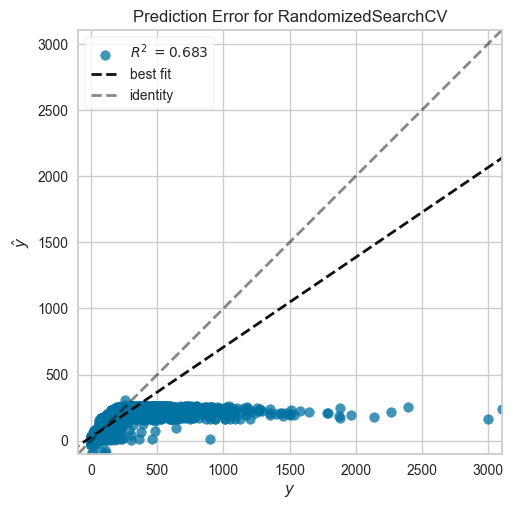

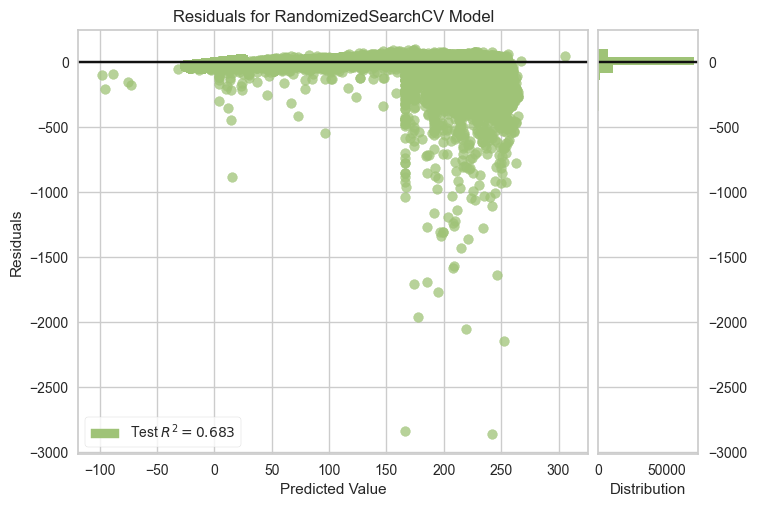

In [265]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.1, average=True, epsilon=44.44499999999999, l1_ratio=0.15, learning_rate=constant, loss=huber, penalty=l2, shuffle=False;, score=0.432 total time=   0.1s
[CV 2/5] END alpha=0.1, average=True, epsilon=44.44499999999999, l1_ratio=0.15, learning_rate=constant, loss=huber, penalty=l2, shuffle=False;, score=0.476 total time=   0.0s
[CV 3/5] END alpha=0.1, average=True, epsilon=44.44499999999999, l1_ratio=0.15, learning_rate=constant, loss=huber, penalty=l2, shuffle=False;, score=0.450 total time=   0.0s
[CV 4/5] END alpha=0.1, average=True, epsilon=44.44499999999999, l1_ratio=0.15, learning_rate=constant, loss=huber, penalty=l2, shuffle=False;, score=0.440 total time=   0.0s
[CV 5/5] END alpha=0.1, average=True, epsilon=44.44499999999999, l1_ratio=0.15, learning_rate=constant, loss=huber, penalty=l2, shuffle=False;, score=0.433 total time=   0.0s
[CV 1/5] END alpha=0.01, average=True, epsilon=11.11199999999999

[CV 5/5] END alpha=0.01, average=False, epsilon=11.111999999999998, l1_ratio=0.45, learning_rate=invscaling, loss=epsilon_insensitive, penalty=elasticnet, shuffle=True;, score=0.317 total time=   1.7s
[CV 1/5] END alpha=0.0001, average=False, epsilon=100.0, l1_ratio=0.45, learning_rate=invscaling, loss=absolute_error, penalty=l2, shuffle=True;, score=nan total time=   0.0s
[CV 2/5] END alpha=0.0001, average=False, epsilon=100.0, l1_ratio=0.45, learning_rate=invscaling, loss=absolute_error, penalty=l2, shuffle=True;, score=nan total time=   0.0s
[CV 3/5] END alpha=0.0001, average=False, epsilon=100.0, l1_ratio=0.45, learning_rate=invscaling, loss=absolute_error, penalty=l2, shuffle=True;, score=nan total time=   0.0s
[CV 4/5] END alpha=0.0001, average=False, epsilon=100.0, l1_ratio=0.45, learning_rate=invscaling, loss=absolute_error, penalty=l2, shuffle=True;, score=nan total time=   0.0s
[CV 5/5] END alpha=0.0001, average=False, epsilon=100.0, l1_ratio=0.45, learning_rate=invscaling, l

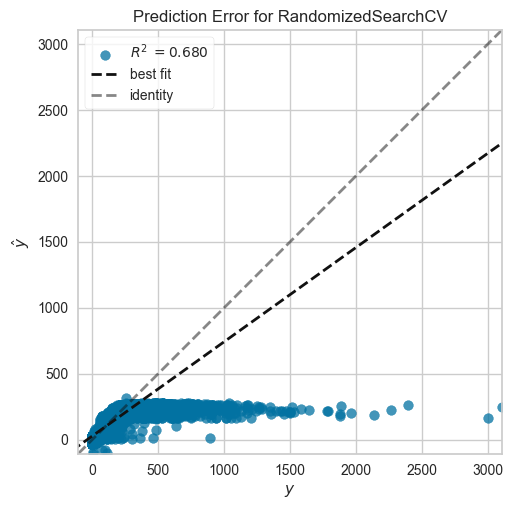

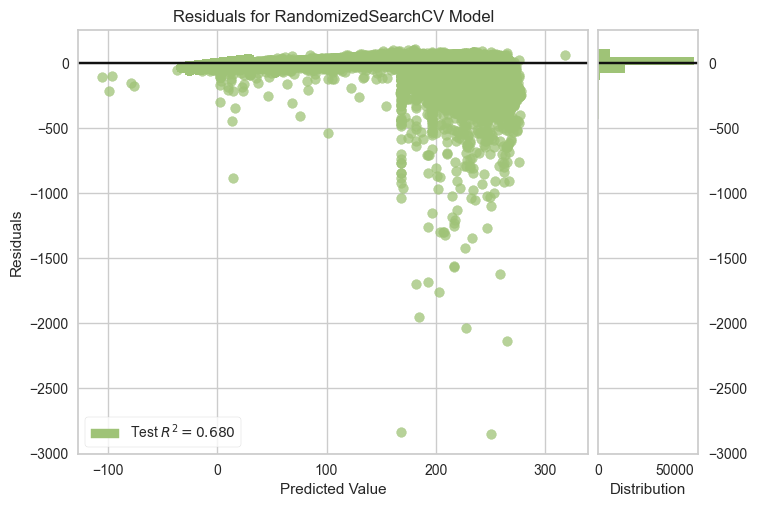

In [266]:
param_grid = {'loss': ['absolute_error','squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
            'penalty': ['l2', 'l1', 'elasticnet'],
            'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
            'alpha': [0.0001,0.001,0.01,0.1,1],
            'shuffle': [True,False],
            'learning_rate': ['adaptive','constant','optimal','invscaling'],
            'epsilon': np.linspace(0.001,100,10),
            'average': [True,False]
}

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=1.1112, epsilon=4.0; total time=   0.7s
[CV] END ..........................alpha=1.1112, epsilon=4.0; total time=   0.7s
[CV] END ..........................alpha=1.1112, epsilon=4.0; total time=   0.9s
[CV] END ..........................alpha=1.1112, epsilon=4.0; total time=   0.8s
[CV] END ..........................alpha=1.1112, epsilon=4.0; total time=   0.8s
[CV] END ..........................alpha=5.5556, epsilon=6.0; total time=   0.9s
[CV] END ..........................alpha=5.5556, epsilon=6.0; total time=   0.8s
[CV] END ..........................alpha=5.5556, epsilon=6.0; total time=   0.9s
[CV] END ..........................alpha=5.5556, epsilon=6.0; total time=   0.8s
[CV] END ..........................alpha=5.5556, epsilon=6.0; total time=   0.8s
[CV] END ..........................alpha=8.8889, epsilon=1.0; total time=   0.6s
[CV] END ..........................alpha=8.8889,

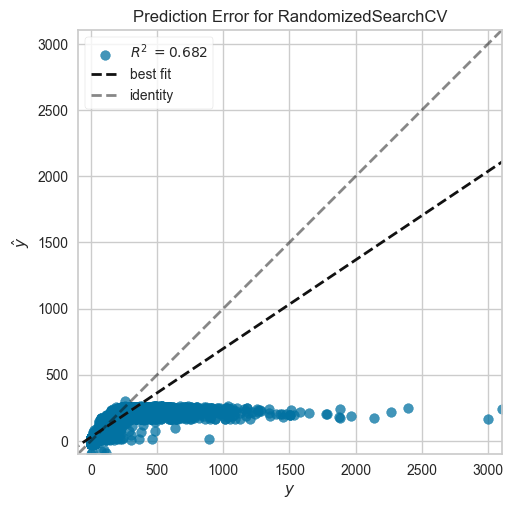

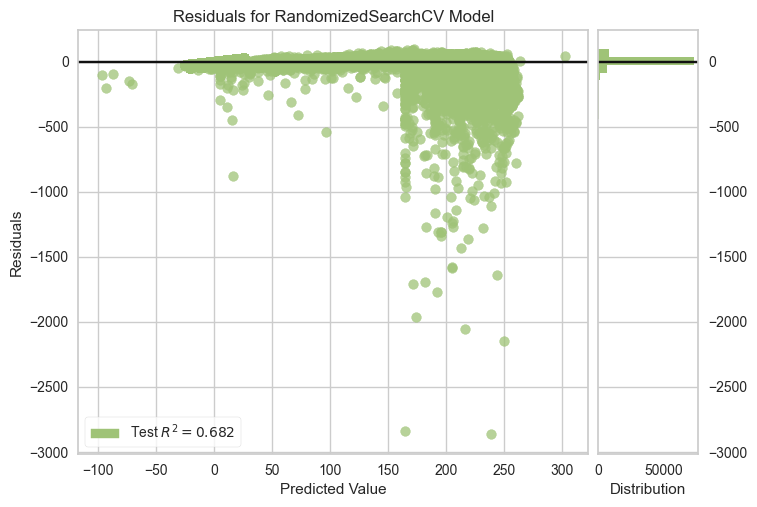

In [267]:
param_grid = {'epsilon': np.linspace(1,10,10),
              'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .....alpha=0.0001, link=log, solver=newton-cholesky; total time=   0.5s
[CV] END .....alpha=0.0001, link=log, solver=newton-cholesky; total time=   0.2s
[CV] END .....alpha=0.0001, link=log, solver=newton-cholesky; total time=   0.2s
[CV] END .....alpha=0.0001, link=log, solver=newton-cholesky; total time=   0.2s
[CV] END .....alpha=0.0001, link=log, solver=newton-cholesky; total time=   0.2s
[CV] END ..............alpha=6.6667, link=auto, solver=lbfgs; total time=   0.0s
[CV] END ..............alpha=6.6667, link=auto, solver=lbfgs; total time=   0.0s
[CV] END ..............alpha=6.6667, link=auto, solver=lbfgs; total time=   0.0s
[CV] END ..............alpha=6.6667, link=auto, solver=lbfgs; total time=   0.0s
[CV] END ..............alpha=6.6667, link=auto, solver=lbfgs; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.2s
[CV] END .....alpha=2.2223, link=log, solver=new

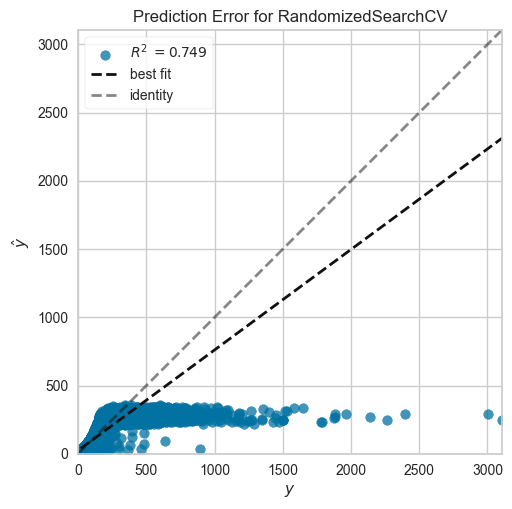

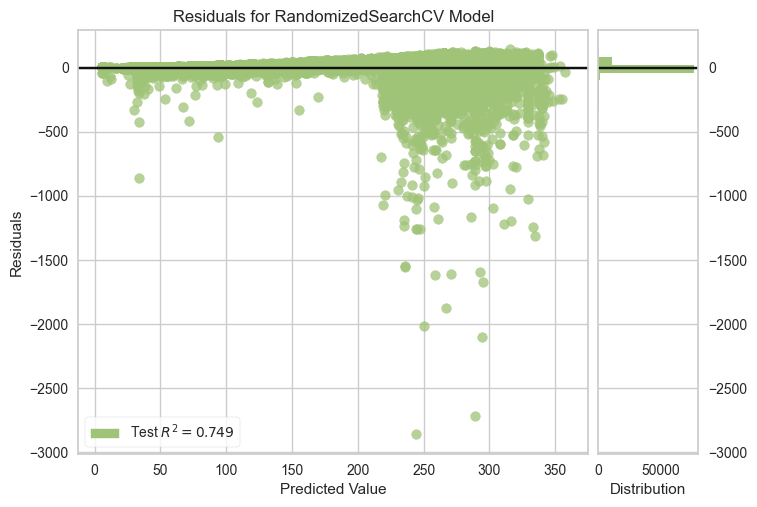

In [268]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.01, average=True, epsilon=0.25075, loss=epsilon_insensitive, shuffle=True; total time=   0.3s
[CV] END C=0.01, average=True, epsilon=0.25075, loss=epsilon_insensitive, shuffle=True; total time=   0.3s
[CV] END C=0.01, average=True, epsilon=0.25075, loss=epsilon_insensitive, shuffle=True; total time=   0.3s
[CV] END C=0.01, average=True, epsilon=0.25075, loss=epsilon_insensitive, shuffle=True; total time=   0.3s
[CV] END C=0.01, average=True, epsilon=0.25075, loss=epsilon_insensitive, shuffle=True; total time=   0.4s
[CV] END C=0.001, average=True, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   1.5s
[CV] END C=0.001, average=True, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   1.5s
[CV] END C=0.001, average=True, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   1.4s
[CV] END C=0.001, average=True, epsilon=0.75025, loss=epsilon_insensitive, shuff

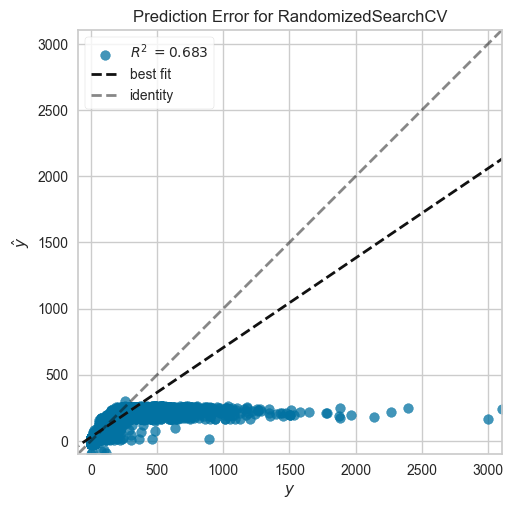

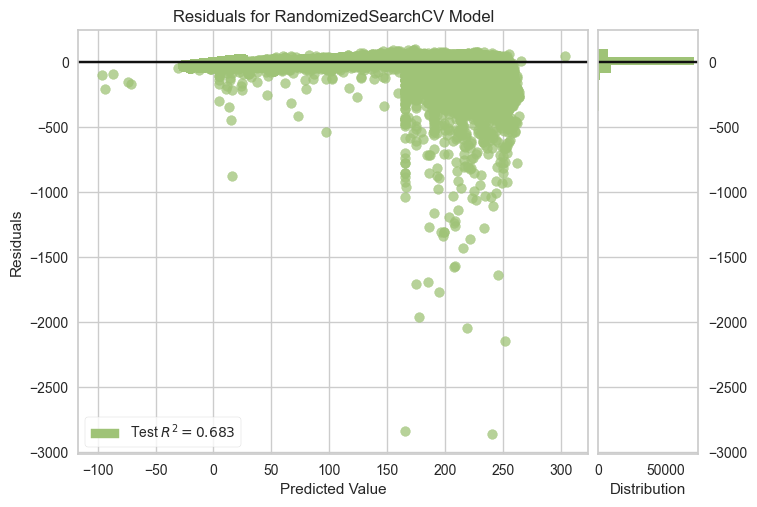

In [269]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=cyclic; total ti

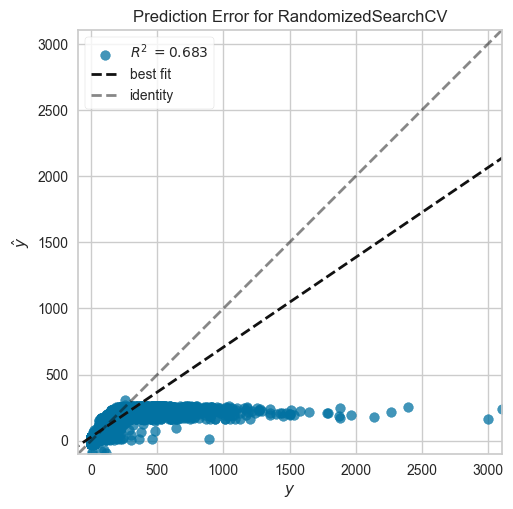

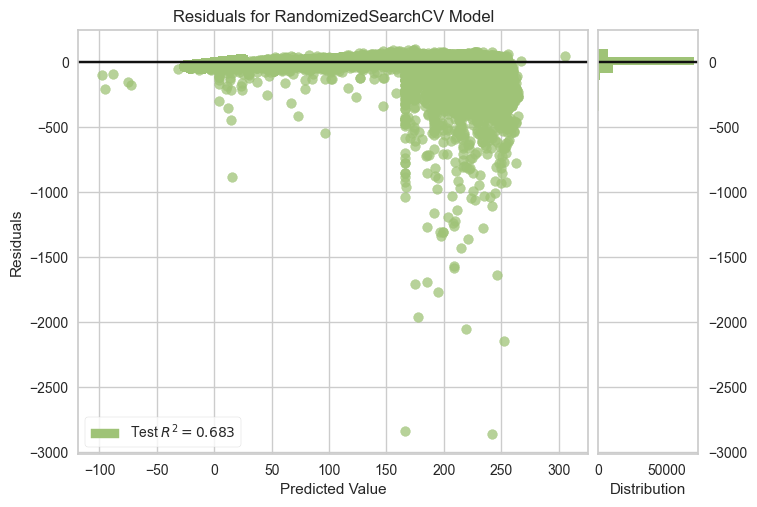

In [270]:
param_grid = {
        'alpha': [0.001,0.01,0.1],
        'positive': [True,False],
        'selection': ['cyclic','random'],
        'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=saga; total time=   0.8s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=saga; total time=   0.9s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=saga; total time=   0.9s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=saga; total time=   0.9s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=saga; total time=   0.7s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=sag; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=sag; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=sag; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=sag; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=sag; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, s

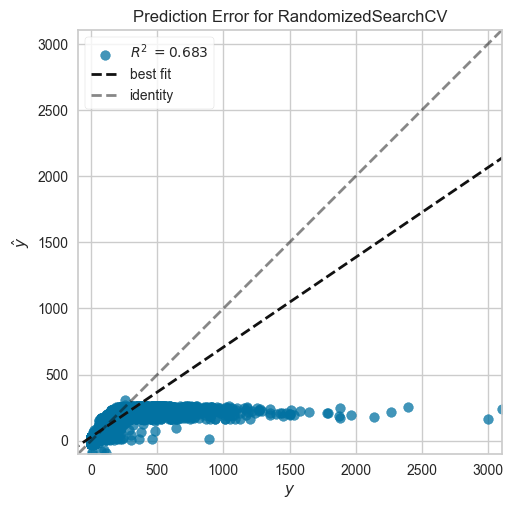

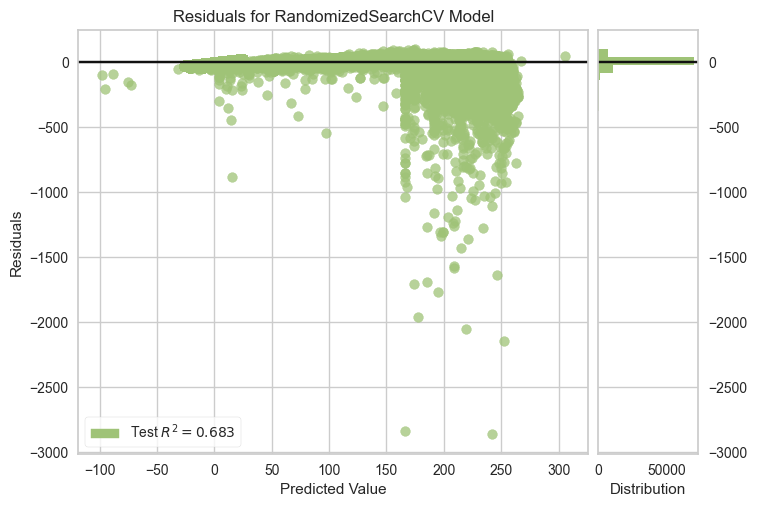

In [271]:
param_grid = {
        'alpha': [0.001,0.01,0.1],
        'positive': [True,False],
        'fit_intercept': [True,False],
        'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, l1_ratio=0.3, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, l1_ratio=0.3, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, l1_ratio=0.3, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, l1_ratio=0.3, positive=True, selection=cy

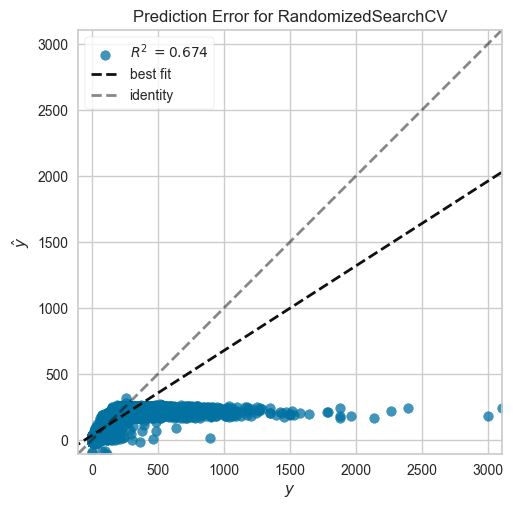

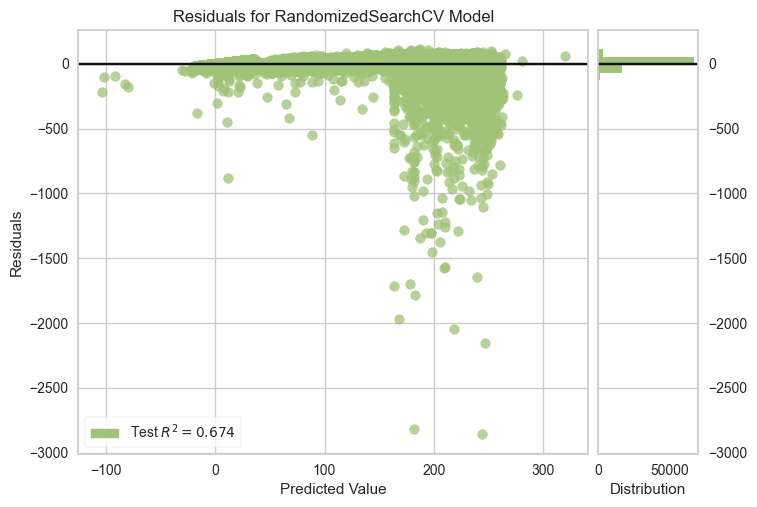

In [272]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-05, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-07; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=

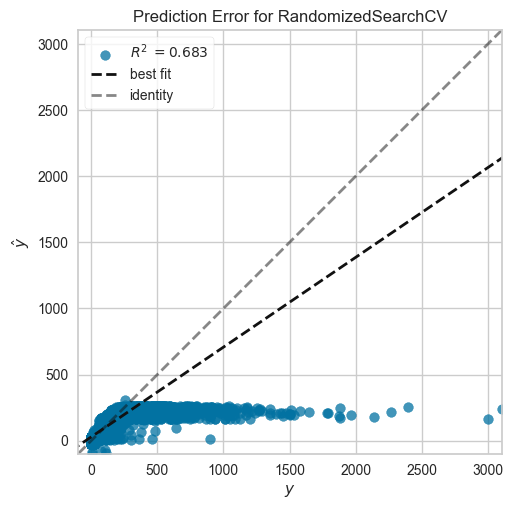

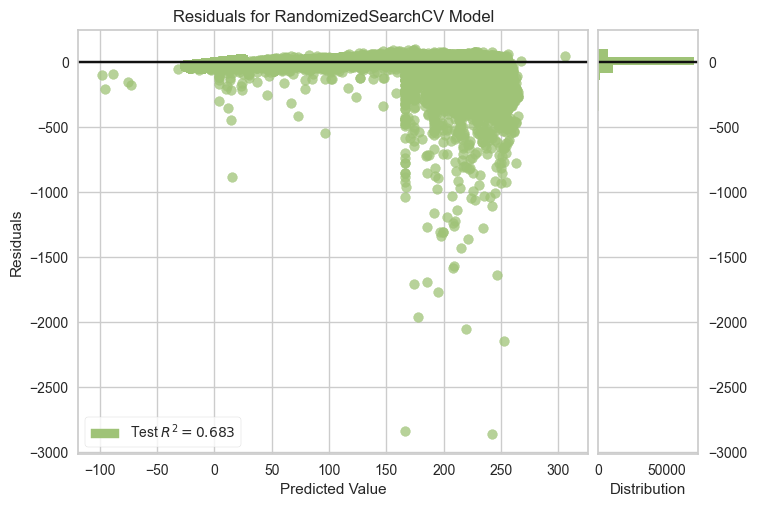

In [273]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
    'alpha_2': [1e-5,1e-6,1e-7,1e-8],
    'lambda_1': [1e-5,1e-6,1e-7,1e-8],
    'lambda_2': [1e-5,1e-6,1e-7,1e-8],
    'fit_intercept': [True,False],
    'compute_score': [True,False]
}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.1s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

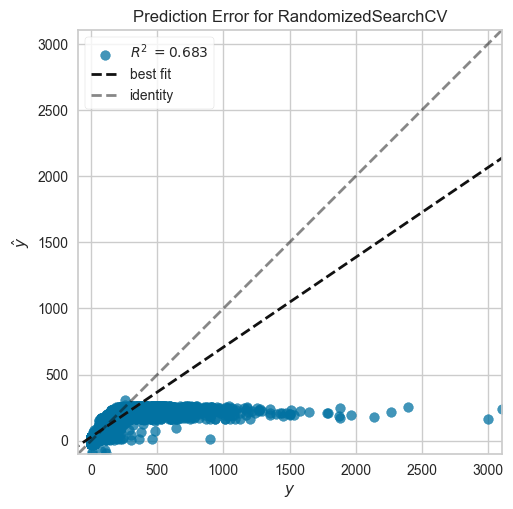

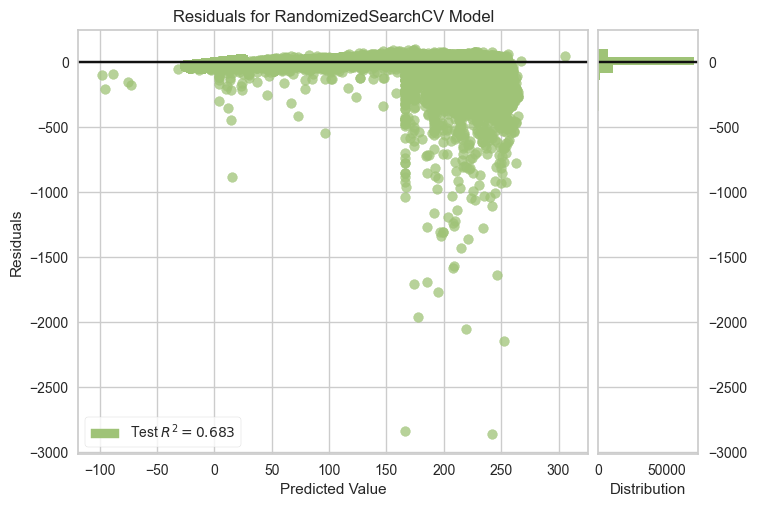

In [274]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.1s
[CV] END alpha=0.1, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.1s
[CV] END alpha=0.1, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.1s
[CV] END alpha=0.1, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.1s
[CV] END alpha=0.1, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.1s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.1s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.1s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False

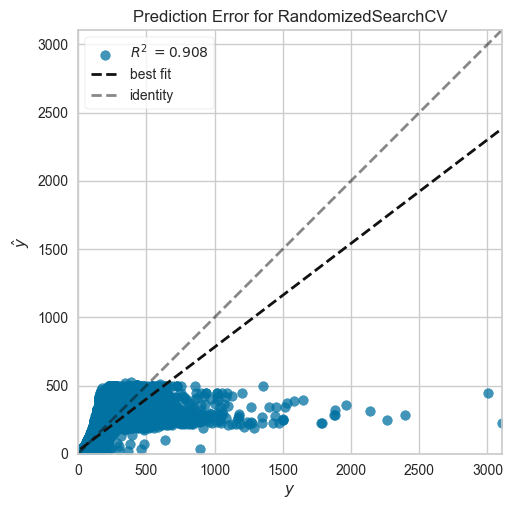

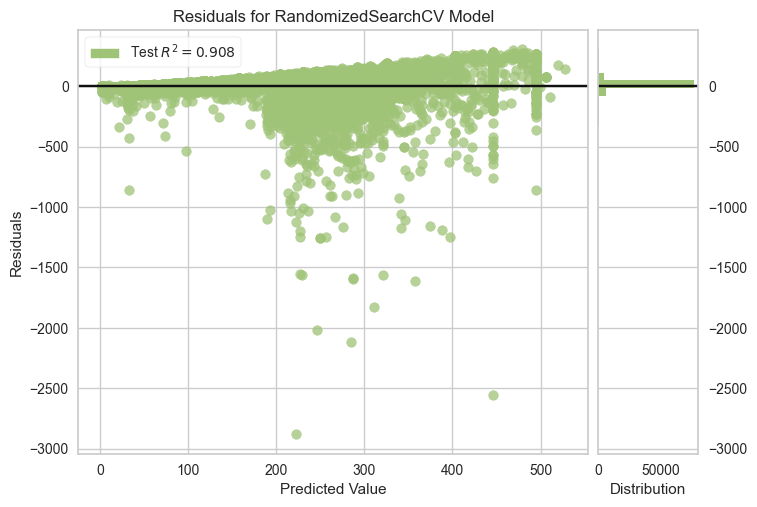

In [275]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=absolute_error, min_samples=0.75, stop_probability=0.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=0.75, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.75, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.75, stop_probability=0.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=0.75, stop_probability=0.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=0.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=0.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=0.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=0.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probabi

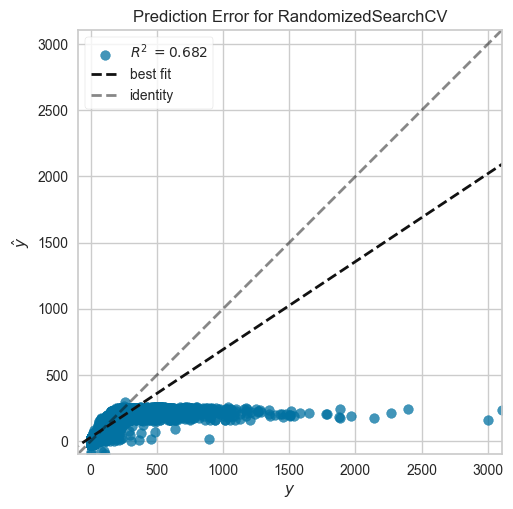

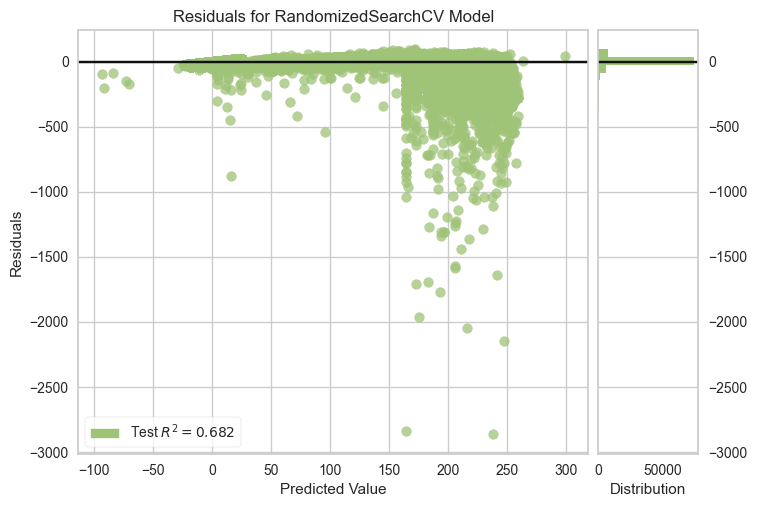

In [276]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-

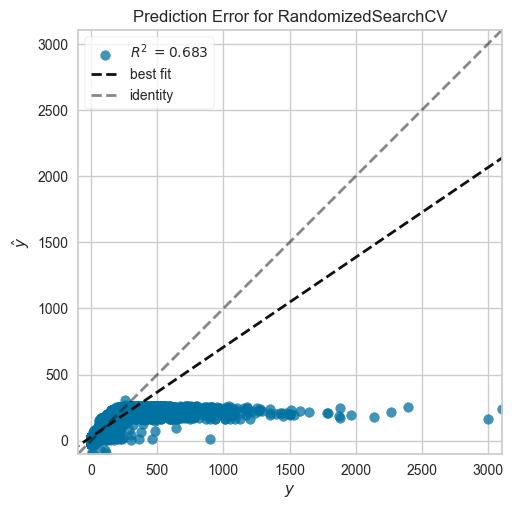

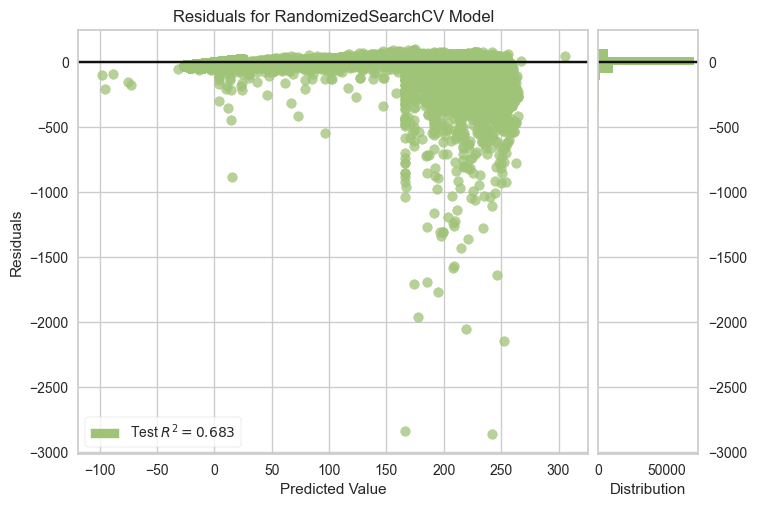

In [278]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
            'alpha_2': [1e-5,1e-6,1e-7,1e-8],
            'lambda_1': [1e-5,1e-6,1e-7,1e-8],
            'lambda_2': [1e-5,1e-6,1e-7,1e-8],
            'fit_intercept': [True,False],
            'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=  13.7s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=  20.7s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=  19.0s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=  15.4s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=  18.9s
[CV] END .learning_rate=0.001, loss=square, n_estimators=200; total time=  50.7s
[CV] END .learning_rate=0.001, loss=square, n_estimators=200; total time=  50.1s
[CV] END .learning_rate=0.001, loss=square, n_estimators=200; total time=  50.7s
[CV] END .learning_rate=0.001, loss=square, n_estimators=200; total time=  50.7s
[CV] END .learning_rate=0.001, loss=square, n_estimators=200; total time=  50.7s
[CV] END .....learning_rate=1, loss=linear, n_estimators=500; total time=   1.6s
[CV] END .....learning_rate=1, loss=linear, n_es

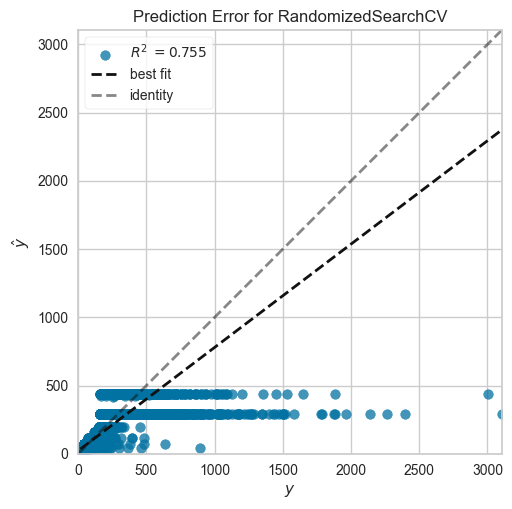

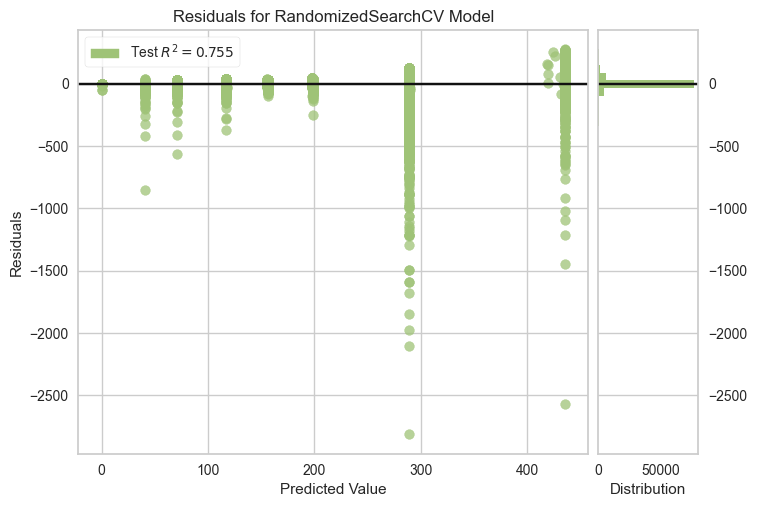

In [279]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=500, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=500, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=500, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=500, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=500, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=auto, max_samples=0.9, n_estimato

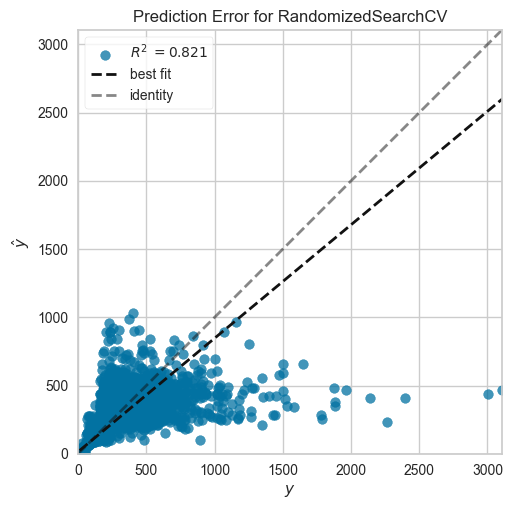

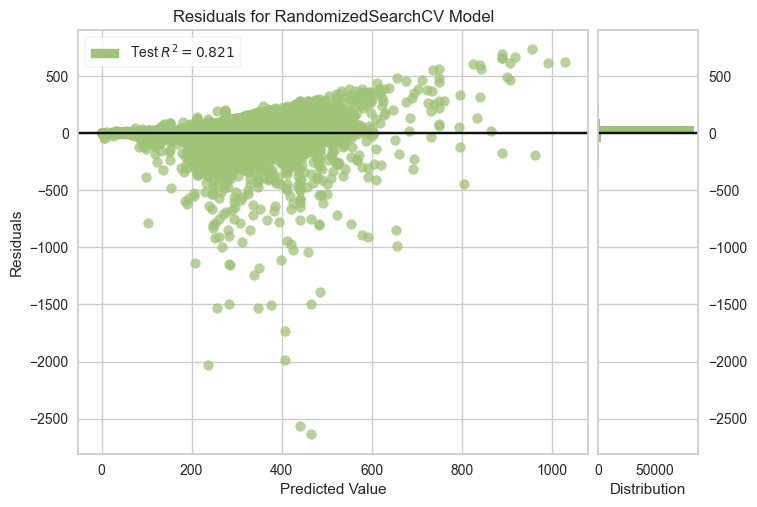

In [280]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END booster=gbtree, importance_type=weight, learning_rate=0.01, n_estimators=500; total time= 1.1min
[CV] END booster=gbtree, importance_type=weight, learning_rate=0.01, n_estimators=500; total time=  57.0s
[CV] END booster=gbtree, importance_type=weight, learning_rate=0.01, n_estimators=500; total time=  55.3s
[CV] END booster=gbtree, importance_type=weight, learning_rate=0.01, n_estimators=500; total time=  55.1s
[CV] END booster=gbtree, importance_type=weight, learning_rate=0.01, n_estimators=500; total time=  55.3s
[CV] END booster=dart, importance_type=gain, learning_rate=0.1, n_estimators=200; total time=  23.4s
[CV] END booster=dart, importance_type=gain, learning_rate=0.1, n_estimators=200; total time=  23.1s
[CV] END booster=dart, importance_type=gain, learning_rate=0.1, n_estimators=200; total time=  23.4s
[CV] END booster=dart, importance_type=gain, learning_rate=0.1, n_estimators=200; total time=  23.9s
[CV] 

[CV] END booster=dart, importance_type=cover, learning_rate=0.001, n_estimators=800; total time= 1.4min
[CV] END booster=dart, importance_type=cover, learning_rate=0.001, n_estimators=800; total time= 1.4min
[CV] END booster=dart, importance_type=cover, learning_rate=0.001, n_estimators=800; total time= 1.4min
[CV] END booster=dart, importance_type=cover, learning_rate=0.001, n_estimators=800; total time= 1.4min
[CV] END booster=dart, importance_type=cover, learning_rate=0.001, n_estimators=800; total time= 1.4min
R2 Score: 0.8162749372919169
Mean Absolute Error: 10.575695350508386
Root Mean Squared Error: 43.259603943408216
Explained Variance Score: 0.8162770819556482
Huber Loss: 10.240033840356418


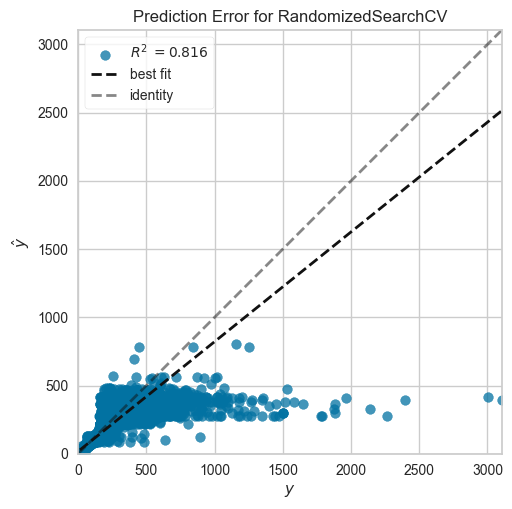

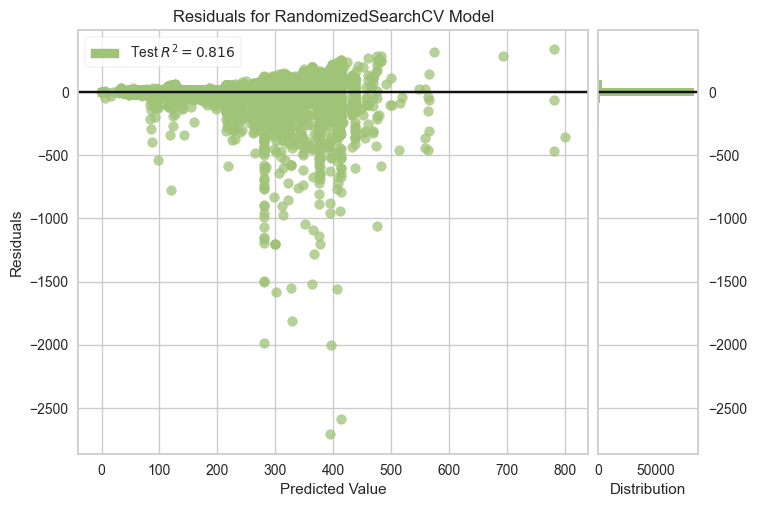

In [281]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

In [283]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=0.25, n_estimators=500, oob_score=False, warm_start=True; total time= 2.7min
[CV] E

KeyboardInterrupt: 

In [295]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


KeyboardInterrupt: 

In [296]:
param_grid =  {'loss': ['squared_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }
    
grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


KeyboardInterrupt: 

## Optimized Models Performance Comparison

In [284]:
model_perfs = pd.DataFrame({'model': models, 
                            'R2': r2_scores, 
                            'MAE': mae_scores, 
                            'RMSE': rmse_scores,
                            'Huber Loss': huber_losses,
                            'Explained Variance Score': explained_variance_scores}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,model,R2,MAE,RMSE,Huber Loss,Explained Variance Score
0,"VotingRegressor(estimators=[('HGB', HistGradie...",0.835517,7.492631,40.931660,7.175679,0.835518
1,LGBMRegressor(),0.834930,7.750104,41.004634,7.416057,0.834931
2,"RandomizedSearchCV(cv=5, estimator=LGBMRegress...",0.834721,7.670750,41.030524,7.324462,0.834723
3,HistGradientBoostingRegressor(),0.833922,7.925297,41.129561,7.563580,0.833924
4,"StackingRegressor(estimators=[('HGB', HistGrad...",0.833349,7.706656,41.200500,7.413154,0.833351
5,<catboost.core.CatBoostRegressor object at 0x0...,0.831331,7.415970,41.449168,7.099744,0.831332
6,"XGBRegressor(base_score=None, booster=None, ca...",0.830822,7.524610,41.511675,7.208640,0.830823
7,"RandomizedSearchCV(cv=5,\n e...",0.830306,8.023421,41.574912,7.647948,0.830307
8,"RandomizedSearchCV(cv=5, estimator=HistGradien...",0.828451,8.519932,41.801607,8.211208,0.828451
9,([DecisionTreeRegressor(criterion='friedman_ms...,0.822718,9.233205,42.494260,8.789923,0.822721


In [285]:
best_model = model_perfs.iloc[0]['model']
best_model

VotingRegressor(estimators=[('HGB', HistGradientBoostingRegressor()),
                            ('LGBM', LGBMRegressor()),
                            ('CAT',
                             <catboost.core.CatBoostRegressor object at 0x000001C380408730>)],
                verbose=2)

In [287]:
mean_cv_r2_score = np.round(np.mean(cross_val_score(best_model,final_X_test,y_test,scoring='r2'))*100,2)
print(f"Mean test cross validation R2 score: {mean_cv_r2_score}%")
del mean_cv_r2_score
gc.collect()

[Voting] ...................... (1 of 3) Processing HGB, total=   1.1s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.7s
[Voting] ...................... (3 of 3) Processing CAT, total=  16.1s
[Voting] ...................... (1 of 3) Processing HGB, total=   1.2s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.4s
[Voting] ...................... (3 of 3) Processing CAT, total=  11.1s
[Voting] ...................... (1 of 3) Processing HGB, total=   0.7s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.4s
[Voting] ...................... (3 of 3) Processing CAT, total=  12.3s
[Voting] ...................... (1 of 3) Processing HGB, total=   0.8s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.4s
[Voting] ...................... (3 of 3) Processing CAT, total=  12.2s
[Voting] ...................... (1 of 3) Processing HGB, total=   0.5s
[Voting] ..................... (2 of 3) Processing LGBM, total=   0.2s
[Votin

22717

In [289]:
print("Train R2 score:",np.round(best_model.score(final_X_train,y_train)*100,2))

Train R2 score: 82.72


## Saving the best performing model for deployment into production

In [290]:
pipeline = Pipeline(steps=[
    ('transformer',transformer),
    ('scaler',scaler),
    ('model',best_model)
])
pipeline

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['base_fare', 'tip']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['meter_rate',
                                                   'trip_duration',
                                                   'miscellaneous_fees'])])),
                ('scaler', MinMaxScaler()),
                ('model',
                 VotingRegressor(estimators=[('HGB',
                                              HistGradientBoostingRegressor()),
                                             ('LGBM', LGBMRegressor()),
                                             ('CAT',
                                              <catboost.core.CatBoostRegressor object at 0x000001C380408730>)],
                                 verbose=2))])

In [291]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [292]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['base_fare', 'tip']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['meter_rate',
                                                   'trip_duration',
                                                   'miscellaneous_fees'])])),
                ('scaler', MinMaxScaler()),
                ('model',
                 VotingRegressor(estimators=[('HGB',
                                              HistGradientBoostingRegressor()),
                                             ('LGBM', LGBMRegressor()),
                                             ('CAT',
                                              <catboost.core.CatBoostRegressor object at 0x000001C62F81CA30>)],
                                 verbose=2))])

In [293]:
gc.collect()

480

In [294]:
for col in final_X_train.columns:
    print(f"Minimum value of {col}:",df[col].min())
    print(f"Maximum value of {col}:",df[col].max())

Minimum value of meter_rate: 0.0
Maximum value of meter_rate: 45.420680712017045
Minimum value of trip_duration: 281.0
Maximum value of trip_duration: 1666.0
Minimum value of miscellaneous_fees: 5.949999999999989
Maximum value of miscellaneous_fees: 30.375
Minimum value of tip: 0
Maximum value of tip: 33
Minimum value of fare: 0.0
Maximum value of fare: 157.5
